<a href="https://colab.research.google.com/github/personallypetra/Grand_Challenge-/blob/Wind-%26-Factories/Grand_Challenge_wind_cleaned.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Factories Data Inspection

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
df_factories= pd.read_csv("F1_4_Air_Releases_Facilities.csv")

## 1. Basic Structure

In [1]:
print(f"Shape: {df_factories.shape[0]:,} rows x {df_factories.shape[1]} columns")
print(f"\nColumns: {list(df_factories.columns)}")
print(f"\nData types:")
print(df_factories.dtypes)

NameError: name 'df_factories' is not defined

In [ ]:
# ============================================================
# 2. FIRST & LAST ROWS
# ============================================================
print("\n" + "=" * 60)
print("2. SAMPLE ROWS")
print("=" * 60)
df_factories.head()


2. SAMPLE ROWS


,PublicationDate,countryName,reportingYear,EPRTR_SectorCode,EPRTR_SectorName,EPRTRAnnexIMainActivity,FacilityInspireId,facilityName,city,Longitude,Latitude,addressConfidentialityReason,TargetRelease,Pollutant,Releases,confidentialityReason
0,2026/02/13,Germany,2013,1.0,Energy sector,1(e),https://registry.gdi-de.org/id/de.nw.inspire.p...,RWE Power AG-Fabrik Fortuna Nord,Bergheim,6.658050,50.986950,NaN,AIR,Sulphur oxides (SOX),824000.0,NaN
1,2026/02/13,Sweden,2020,7.0,Intensive livestock production and aquaculture,7(a)(i),SE.CAED/10017896.Facility,Skåneägg Produktion AB,MÖRARP,12.849550,56.053160,NaN,AIR,Ammonia (NH3),16300.0,NaN
2,2026/02/13,Romania,2013,5.0,Waste and wastewater management,5(d),RO.CAED/104TL0001.FACILITY,SC ECOREC SA,TULCEA,28.769671,45.190459,NaN,AIR,Methane (CH4),269000.0,NaN
3,2026/02/13,Italy,2021,7.0,Intensive livestock production and aquaculture,7(a),IT.CAED/370602036.FACILITY,RONCHETRIN 1,GAZZO VERONESE,11.106667,45.123611,NaN,AIR,Ammonia (NH3),31920.0,NaN
4,2026/02/13,Czechia,2007,1.0,Energy sector,1(c),CZ.MZP.U423/CZ14819275.FACILITY,energetika,Štětí,14.380370,50.462296,NaN,AIR,Sulphur oxides (SOX),507000.0,NaN


In [ ]:
df_factories = df_factories[df_factories["countryName"] == "Italy"].copy()

In [ ]:
df_factories = df_factories[(df_factories["reportingYear"].between(2021, 2024))
].copy()



In [ ]:
# ============================================================
# 3. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("3. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(df_factories.describe())

print("\n" + "=" * 60)
print("3b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
print(df_factories.describe(include="object"))


3. SUMMARY STATISTICS (Numeric)
       reportingYear  EPRTR_SectorCode    Longitude     Latitude      Releases
count    6867.000000       6863.000000  6796.000000  6796.000000  6.867000e+03
mean     2022.463230          4.928894    11.303383    44.033133  6.236431e+07
std         1.119529          2.518289     2.369998     2.238101  3.247260e+08
min      2021.000000          1.000000     7.291100    36.903056  1.020000e-04
25%      2021.000000          3.000000     9.766700    43.587200  1.225400e+04
50%      2022.000000          7.000000    10.845300    45.040550  2.360000e+04
75%      2023.000000          7.000000    12.474305    45.409900  2.158281e+05
max      2024.000000          9.000000    18.318000    46.655000  7.352727e+09

3b. SUMMARY STATISTICS (Categorical)
       PublicationDate countryName  \
count             6867        6867   
unique               1           1   
top         2026/02/13       Italy   
freq              6867        6867   

                           


4. MISSING DATA
                              count  percent
confidentialityReason          6867   100.00
addressConfidentialityReason   6796    98.97
Longitude                        71     1.03
Latitude                         71     1.03
EPRTR_SectorCode                  4     0.06
EPRTR_SectorName                  4     0.06
EPRTRAnnexIMainActivity           4     0.06
PublicationDate                   0     0.00
facilityName                      0     0.00
FacilityInspireId                 0     0.00
countryName                       0     0.00
reportingYear                     0     0.00
city                              0     0.00
TargetRelease                     0     0.00
Pollutant                         0     0.00
Releases                          0     0.00


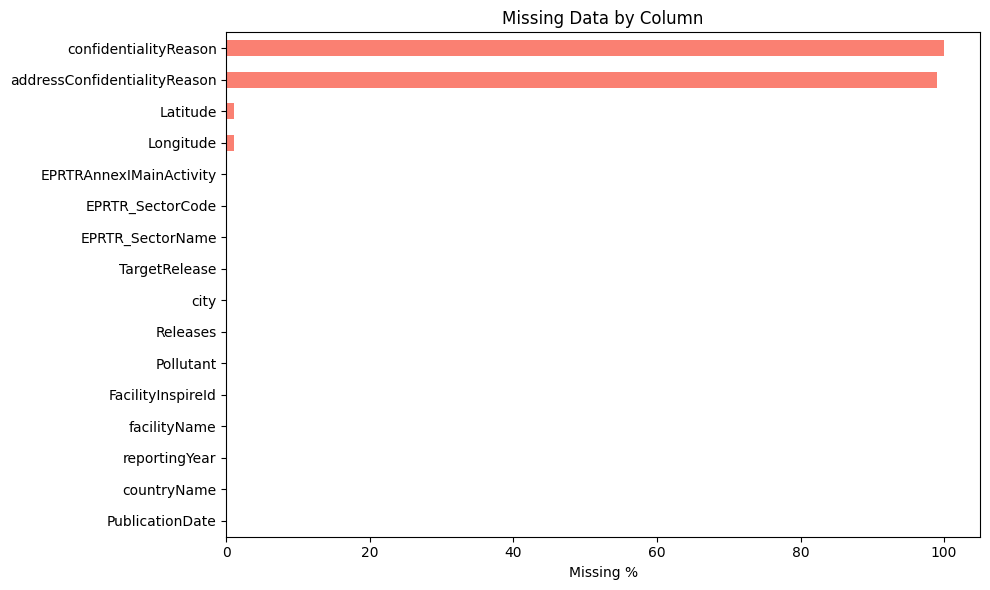

In [ ]:
# ============================================================
# 4. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("4. MISSING DATA")
print("=" * 60)
nulls = df_factories.isna().sum()
null_pct = (df_factories.isna().sum() / len(df_factories) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())

fig, ax = plt.subplots(figsize=(10, 6))
null_pcts = (df_factories.isna().sum() / len(df_factories) * 100).sort_values(ascending=True)
null_pcts.plot(kind="barh", ax=ax, color="salmon")
ax.set_xlabel("Missing %")
ax.set_title("Missing Data by Column")
plt.tight_layout()
plt.show()


In [ ]:
"""
Zero Value Inspection - Factories Dataset (better chart)
"""

import pandas as pd
import matplotlib.pyplot as plt

numeric_cols = df_factories.select_dtypes(include="number").columns
total_rows = len(df_factories)

print(f"Total rows: {total_rows:,}")
print(f"Numeric columns: {len(numeric_cols)}\n")

zero_summary = []
for col in numeric_cols:
    zero_count = (df_factories[col] == 0).sum()
    zero_pct = (zero_count / total_rows * 100)
    null_count = df_factories[col].isna().sum()
    zero_summary.append({
        "column": col,
        "zeros": zero_count,
        "zero_%": round(zero_pct, 2),
        "nulls": null_count,
        "total_valid": total_rows - null_count,
    })

zero_df = pd.DataFrame(zero_summary).sort_values("zero_%", ascending=False)
print(zero_df.to_string(index=False))



Total rows: 6,867
Numeric columns: 5

          column  zeros  zero_%  nulls  total_valid
   reportingYear      0     0.0      0         6867
EPRTR_SectorCode      0     0.0      4         6863
       Longitude      0     0.0     71         6796
        Latitude      0     0.0     71         6796
        Releases      0     0.0      0         6867


In [ ]:

# ============================================================
# 5. UNIQUE VALUES PER COLUMN
# ============================================================
print("\n" + "=" * 60)
print("5. UNIQUE VALUES PER COLUMN")
print("=" * 60)
for col in df_factories.columns:
    print(f"  {col}: {df_factories[col].nunique()} unique")


5. UNIQUE VALUES PER COLUMN
  PublicationDate: 1 unique
  countryName: 1 unique
  reportingYear: 4 unique
  EPRTR_SectorCode: 9 unique
  EPRTR_SectorName: 9 unique
  EPRTRAnnexIMainActivity: 37 unique
  FacilityInspireId: 1638 unique
  facilityName: 1559 unique
  city: 1065 unique
  Longitude: 1578 unique
  Latitude: 1543 unique
  addressConfidentialityReason: 1 unique
  TargetRelease: 1 unique
  Pollutant: 38 unique
  Releases: 6050 unique
  confidentialityReason: 0 unique


In [ ]:

# ============================================================
# 6. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("6. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nTop 15 Pollutants:")
print(df_factories["Pollutant"].value_counts().head(15))

print("\nReporting Year distribution:")
print(df_factories["reportingYear"].value_counts().sort_index())



6. KEY DISTRIBUTIONS

Top 15 Pollutants:
Pollutant
Ammonia (NH3)                                     3270
Nitrogen oxides (NOX)                              788
Carbon dioxide (CO2)                               702
Methane (CH4)                                      364
Non-methane volatile organic compounds (NMVOC)     287
Sulphur oxides (SOX)                               152
Hydro-fluorocarbons (HFCS)                         136
Carbon monoxide (CO)                               135
Nitrous oxide (N2O)                                129
Zinc and compounds (as Zn)                         123
Benzene                                             94
Mercury and compounds (as Hg)                       81
Arsenic and compounds (as As)                       64
Nickel and compounds (as Ni)                        60
Cadmium and compounds (as Cd)                       50
Name: count, dtype: int64

Reporting Year distribution:
reportingYear
2021    1792
2022    1759
2023    1659
2024    1657
N

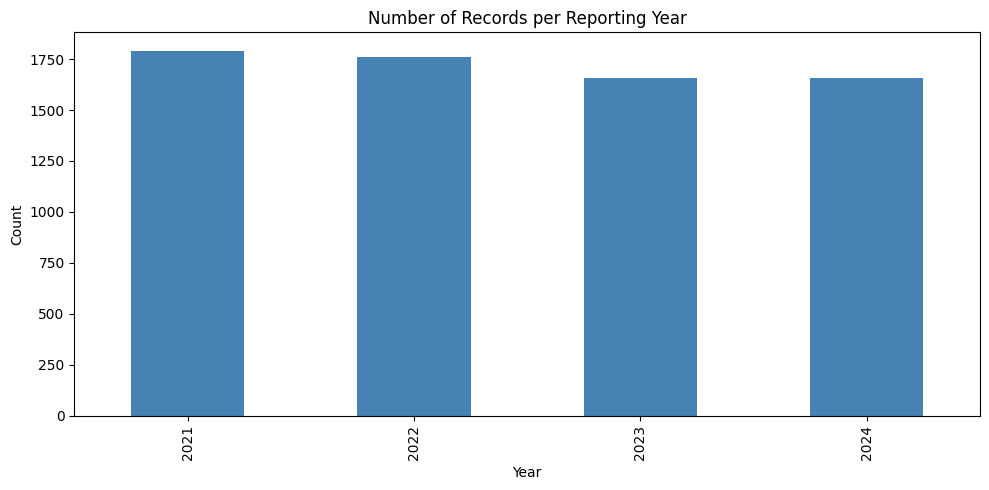

In [ ]:

# ============================================================
# 7. PLOTS
# ============================================================

# 7a. Reporting Year distribution
fig, ax = plt.subplots(figsize=(10, 5))
df_factories["reportingYear"].value_counts().sort_index().plot(kind="bar", ax=ax, color="steelblue")
ax.set_title("Number of Records per Reporting Year")
ax.set_xlabel("Year")
ax.set_ylabel("Count")
plt.tight_layout()
plt.show()



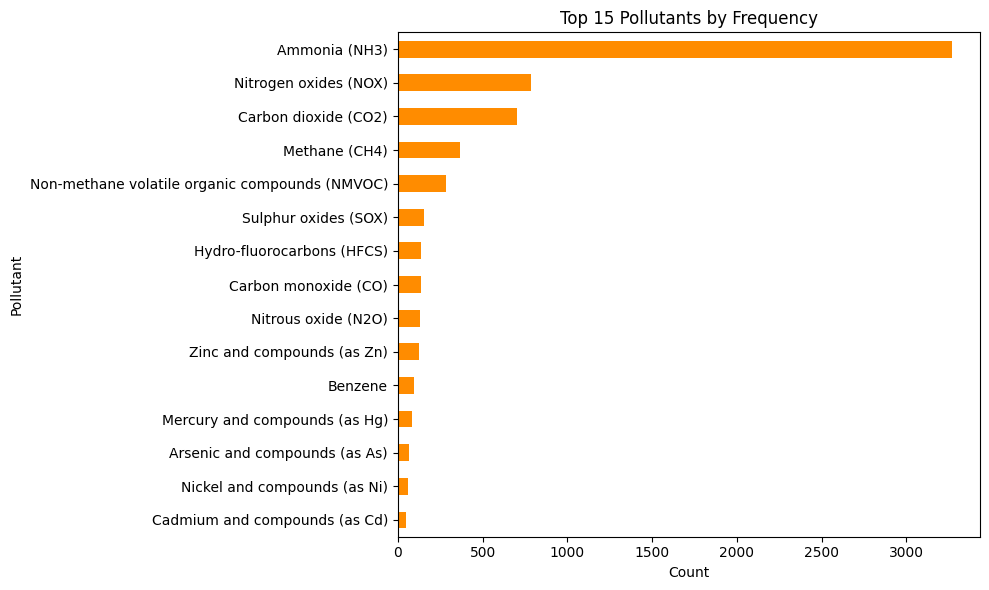

In [ ]:
# 7b. Top pollutants
fig, ax = plt.subplots(figsize=(10, 6))
df_factories["Pollutant"].value_counts().head(15).plot(kind="barh", ax=ax, color="darkorange")
ax.set_title("Top 15 Pollutants by Frequency")
ax.set_xlabel("Count")
ax.invert_yaxis()
plt.tight_layout()
plt.show()

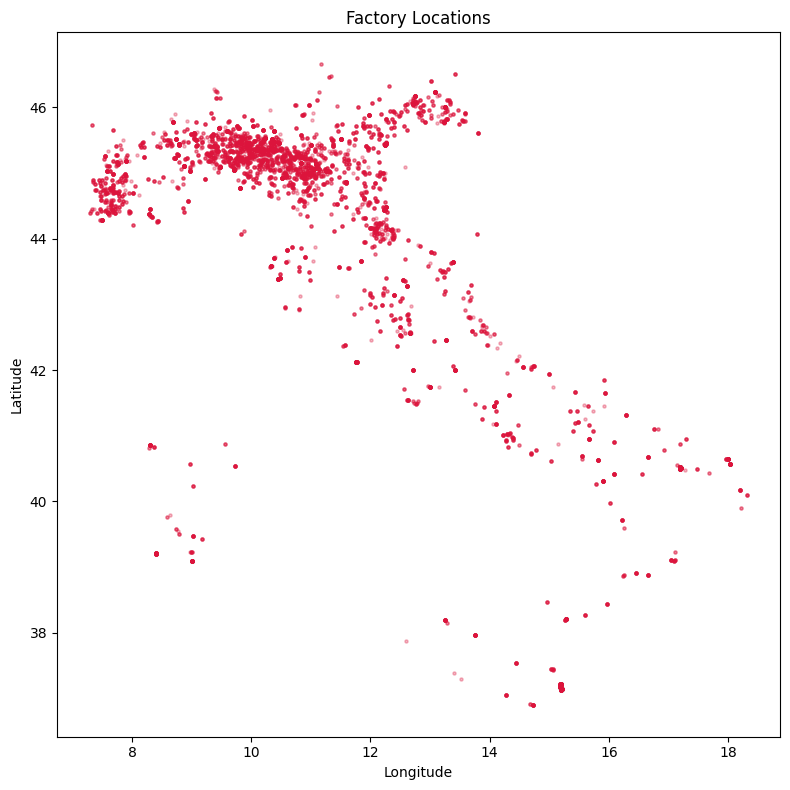


Geographic spread:
  Lat: 36.9031 to 46.6550
  Lon: 7.2911 to 18.3180


In [ ]:


# 7d. Geographic distribution
if "Latitude" in df_factories.columns and "Longitude" in df_factories.columns:
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(df_factories["Longitude"], df_factories["Latitude"], alpha=0.3, s=5, c="crimson")
    ax.set_title("Factory Locations")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.tight_layout()
    plt.show()

    print("\nGeographic spread:")
    print(f"  Lat: {df_factories['Latitude'].min():.4f} to {df_factories['Latitude'].max():.4f}")
    print(f"  Lon: {df_factories['Longitude'].min():.4f} to {df_factories['Longitude'].max():.4f}")

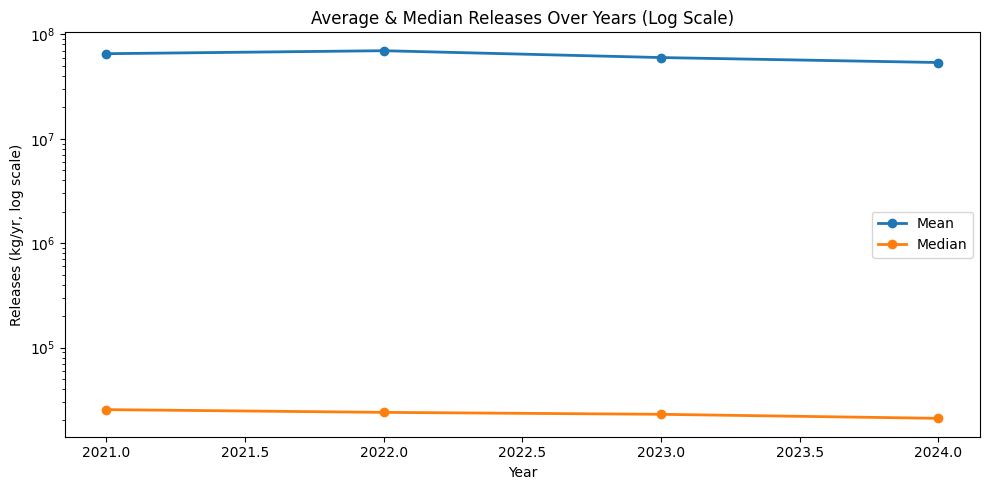

In [ ]:
if "Releases" in df_factories.columns:
    fig, ax = plt.subplots(figsize=(10, 5))
    yearly = df_factories.groupby("reportingYear")["Releases"].agg(["mean", "median", "sum"])
    yearly[["mean", "median"]].plot(ax=ax, marker="o", linewidth=2)
    ax.set_yscale("log")
    ax.set_title("Average & Median Releases Over Years (Log Scale)")
    ax.set_xlabel("Year")
    ax.set_ylabel("Releases (kg/yr, log scale)")
    ax.legend(["Mean", "Median"])
    plt.tight_layout()
    plt.show()

In [ ]:
print(df_factories["Releases"].quantile([0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))

0.25    1.225400e+04
0.50    2.360000e+04
0.75    2.158281e+05
0.90    1.032553e+08
0.95    3.335806e+08
0.99    1.365920e+09
Name: Releases, dtype: float64


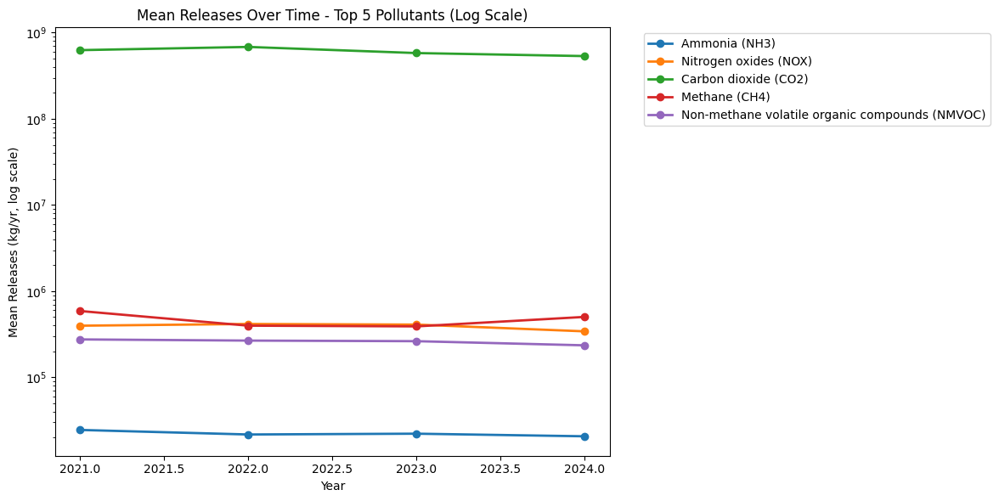

In [ ]:
if "Releases" in df_factories.columns:
    top5 = df_factories["Pollutant"].value_counts().head(5).index
    fig, ax = plt.subplots(figsize=(12, 6))
    for poll in top5:
        subset = df_factories[df_factories["Pollutant"] == poll].groupby("reportingYear")["Releases"].mean()
        subset.plot(ax=ax, marker="o", label=poll, linewidth=2)
    ax.set_yscale("log")
    ax.set_title("Mean Releases Over Time - Top 5 Pollutants (Log Scale)")
    ax.set_xlabel("Year")
    ax.set_ylabel("Mean Releases (kg/yr, log scale)")
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

In [ ]:
# ============================================================
# 8. DUPLICATE CHECK
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {df_factories.duplicated().sum()}")

# =======


8. DUPLICATES
Exact duplicate rows: 0



.


















.

#Cleaning Factories Data


In [ ]:
# Drop columns that are nearly 100% null — no usable data
# confidentialityReason: 100% null
# addressConfidentialityReason: 98.97% null
df_factories = df_factories.drop(columns=["confidentialityReason", "addressConfidentialityReason"])

print(f"Remaining columns: {df_factories.shape[1]}")
print(df_factories.columns.tolist())

Remaining columns: 14
['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorCode', 'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'FacilityInspireId', 'facilityName', 'city', 'Longitude', 'Latitude', 'TargetRelease', 'Pollutant', 'Releases']


In [ ]:
# Check if there are power/energy facilities near Rome in df_factories
# Look for energy-related activities
print(df_factories["EPRTRAnnexIMainActivity"].value_counts())

EPRTRAnnexIMainActivity
7(a)         2938
1(c)          867
3(c)          471
2(b)          338
1(a)          284
3(e)          225
5(d)          205
9(c)          185
7(a)(ii)      170
4(a)          157
4(e)          141
6(b)          121
5(b)          119
4(b)           91
2(e)           89
8(b)           83
7(a)(i)        81
5(a)           57
3(a)           36
2(a)           34
5(c)           26
2(d)           21
2(f)           19
4(c)           19
1(d)           13
3(g)           13
5(f)           12
7(a)(iii)      10
8(c)            9
9(a)            6
2(c)            5
5(g)            4
9(d)            4
9(b)            4
1(b)            3
7(b)            2
6(c)            1
Name: count, dtype: int64


In [ ]:
print(df_factories["EPRTR_SectorName"].value_counts())

EPRTR_SectorName
Intensive livestock production and aquaculture                     3201
Energy sector                                                      1167
Mineral industry                                                    745
Production and processing of metals                                 506
Waste and wastewater management                                     423
Chemical industry                                                   408
Other activities                                                    199
Paper and wood production and processing                            122
Animal and vegetable products from the food and beverage sector      92
Name: count, dtype: int64


In [ ]:
# Facilities within Lazio area (rough bounds)
lazio = df_factories[
    (df_factories["Latitude"].between(40.0, 44.0)) &
    (df_factories["Longitude"].between(10.0, 14.5))
]
print(f"Facilities in centra italy area: {len(lazio)}")
print(lazio[["facilityName", "EPRTR_SectorName", "Latitude", "Longitude"]].drop_duplicates())

Facilities in centra italy area: 848
                                             facilityName  \
41                            CENTRALE TORREVALDALIGA SUD   
74      ACCIAI SPECIALI TERNI S.P.A. - stabilimento di...   
626                        Società Agricola Fileni S.r.l.   
1075                              Laminazione Sottile SpA   
1418                                  ALESSANDRO STASSANO   
...                                                   ...   
332392                                      ILSERV s.r.l.   
338630  UMBRAGROUP S.P.A. (Umbra Cuscinetti S.p.A.) - ...   
344399                                      ECOACCIAI SPA   
356305                           Acea Ambiente Srl - ul 5   
357584  Saxa Gres s.p.a. (ex Area Industrie Ceramiche ...   

                                      EPRTR_SectorName   Latitude  Longitude  
41                                       Energy sector  42.123100  11.765400  
74                 Production and processing of metals  42.566700  12.66

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

energy_facilities = lazio[lazio["EPRTR_SectorName"] == "Energy sector"].copy()
energy_facilities["distance_km"] = energy_facilities.apply(
    lambda r: haversine(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)

print(energy_facilities[["facilityName", "city", "Latitude", "Longitude", "distance_km"]].drop_duplicates().sort_values("distance_km").to_string())

                                                                  facilityName                    city  Latitude  Longitude  distance_km
14419                                    CENTRALE A CICLO COMBINATO DI APRILIA                 APRILIA  41.54940   12.63080    40.848517
85997                                    Centrale Termoelettrica di Colleferro              COLLEFERRO  41.76250   12.97170    42.356604
24093                                     Centrale compressione gas di Gallese                 GALLESE  42.36210   12.44320    51.259896
41                                                 CENTRALE TORREVALDALIGA SUD           CIVITAVECCHIA  42.12310   11.76540    65.171744
2310                                              Centrale Torrevaldaliga Nord           CIVITAVECCHIA  42.12750   11.75860    65.874727
37379                            Centrale termoelettrica di Montalto di Castro      MONTALTO DI CASTRO  42.35890   11.53380    94.196925
2965           Enel Produzione S.p.A. - I

In [ ]:
df_factories.to_csv("factories_last.csv", index=False)

In [ ]:
df_factories.columns

Index(['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorCode',
       'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'FacilityInspireId',
       'facilityName', 'city', 'Longitude', 'Latitude', 'TargetRelease',
       'Pollutant', 'Releases'],
      dtype='object')

In [ ]:
df_factories.head()

,PublicationDate,countryName,reportingYear,EPRTR_SectorCode,EPRTR_SectorName,EPRTRAnnexIMainActivity,FacilityInspireId,facilityName,city,Longitude,Latitude,TargetRelease,Pollutant,Releases
3,2026/02/13,Italy,2021,7.0,Intensive livestock production and aquaculture,7(a),IT.CAED/370602036.FACILITY,RONCHETRIN 1,GAZZO VERONESE,11.106667,45.123611,AIR,Ammonia (NH3),31920.0
6,2026/02/13,Italy,2021,7.0,Intensive livestock production and aquaculture,7(a),IT.CAED/370672013.FACILITY,ALZO S.N.C. DI BENEDETTI PIETRO E C. - SOCIETA...,VALEGGIO SUL MINCIO,10.739400,45.331700,AIR,Ammonia (NH3),27910.6
41,2026/02/13,Italy,2021,1.0,Energy sector,1(c),IT.CAED/000531001.FACILITY,CENTRALE TORREVALDALIGA SUD,CIVITAVECCHIA,11.765400,42.123100,AIR,Carbon dioxide (CO2),530453000.0
74,2026/02/13,Italy,2022,2.0,Production and processing of metals,2(b),IT.CAED/051002002.FACILITY,ACCIAI SPECIALI TERNI S.P.A. - stabilimento di...,TERNI,12.666700,42.566700,AIR,Nitrogen oxides (NOX),510200.0
92,2026/02/13,Italy,2022,5.0,Waste and wastewater management,5(d),IT.CAED/410592001.FACILITY,HERAMBIENTE S.R.L. - DISCARICA RIFIUTI NON PER...,ZOCCA,10.938600,44.340800,AIR,Methane (CH4),133874.2


In [ ]:
# Drop columns not needed for analysis
# TargetRelease — not relevant
# city — all Rome/Lazio area, no variation needed
# facilityName — individual names not needed for aggregate analysis
# FacilityInspireId — identifier, not needed
# EPRTR_SectorCode — numeric code, redundant with EPRTR_SectorName
df_factories = df_factories.drop(columns=[
    "TargetRelease",
    "city",
    "facilityName",
    "FacilityInspireId",
    "EPRTR_SectorCode"
])

print(f"Remaining columns: {df_factories.columns.tolist()}")

Remaining columns: ['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'Longitude', 'Latitude', 'Pollutant', 'Releases']


In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Rome center coordinates
rome_lat, rome_lon = 41.9028, 12.4964

# Calculate distance from Rome center for each facility
df_factories["distance_from_rome_km"] = df_factories.apply(
    lambda r: haversine(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)

print(f"Distance range: {df_factories['distance_from_rome_km'].min():.1f} - {df_factories['distance_from_rome_km'].max():.1f} km")
print(f"\nDistance distribution:")
print(df_factories["distance_from_rome_km"].describe())

Distance range: 21.2 - 594.5 km

Distance distribution:
count    6796.000000
mean      389.103097
std       116.364141
min        21.188597
25%       352.172693
50%       422.336864
75%       461.965379
max       594.546462
Name: distance_from_rome_km, dtype: float64


In [ ]:
df_factories.head()

,PublicationDate,countryName,reportingYear,EPRTR_SectorName,EPRTRAnnexIMainActivity,Longitude,Latitude,Pollutant,Releases,distance_from_rome_km
3,2026/02/13,Italy,2021,Intensive livestock production and aquaculture,7(a),11.106667,45.123611,Ammonia (NH3),31920.0,375.245942
6,2026/02/13,Italy,2021,Intensive livestock production and aquaculture,7(a),10.739400,45.331700,Ammonia (NH3),27910.6,406.637478
41,2026/02/13,Italy,2021,Energy sector,1(c),11.765400,42.123100,Carbon dioxide (CO2),530453000.0,65.171744
74,2026/02/13,Italy,2022,Production and processing of metals,2(b),12.666700,42.566700,Nitrogen oxides (NOX),510200.0,75.141874
92,2026/02/13,Italy,2022,Waste and wastewater management,5(d),10.938600,44.340800,Methane (CH4),133874.2,299.111506


In [ ]:
df_factories = df_factories.drop(columns = "PublicationDate")

In [ ]:
df_factories = df_factories.drop(columns = "countryName")

In [ ]:
# Create dummy variables for EPRTR_SectorName
# drop_first=True to avoid multicollinearity
dummies = pd.get_dummies(df_factories["EPRTR_SectorName"], prefix="Sector", drop_first=True)

# Add dummies and drop original column
df_factories = pd.concat([df_factories, dummies], axis=1)
df_factories = df_factories.drop(columns=["EPRTR_SectorName"])

print(f"Shape: {df_factories.shape}")
print(f"Columns: {df_factories.columns.tolist()}")

Shape: (6867, 15)
Columns: ['reportingYear', 'EPRTRAnnexIMainActivity', 'Longitude', 'Latitude', 'Pollutant', 'Releases', 'distance_from_rome_km', 'Sector_Chemical industry', 'Sector_Energy sector', 'Sector_Intensive livestock production and aquaculture', 'Sector_Mineral industry', 'Sector_Other activities', 'Sector_Paper and wood production and processing', 'Sector_Production and processing of metals', 'Sector_Waste and wastewater management']


In [ ]:
# Convert dummy columns from True/False to 0/1
dummy_cols = [c for c in df_factories.columns if c.startswith("Sector_")]
df_factories[dummy_cols] = df_factories[dummy_cols].astype(int)

print(df_factories[dummy_cols].head())

    Sector_Chemical industry  Sector_Energy sector  \
3                          0                     0   
6                          0                     0   
41                         0                     1   
74                         0                     0   
92                         0                     0   

    Sector_Intensive livestock production and aquaculture  \
3                                                   1       
6                                                   1       
41                                                  0       
74                                                  0       
92                                                  0       

    Sector_Mineral industry  Sector_Other activities  \
3                         0                        0   
6                         0                        0   
41                        0                        0   
74                        0                        0   
92                        0 

In [ ]:
df_factories.head()

,reportingYear,EPRTRAnnexIMainActivity,Longitude,Latitude,Pollutant,Releases,distance_from_rome_km,Sector_Chemical industry,Sector_Energy sector,Sector_Intensive livestock production and aquaculture,Sector_Mineral industry,Sector_Other activities,Sector_Paper and wood production and processing,Sector_Production and processing of metals,Sector_Waste and wastewater management
3,2021,7(a),11.106667,45.123611,Ammonia (NH3),31920.0,375.245942,0,0,1,0,0,0,0,0
6,2021,7(a),10.739400,45.331700,Ammonia (NH3),27910.6,406.637478,0,0,1,0,0,0,0,0
41,2021,1(c),11.765400,42.123100,Carbon dioxide (CO2),530453000.0,65.171744,0,1,0,0,0,0,0,0
74,2022,2(b),12.666700,42.566700,Nitrogen oxides (NOX),510200.0,75.141874,0,0,0,0,0,0,1,0
92,2022,5(d),10.938600,44.340800,Methane (CH4),133874.2,299.111506,0,0,0,0,0,0,0,1


In [ ]:
df_factories.to_csv("factories_last_1.csv", index=False)

#Air Quality Data Inspection


In [ ]:
import pandas as pd

files = ["DataExtract 4.csv","DataExtract 5.csv","DataExtract 6.csv","DataExtract 7.csv"]

df_stats = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

In [ ]:

# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {df_stats.shape[0]:,} rows x {df_stats.shape[1]} columns")
print(f"\nData types:")
print(df_stats.dtypes)


1. BASIC STRUCTURE
Shape: 2,706 rows x 27 columns

Data types:
Country                                                            object
Air Quality Network                                                object
Air Quality Network Name                                           object
Air Quality Station EoI Code                                       object
Air Quality Station Name                                           object
Sampling Point Id                                                  object
Air Pollutant                                                      object
Air Pollutant Description                                          object
Data Aggregation Process Id                                        object
Data Aggregation Process                                           object
Year                                                                int64
Air Pollution Level                                               float64
Unit Of Air Pollution Level                      

In [ ]:
df_stats

,Country,Air Quality Network,Air Quality Network Name,Air Quality Station EoI Code,Air Quality Station Name,Sampling Point Id,Air Pollutant,Air Pollutant Description,Data Aggregation Process Id,Data Aggregation Process,...,Longitude,Latitude,Altitude,City,City Code,City Population,Source Of Data Flow,Calculation Time,Link to raw data (only E1a/validated data from AQ e-Reporting),Observation Frequency
0,Italy,NET.IT112A,Regione Lazio,IT1835A,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,...,12.5337,41.9477,36.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 22:59:18,https://eeadmz1batchservice02.blob.core.window...,hour
1,Italy,NET.IT112A,Regione Lazio,IT1835A,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P3Y,3 subsequent calendar years mean,...,12.5337,41.9477,36.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 23:01:54,https://eeadmz1batchservice02.blob.core.window...,hour
2,Italy,NET.IT112A,Regione Lazio,IT1835A,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y,Annual mean / 1 calendar year,...,12.5337,41.9477,36.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 22:58:16,https://eeadmz1batchservice02.blob.core.window...,hour
3,Italy,NET.IT112A,Regione Lazio,IT1835A,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,...,12.5337,41.9477,36.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 22:59:18,https://eeadmz1batchservice02.blob.core.window...,hour
4,Italy,NET.IT112A,Regione Lazio,IT1835A,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-hr-per50,1 year 50 percentile,...,12.5337,41.9477,36.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 23:00:56,https://eeadmz1batchservice02.blob.core.window...,hour
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2701,Italy,NET.IT112A,Regione Lazio,IT1906A,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-day-min,1 year day min,...,12.4754,41.8940,17.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 22:59:10,https://eeadmz1batchservice02.blob.core.window...,hour
2702,Italy,NET.IT112A,Regione Lazio,IT1906A,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-dmax-per93.15,1 year 93.15 percentile daily 8h maximum,...,12.4754,41.8940,17.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 22:59:57,https://eeadmz1batchservice02.blob.core.window...,hour
2703,Italy,NET.IT112A,Regione Lazio,IT1906A,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-P1D-per99,1 year 99 percentile of daily means (P1D) or ....,...,12.4754,41.8940,17.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 23:01:47,https://eeadmz1batchservice02.blob.core.window...,hour
2704,Italy,NET.IT112A,Regione Lazio,IT1906A,ARENULA,SPO.IT1906A_8_chemi_2008-02-03_00:00:00,NO2,Nitrogen dioxide (air),P1Y-hr-max,1 year hour max,...,12.4754,41.8940,17.0,Roma ...,IT001C1 ...,2808293,E1a/validated data AQ e-Reporting,07/03/2026 23:00:20,https://eeadmz1batchservice02.blob.core.window...,hour


In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(df_stats.describe())

print("\n" + "=" * 60)
print("2b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
df_stats.describe(include="object")


2. SUMMARY STATISTICS (Numeric)
              Year  Air Pollution Level  Data Coverage  Verification  \
count  2706.000000          2706.000000    2706.000000        2706.0   
mean   2022.484479           821.140721      94.674523           1.0   
std       1.118133          3809.418096       3.518019           0.0   
min    2021.000000            -1.992000      83.840000           1.0   
25%    2021.000000             0.672250      92.900000           1.0   
50%    2022.000000            25.560000      94.810000           1.0   
75%    2023.000000            85.398000      97.605000           1.0   
max    2024.000000         36627.117000     100.000000           1.0   

         Longitude     Latitude     Altitude  City Population  
count  2706.000000  2706.000000  2706.000000           2706.0  
mean     12.504233    41.906535    33.359941        2808293.0  
std       0.036858     0.031844    12.110450              0.0  
min      12.447600    41.857700    17.000000        2808293.0 

,Country,Air Quality Network,Air Quality Network Name,Air Quality Station EoI Code,Air Quality Station Name,Sampling Point Id,Air Pollutant,Air Pollutant Description,Data Aggregation Process Id,Data Aggregation Process,Unit Of Air Pollution Level,Air Quality Station Type,Air Quality Station Area,City,City Code,Source Of Data Flow,Calculation Time,Link to raw data (only E1a/validated data from AQ e-Reporting),Observation Frequency
count,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706
unique,1,1,1,10,10,55,11,11,51,50,3,2,1,1,1,1,51,55,1
top,Italy,NET.IT112A,Regione Lazio,IT0953A,VILLA ADA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,NO2,Nitrogen dioxide (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,ug/m3,Background,Urban,Roma ...,IT001C1 ...,E1a/validated data AQ e-Reporting,07/03/2026 22:59:18,https://eeadmz1batchservice02.blob.core.window...,hour
freq,2706,2706,2706,528,528,116,760,760,218,218,2206,1830,2706,2706,2706,2706,218,116,2706


In [ ]:
# ============================================================
# 3. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = df_stats.isna().sum()
null_pct = (df_stats.isna().sum() / len(df_stats) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())





3. MISSING DATA
                                                                count  percent
Country                                                             0      0.0
Air Quality Network                                                 0      0.0
Air Quality Network Name                                            0      0.0
Air Quality Station EoI Code                                        0      0.0
Air Quality Station Name                                            0      0.0
Sampling Point Id                                                   0      0.0
Air Pollutant                                                       0      0.0
Air Pollutant Description                                           0      0.0
Data Aggregation Process Id                                         0      0.0
Data Aggregation Process                                            0      0.0
Year                                                                0      0.0
Air Pollution Level                

In [ ]:
# 5. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("5. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nPollutants:")
print(df_stats["Air Pollutant"].value_counts())

print("\nYear distribution:")
print(df_stats["Year"].value_counts().sort_index())

print("\nStation Names:")
print(df_stats["Air Quality Station Name"].value_counts())




5. KEY DISTRIBUTIONS

Pollutants:
Air Pollutant
NO2               760
O3                696
NOX as NO2        320
NO                280
SO2               126
CO                104
C6H5-CH3           84
C6H5-C2H5          84
C6H6               84
m,p-C6H4(CH3)2     84
o-C6H4-(CH3)2      84
Name: count, dtype: int64

Year distribution:
Year
2021    687
2022    687
2023    666
2024    666
Name: count, dtype: int64

Station Names:
Air Quality Station Name
VILLA ADA            528
FERMI                328
BUFALOTTA            294
C.SO FRANCIA         276
CIPRO                252
CINECITTA            252
L.GO PERESTRELLO     252
ARENULA              252
L.GO MAGNA GRECIA    136
TIBURTINA            136
Name: count, dtype: int64


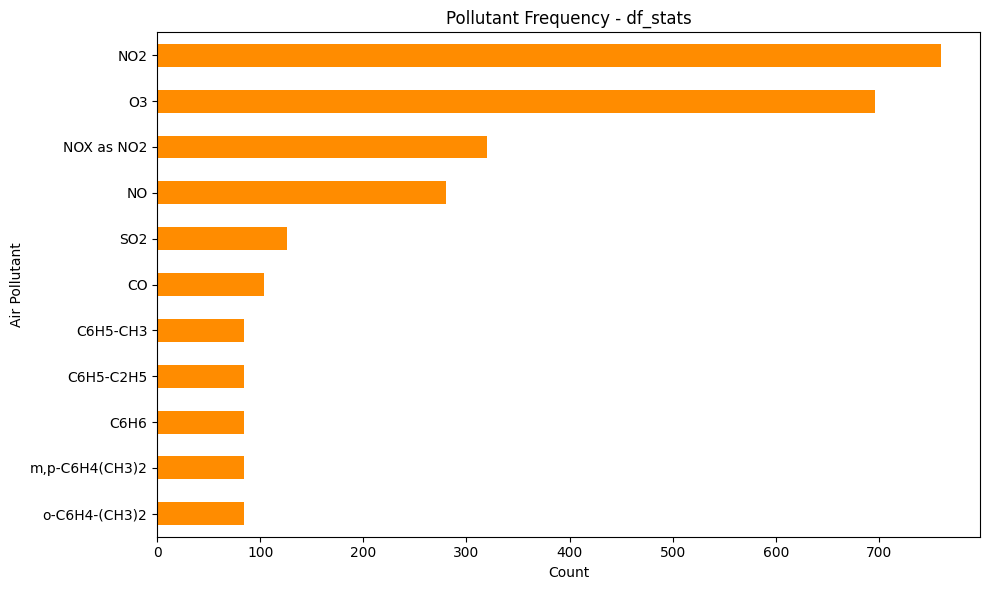

In [ ]:

# 6b. Pollutant frequency
fig, ax = plt.subplots(figsize=(10, 6))
df_stats["Air Pollutant"].value_counts().plot(kind="barh", ax=ax, color="darkorange")
ax.set_title("Pollutant Frequency - df_stats")
ax.set_xlabel("Count")
ax.invert_yaxis()
plt.tight_layout()
plt.show()

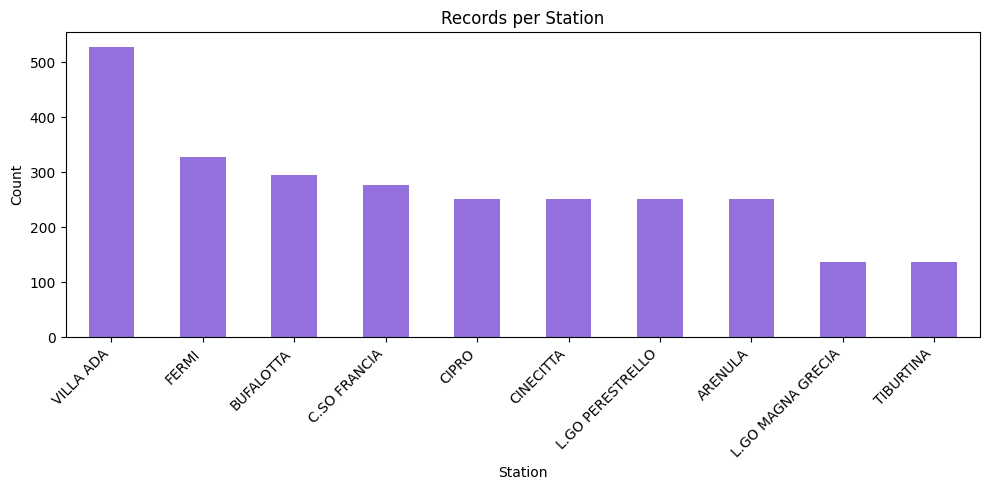

In [ ]:
# 6d. Records per station
fig, ax = plt.subplots(figsize=(10, 5))
df_stats["Air Quality Station Name"].value_counts().plot(kind="bar", ax=ax, color="mediumpurple")
ax.set_title("Records per Station")
ax.set_xlabel("Station")
ax.set_ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

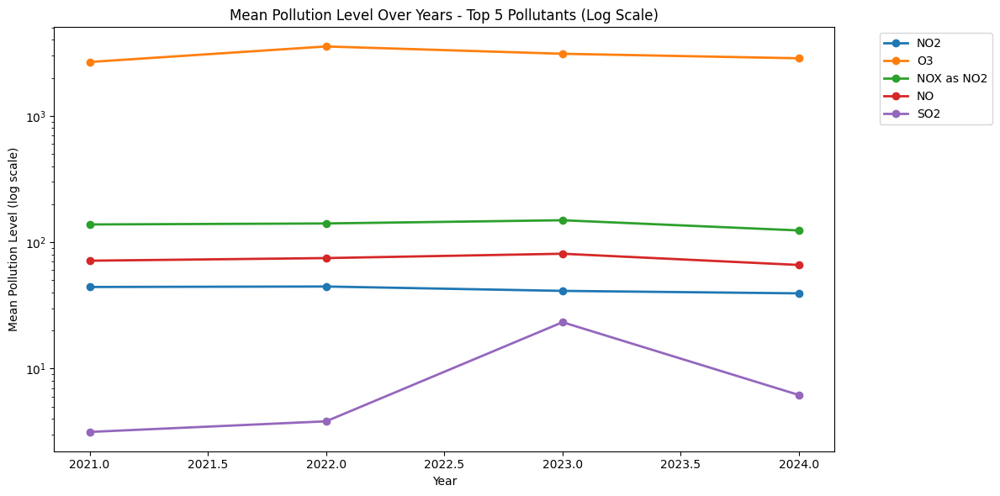

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
for poll in df_stats["Air Pollutant"].value_counts().head(5).index:
    sub = df_stats[df_stats["Air Pollutant"] == poll].groupby("Year")["Air Pollution Level"].mean()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)
ax.set_yscale("log")
ax.set_title("Mean Pollution Level Over Years - Top 5 Pollutants (Log Scale)")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Pollution Level (log scale)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [ ]:
!pip install contextily

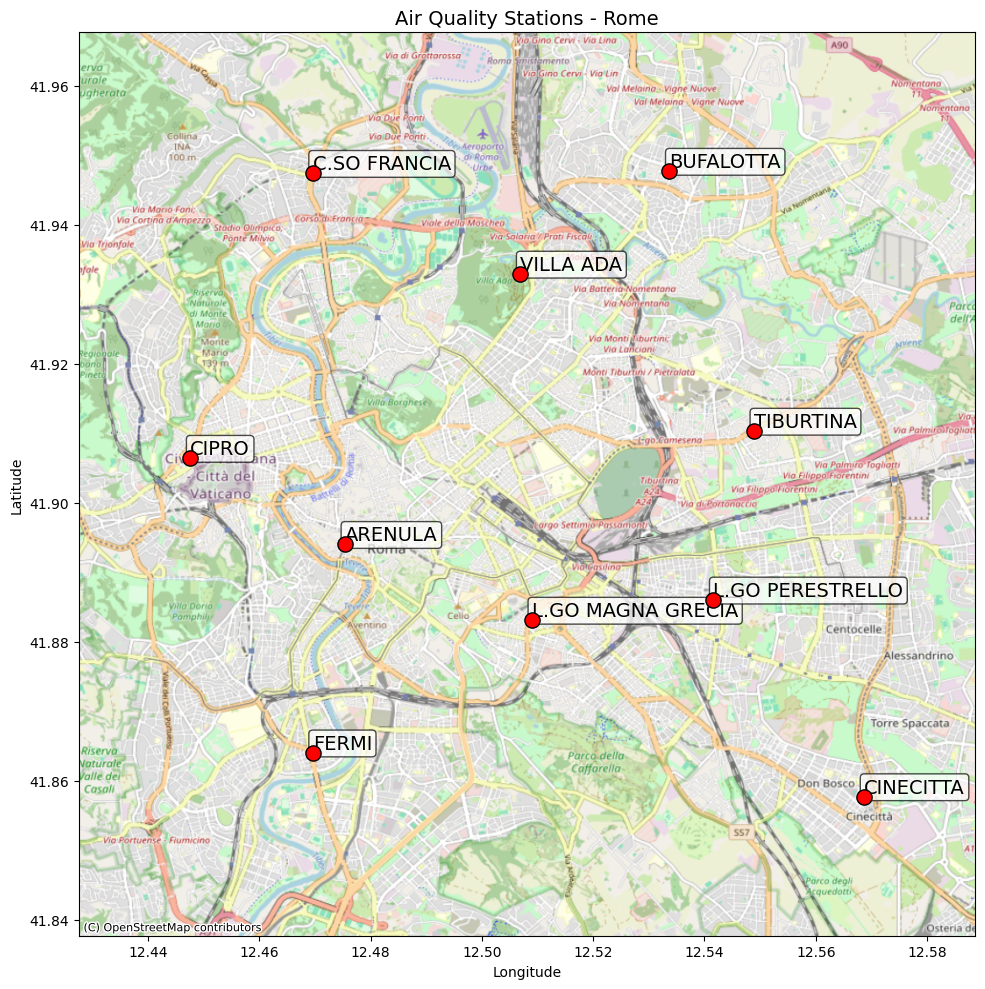

In [ ]:
# Install in Colab first


import contextily as ctx
import matplotlib.pyplot as plt

stations = df_stats[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()

fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(stations["Longitude"], stations["Latitude"], s=120, c="red", zorder=5, edgecolors="black")

for _, row in stations.iterrows():
    ax.annotate(row["Air Quality Station Name"],
                (row["Longitude"], row["Latitude"]),
                fontsize=14, ha="left", va="bottom",
                bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7))

# Add some padding around the points
pad = 0.02
ax.set_xlim(stations["Longitude"].min() - pad, stations["Longitude"].max() + pad)
ax.set_ylim(stations["Latitude"].min() - pad, stations["Latitude"].max() + pad)

# Add the real map as background
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Air Quality Stations - Rome", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 7. ZERO VALUES
# ============================================================
print("\n" + "=" * 60)
print("7. ZERO VALUES")
print("=" * 60)
numeric_cols = df_stats.select_dtypes(include="number").columns
for col in numeric_cols:
    zero_count = (df_stats[col] == 0).sum()
    if zero_count > 0:
        print(f"  {col}: {zero_count} zeros ({zero_count/len(df_stats)*100:.2f}%)")



7. ZERO VALUES
  Air Pollution Level: 424 zeros (15.67%)


In [ ]:
# ============================================================
# 8. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {df_stats.duplicated().sum()}")




8. DUPLICATES
Exact duplicate rows: 0


In [ ]:

# ============================================================
# 9. DATA QUALITY SUMMARY
# ============================================================
print("\n" + "=" * 60)
print("9. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(df_stats):,}")
print(f"  Columns: {df_stats.shape[1]}")
print(f"  Columns with nulls: {(df_stats.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {df_stats.duplicated().sum()}")
print(f"  Unique stations: {df_stats['Air Quality Station Name'].nunique()}")
print(f"  Unique sampling points: {df_stats['Sampling Point Id'].nunique()}")
print(f"  Unique pollutants: {df_stats['Air Pollutant'].nunique()}")
print(f"  Year range: {df_stats['Year'].min()} - {df_stats['Year'].max()}")
print(f"  Pollution Level range: {df_stats['Air Pollution Level'].min()} - {df_stats['Air Pollution Level'].max()}")


9. DATA QUALITY SUMMARY
  Total rows: 2,706
  Columns: 27
  Columns with nulls: 0
  Exact duplicates: 0
  Unique stations: 10
  Unique sampling points: 55
  Unique pollutants: 11
  Year range: 2021 - 2024
  Pollution Level range: -1.992 - 36627.117


#air quality stats data cleaning

In [ ]:
# Drop 'Country' column — all values are Italy, no information gained
df_stats = df_stats.drop(columns=["Country"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 26


In [ ]:
# Drop 'Air Quality Network Name' — all values are "Regione Lazio", no variation
df_stats = df_stats.drop(columns=["Air Quality Network Name"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 25


In [ ]:
# Drop 'Air Quality Network' — same network for all stations (NET.IT112A), no variation
df_stats = df_stats.drop(columns=["Air Quality Network"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 24


In [ ]:
# Drop 'Observation Frequency' — same value for all rows (hourly)
# Drop 'Source Of Data Flow' — same source for all rows
# Drop 'City Code' — redundant identifier, city name is sufficient
# Drop 'City Population' — constant value across all rows, no variation
# Drop 'Air Quality Station Area' — all stations are Urban, no variation
df_stats = df_stats.drop(columns=[
    "Observation Frequency",
    "Source Of Data Flow",
    "City Code",
    "City Population",
    "Air Quality Station Area",
])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 19
['Air Quality Station EoI Code', 'Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Data Coverage', 'Verification', 'Air Quality Station Type', 'Longitude', 'Latitude', 'Altitude', 'City', 'Calculation Time', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
df_stats = df_stats.drop(columns = "City")

In [ ]:
# Drop 'Air Quality Station EoI Code' — redundant, same information as Station Name
df_stats = df_stats.drop(columns=["Air Quality Station EoI Code","Air Quality Station Type"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 16
['Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Data Coverage', 'Verification', 'Longitude', 'Latitude', 'Altitude', 'Calculation Time', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
# Drop 'Data Coverage' — not needed for analysis
# Drop 'Verification' — same verification status across rows, no variation
df_stats = df_stats.drop(columns=["Data Coverage", "Verification","Calculation Time"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 13
['Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Longitude', 'Latitude', 'Altitude', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
df_stats

,Air Quality Station Name,Sampling Point Id,Air Pollutant,Air Pollutant Description,Data Aggregation Process Id,Data Aggregation Process,Year,Air Pollution Level,Unit Of Air Pollution Level,Longitude,Latitude,Altitude,Link to raw data (only E1a/validated data from AQ e-Reporting)
0,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,2021,42.741,ug/m3,12.5337,41.9477,36.0,https://eeadmz1batchservice02.blob.core.window...
1,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P3Y,3 subsequent calendar years mean,2021,43.681,ug/m3,12.5337,41.9477,36.0,https://eeadmz1batchservice02.blob.core.window...
2,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y,Annual mean / 1 calendar year,2021,32.305,ug/m3,12.5337,41.9477,36.0,https://eeadmz1batchservice02.blob.core.window...
3,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,2021,31.218,ug/m3,12.5337,41.9477,36.0,https://eeadmz1batchservice02.blob.core.window...
4,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-hr-per50,1 year 50 percentile,2021,28.348,ug/m3,12.5337,41.9477,36.0,https://eeadmz1batchservice02.blob.core.window...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2701,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-day-min,1 year day min,2024,2.928,ug/m3,12.4754,41.8940,17.0,https://eeadmz1batchservice02.blob.core.window...
2702,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-dmax-per93.15,1 year 93.15 percentile daily 8h maximum,2024,75.405,ug/m3,12.4754,41.8940,17.0,https://eeadmz1batchservice02.blob.core.window...
2703,ARENULA,SPO.IT1906A_7_UV-P_2009-11-29_00:00:00,O3,Ozone (air),P1Y-P1D-per99,1 year 99 percentile of daily means (P1D) or ....,2024,63.534,ug/m3,12.4754,41.8940,17.0,https://eeadmz1batchservice02.blob.core.window...
2704,ARENULA,SPO.IT1906A_8_chemi_2008-02-03_00:00:00,NO2,Nitrogen dioxide (air),P1Y-hr-max,1 year hour max,2024,116.235,ug/m3,12.4754,41.8940,17.0,https://eeadmz1batchservice02.blob.core.window...


#from parquet

In [ ]:
links = df_stats[
    "Link to raw data (only E1a/validated data from AQ e-Reporting)"
].tolist()

In [ ]:
df_stats = df_stats.rename(columns={"Air Pollutant": "Pollutant"})

In [ ]:
"""
SCRIPT 1: Download all parquet files
=====================================
Run this first. Downloads all parquets from df_stats links to Colab local disk.
"""

import pandas as pd
import requests
import os
import time
from concurrent.futures import ThreadPoolExecutor, as_completed

# --- CONFIGURATION ---
DF_STATS_PATH = "/content/df_stats.csv"  # adjust if needed
DOWNLOAD_FOLDER = "/content/parquets"
LINK_COL = "Link to raw data (only E1a/validated data from AQ e-Reporting)"

os.makedirs(DOWNLOAD_FOLDER, exist_ok=True)

# Load df_stats just to get the links
df_stats
links = df_stats[LINK_COL].dropna().unique()
parquet_links = [l for l in links if l.endswith(".parquet")]
print(f"Found {len(parquet_links)} unique parquet links\n")

# Download function
def download_one(url):
    filename = url.split("/")[-1]
    filepath = os.path.join(DOWNLOAD_FOLDER, filename)
    if os.path.exists(filepath):
        return filepath, "exists"
    try:
        r = requests.get(url, timeout=120)
        r.raise_for_status()
        with open(filepath, "wb") as f:
            f.write(r.content)
        return filepath, "ok"
    except Exception as e:
        return None, str(e)

# Download all in parallel
start = time.time()
ok = 0
fail = 0
total = len(parquet_links)

with ThreadPoolExecutor(max_workers=20) as executor:
    futures = {executor.submit(download_one, url): url for url in parquet_links}
    for i, future in enumerate(as_completed(futures), 1):
        filepath, status = future.result()
        if filepath:
            ok += 1
        else:
            fail += 1
            print(f"  FAILED: {futures[future].split('/')[-1]} - {status}")
        if i % 10 == 0 or i == total:
            print(f"  [{i}/{total}] Downloaded: {ok} | Failed: {fail}")

elapsed = time.time() - start
total_mb = sum(
    os.path.getsize(os.path.join(DOWNLOAD_FOLDER, f))
    for f in os.listdir(DOWNLOAD_FOLDER) if f.endswith(".parquet")
) / (1024 * 1024)

print(f"\nDone in {elapsed:.1f}s")
print(f"Files in {DOWNLOAD_FOLDER}: {ok}")
print(f"Total size: {total_mb:.1f} MB")

Found 55 unique parquet links

  [10/55] Downloaded: 10 | Failed: 0
  [20/55] Downloaded: 20 | Failed: 0
  [30/55] Downloaded: 30 | Failed: 0
  [40/55] Downloaded: 40 | Failed: 0
  [50/55] Downloaded: 50 | Failed: 0
  [55/55] Downloaded: 55 | Failed: 0

Done in 6.4s
Files in /content/parquets: 55
Total size: 67.2 MB


In [ ]:
"""
SCRIPT 2: Combine all parquets into one file
=============================================
Reads all parquet files from /content/parquets/,
combines them into one dataframe, saves as CSV.
"""

import pandas as pd
import os
import gc
import glob
import time

# --- CONFIGURATION ---
PARQUET_FOLDER = "/content/parquets"
OUTPUT_PATH = "/content/all_parquets_combined.csv"

# Get all parquet files
parquet_files = sorted(glob.glob(os.path.join(PARQUET_FOLDER, "*.parquet")))
print(f"Found {len(parquet_files)} parquet files\n")

# Read all
start = time.time()
all_dfs = []

for i, filepath in enumerate(parquet_files, 1):
    df = pd.read_parquet(filepath)
    all_dfs.append(df)

    if i == 1:
        print(f"Columns: {list(df.columns)}")
        print(f"First file rows: {len(df):,}\n")

    if i % 10 == 0 or i == len(parquet_files):
        print(f"  [{i}/{len(parquet_files)}] read")

# Combine
print("\nCombining...")
df_combined = pd.concat(all_dfs, ignore_index=True)
del all_dfs
gc.collect()

print(f"Total rows: {df_combined.shape[0]:,}")
print(f"Columns: {df_combined.shape[1]}")
print(f"Memory: {df_combined.memory_usage(deep=True).sum() / (1024*1024):.0f} MB")

# Save
print(f"\nSaving to {OUTPUT_PATH}...")
df_combined.to_csv(OUTPUT_PATH, index=False)
size_mb = os.path.getsize(OUTPUT_PATH) / (1024 * 1024)

elapsed = time.time() - start
print(f"Saved: {size_mb:.1f} MB | Done in {elapsed:.1f}s")

Found 55 parquet files

Columns: ['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'AggType', 'Validity', 'Verification', 'ResultTime', 'DataCapture', 'FkObservationLog']
First file rows: 87,672

  [10/55] read
  [20/55] read
  [30/55] read
  [40/55] read
  [50/55] read
  [55/55] read

Combining...
Total rows: 4,659,792
Columns: 12
Memory: 2029 MB

Saving to /content/all_parquets_combined.csv...
Saved: 805.9 MB | Done in 94.0s


In [ ]:
"""
SCRIPT 3: Extract Year from Start column
=========================================
Reads the combined parquets CSV, adds a Year column
from the Start column, saves back.
"""

import pandas as pd
import time

# --- CONFIGURATION ---
INPUT_PATH = "/content/all_parquets_combined.csv"
OUTPUT_PATH = "/content/all_parquets_combined_year.csv"  # overwrite same file

print("Loading combined parquets...")
start = time.time()

df = pd.read_csv(INPUT_PATH)
print(f"Rows: {df.shape[0]:,}")

# Convert Start to datetime and extract Year
df["Start"] = pd.to_datetime(df["Start"])
df["Year"] = df["Start"].dt.year.astype(int)

print(f"Year range: {df['Year'].min()} - {df['Year'].max()}")
print(f"Sample:\n{df[['Start', 'Year']].head()}\n")

# Save
print("Saving...")
df.to_csv(OUTPUT_PATH, index=False)

elapsed = time.time() - start
print(f"Done in {elapsed:.1f}s")

Loading combined parquets...
Rows: 4,659,792
Year range: 2013 - 2024
Sample:
                Start  Year
0 2015-01-01 00:00:00  2015
1 2015-01-01 01:00:00  2015
2 2015-01-01 02:00:00  2015
3 2015-01-01 03:00:00  2015
4 2015-01-01 04:00:00  2015

Saving...
Done in 85.8s


In [ ]:
prefinal_df = pd.read_csv("all_parquets_combined_year.csv")

In [ ]:
# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {prefinal_df.shape[0]:,} rows x {prefinal_df.shape[1]} columns")
print(f"\nColumns: {prefinal_df.columns.tolist()}")
print(f"\nData types:")
print(prefinal_df.dtypes)
print(f"\nFirst 5 rows:")
prefinal_df.head()

1. BASIC STRUCTURE
Shape: 4,659,792 rows x 13 columns

Columns: ['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'AggType', 'Validity', 'Verification', 'ResultTime', 'DataCapture', 'FkObservationLog', 'Year']

Data types:
Samplingpoint        object
Pollutant             int64
Start                object
End                  object
Value               float64
Unit                 object
AggType              object
Validity              int64
Verification          int64
ResultTime           object
DataCapture         float64
FkObservationLog     object
Year                  int64
dtype: object

First 5 rows:


,Samplingpoint,Pollutant,Start,End,Value,Unit,AggType,Validity,Verification,ResultTime,DataCapture,FkObservationLog,Year
0,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 00:00:00,2015-01-01 01:00:00,0.4,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
1,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 01:00:00,2015-01-01 02:00:00,-999.0,ug.m-3,hour,-1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
2,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 02:00:00,2015-01-01 03:00:00,1.4,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
3,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 03:00:00,2015-01-01 04:00:00,1.6,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
4,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 04:00:00,2015-01-01 05:00:00,1.3,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015


In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
pd.set_option('display.float_format', lambda x: '%.2f' % x)

print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(prefinal_df.describe())

print("\n" + "=" * 60)
print("2b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
print(prefinal_df.describe(include="object"))


2. SUMMARY STATISTICS (Numeric)
       Pollutant      Value   Validity  Verification  DataCapture       Year
count 4659792.00 4659792.00 4659792.00    4659792.00         0.00 4659792.00
mean       75.02    -444.03       0.96          1.00          NaN    2019.14
std       152.58    2100.45       0.56          0.00          NaN       3.47
min         1.00   -9999.00      -1.00          1.00          NaN    2013.00
25%         8.00       0.91       1.00          1.00          NaN    2017.00
50%         9.00      11.00       1.00          1.00          NaN    2020.00
75%        38.00      43.05       1.00          1.00          NaN    2022.00
max       482.00    1701.00       2.00          1.00          NaN    2024.00

2b. SUMMARY STATISTICS (Categorical)
                                     Samplingpoint                Start  \
count                                      4659792              4659792   
unique                                          55               105192   
top     IT/

In [ ]:
prefinal_df = prefinal_df[prefinal_df["Year"].between(2021, 2024)].copy()


In [ ]:
prefinal_df.shape

(1910976, 13)

In [ ]:

# ============================================================
# 3. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = prefinal_df.isna().sum()
null_pct = (prefinal_df.isna().sum() / len(prefinal_df) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())





3. MISSING DATA
                    count  percent
DataCapture       1910976   100.00
Pollutant               0     0.00
Start                   0     0.00
End                     0     0.00
Samplingpoint           0     0.00
Value                   0     0.00
Unit                    0     0.00
Validity                0     0.00
AggType                 0     0.00
Verification            0     0.00
ResultTime              0     0.00
FkObservationLog        0     0.00
Year                    0     0.00


In [ ]:

# ============================================================
# 4. UNIQUE VALUES
# ============================================================
print("\n" + "=" * 60)
print("4. UNIQUE VALUES PER COLUMN")
print("=" * 60)
for col in prefinal_df.columns:
    print(f"  {col}: {prefinal_df[col].nunique()} unique")


4. UNIQUE VALUES PER COLUMN
  Samplingpoint: 55 unique
  Pollutant: 11 unique
  Start: 35064 unique
  End: 35064 unique
  Value: 983463 unique
  Unit: 2 unique
  AggType: 1 unique
  Validity: 3 unique
  Verification: 1 unique
  ResultTime: 4 unique
  DataCapture: 0 unique
  FkObservationLog: 273 unique
  Year: 4 unique


In [ ]:
# ============================================================
# 5. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("5. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nPollutants:")
print(prefinal_df["Pollutant"].value_counts())

print("\nUnit:")
print(prefinal_df["Unit"].value_counts())



5. KEY DISTRIBUTIONS

Pollutants:
Pollutant
38     350640
9      350640
8      350640
7      210384
20     105192
21     105192
431    105192
482    105192
464    105192
10      70128
1       52584
Name: count, dtype: int64

Unit:
Unit
ug.m-3    1840848
mg.m-3      70128
Name: count, dtype: int64


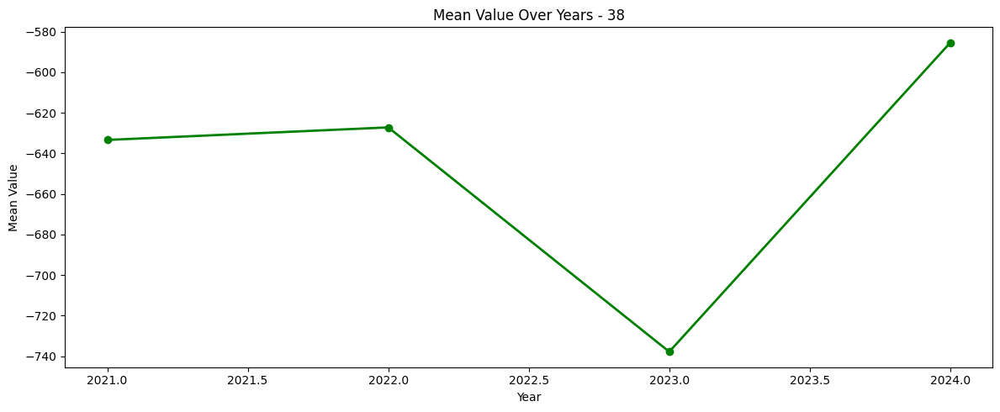

In [ ]:
# 7d. Mean value over time - dominant pollutant alone
top_poll = prefinal_df["Pollutant"].value_counts().head(5).index
dominant = top_poll[0]

fig, ax = plt.subplots(figsize=(12, 5))
sub = prefinal_df[prefinal_df["Pollutant"] == dominant].groupby("Year")["Value"].mean()
ax.plot(sub.index, sub.values, marker="o", linewidth=2, color="green")
ax.set_title(f"Mean Value Over Years - {dominant}")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Value")
plt.tight_layout()
plt.show()

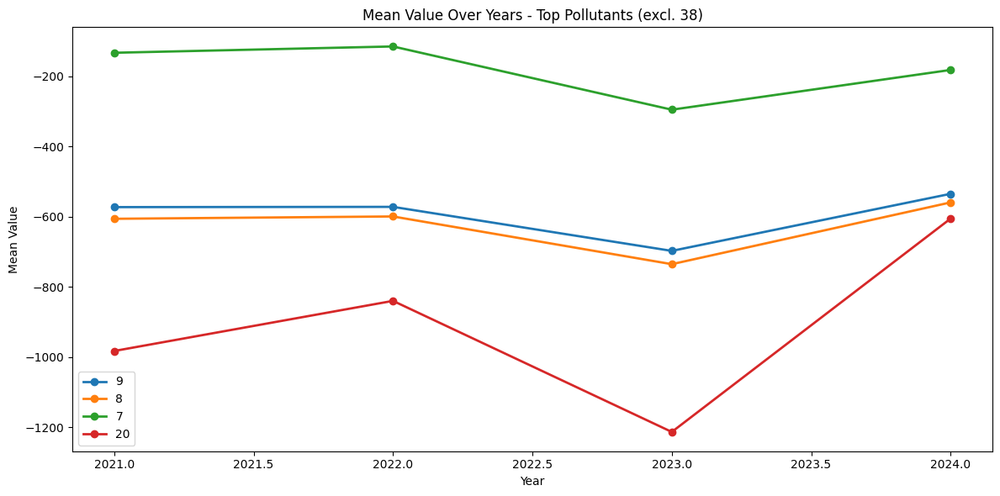

In [ ]:

# 7e. Mean value over time - others
others = [p for p in top_poll if p != dominant]
if others:
    fig, ax = plt.subplots(figsize=(12, 6))
    for poll in others:
        sub = prefinal_df[prefinal_df["Pollutant"] == poll].groupby("Year")["Value"].mean()
        ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)
    ax.set_title(f"Mean Value Over Years - Top Pollutants (excl. {dominant})")
    ax.set_xlabel("Year")
    ax.set_ylabel("Mean Value")
    ax.legend()
    plt.tight_layout()
    plt.show()


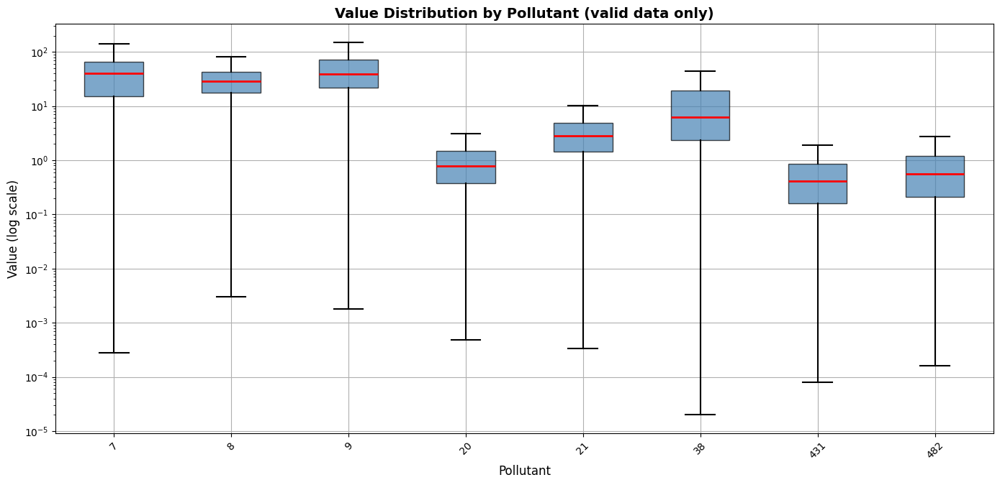

In [ ]:
top8 = prefinal_df["Pollutant"].value_counts().head(8).index
subset = prefinal_df[(prefinal_df["Pollutant"].isin(top8)) &
                      (prefinal_df["Value"] > 0)]

fig, ax = plt.subplots(figsize=(14, 7))
subset.boxplot(column="Value", by="Pollutant", ax=ax, rot=45,
               showfliers=False, patch_artist=True,
               boxprops=dict(facecolor="steelblue", alpha=0.7),
               medianprops=dict(color="red", linewidth=2),
               whiskerprops=dict(linewidth=1.5),
               capprops=dict(linewidth=1.5))
ax.set_yscale("log")
ax.set_title("Value Distribution by Pollutant (valid data only)", fontsize=14, fontweight="bold")
ax.set_xlabel("Pollutant", fontsize=12)
ax.set_ylabel("Value (log scale)", fontsize=12)
plt.suptitle("")
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 8. ZERO & NEGATIVE VALUES
# ============================================================
print("\n" + "=" * 60)
print("8. ZERO & NEGATIVE VALUES")
print("=" * 60)
zero_count = (prefinal_df["Value"] == 0).sum()
neg_count = (prefinal_df["Value"] < 0).sum()
null_count = prefinal_df["Value"].isna().sum()
print(f"  Zeros: {zero_count:,} ({zero_count/len(prefinal_df)*100:.2f}%)")
print(f"  Negatives: {neg_count:,} ({neg_count/len(prefinal_df)*100:.2f}%)")
print(f"  Nulls: {null_count:,} ({null_count/len(prefinal_df)*100:.2f}%)")

if neg_count > 0:
    print(f"\n  Min negative value: {prefinal_df['Value'].min()}")
    print(f"  Negatives by pollutant:")
    negs = prefinal_df[prefinal_df["Value"] < 0]
    print(negs["Pollutant"].value_counts())



8. ZERO & NEGATIVE VALUES
  Zeros: 65,296 (3.42%)
  Negatives: 133,558 (6.99%)
  Nulls: 0 (0.00%)

  Min negative value: -9999.0
  Negatives by pollutant:
Pollutant
38     25352
8      23037
9      22784
20      9584
482     9358
21      9286
464     9246
431     9243
1       8253
7       5251
10      2164
Name: count, dtype: int64


In [ ]:
# Zero and negative breakdown by pollutant
print("=== ZEROS BY POLLUTANT ===")
for poll in prefinal_df["Pollutant"].unique():
    sub = prefinal_df[prefinal_df["Pollutant"] == poll]
    zeros = (sub["Value"] == 0).sum()
    negs = (sub["Value"] < 0).sum()
    nulls = sub["Value"].isna().sum()
    total = len(sub)
    print(f"  Pollutant {poll}: zeros={zeros:,} ({zeros/total*100:.1f}%) | "
          f"negatives={negs:,} ({negs/total*100:.1f}%) | "
          f"nulls={nulls:,} ({nulls/total*100:.1f}%) | total={total:,}")

# Check: are negatives very small (sensor noise) or large?
negs = prefinal_df[prefinal_df["Value"] < 0]
if len(negs) > 0:
    print(f"\n=== NEGATIVE VALUES ===")
    print(f"Count: {len(negs):,}")
    print(f"Range: {negs['Value'].min():.4f} to {negs['Value'].max():.4f}")
    print(f"\nDistribution:")
    print(negs["Value"].describe())

=== ZEROS BY POLLUTANT ===
  Pollutant 20: zeros=6,370 (6.1%) | negatives=9,584 (9.1%) | nulls=0 (0.0%) | total=105,192
  Pollutant 21: zeros=1,033 (1.0%) | negatives=9,286 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 38: zeros=2,848 (0.8%) | negatives=25,352 (7.2%) | nulls=0 (0.0%) | total=350,640
  Pollutant 431: zeros=27,717 (26.3%) | negatives=9,243 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 464: zeros=6,381 (6.1%) | negatives=9,246 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 482: zeros=20,419 (19.4%) | negatives=9,358 (8.9%) | nulls=0 (0.0%) | total=105,192
  Pollutant 8: zeros=39 (0.0%) | negatives=23,037 (6.6%) | nulls=0 (0.0%) | total=350,640
  Pollutant 9: zeros=22 (0.0%) | negatives=22,784 (6.5%) | nulls=0 (0.0%) | total=350,640
  Pollutant 10: zeros=0 (0.0%) | negatives=2,164 (3.1%) | nulls=0 (0.0%) | total=70,128
  Pollutant 1: zeros=22 (0.0%) | negatives=8,253 (15.7%) | nulls=0 (0.0%) | total=52,584
  Pollutant 7: zeros=445 (0.2%) | negatives=5,251 

In [ ]:
# Are zeros happening at specific hours? (sensor downtime = midnight/maintenance?)
prefinal_df["Hour"] = pd.to_datetime(prefinal_df["Start"]).dt.hour
zeros = prefinal_df[prefinal_df["Value"] == 0]

print("Zeros by hour:")
print(zeros["Hour"].value_counts().sort_index())

print("\nZeros by Validity flag:")
print(zeros["Validity"].value_counts())

print("\nNon-zero data by Validity flag:")
valid_data = prefinal_df[(prefinal_df["Value"] > 0)]
print(valid_data["Validity"].value_counts())



Zeros by hour:
Hour
0     2592
1     2733
2     2899
3     3221
4     3706
5     3535
6     2754
7     2127
8     1782
9     1869
10    2076
11    2440
12    2801
13    3183
14    3425
15    3454
16    3201
17    2943
18    2597
19    2310
20    2306
21    2375
22    2418
23    2549
Name: count, dtype: int64

Zeros by Validity flag:
Validity
2    65296
Name: count, dtype: int64

Non-zero data by Validity flag:
Validity
1    1595145
2     116977
Name: count, dtype: int64


In [ ]:
# ============================================================
# 9. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("9. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {prefinal_df.duplicated().sum()}")
print(f"Duplicates by Samplingpoint + Start: {prefinal_df.duplicated(subset=['Samplingpoint', 'Start']).sum()}")
print(f"Duplicates by Samplingpoint + Start + Pollutant: {prefinal_df.duplicated(subset=['Samplingpoint', 'Start', 'Pollutant']).sum()}")


9. DUPLICATES
Exact duplicate rows: 0
Duplicates by Samplingpoint + Start: 0
Duplicates by Samplingpoint + Start + Pollutant: 0


In [ ]:
# ============================================================
# 10. DATA QUALITY SUMMARY
# ============================================================
print("\n" + "=" * 60)
print("10. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(prefinal_df):,}")
print(f"  Columns: {prefinal_df.shape[1]}")
print(f"  Columns with nulls: {(prefinal_df.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {prefinal_df.duplicated().sum()}")
print(f"  Unique sampling points: {prefinal_df['Samplingpoint'].nunique()}")
print(f"  Unique pollutants: {prefinal_df['Pollutant'].nunique()}")
print(f"  Year range: {prefinal_df['Year'].min()} - {prefinal_df['Year'].max()}")
print(f"  Value range: {prefinal_df['Value'].min()} to {prefinal_df['Value'].max()}")
print(f"  Zero values: {(prefinal_df['Value'] == 0).sum():,}")
print(f"  Negative values: {(prefinal_df['Value'] < 0).sum():,}")


10. DATA QUALITY SUMMARY
  Total rows: 1,910,976
  Columns: 14
  Columns with nulls: 1
  Exact duplicates: 0
  Unique sampling points: 55
  Unique pollutants: 11
  Year range: 2021 - 2024
  Value range: -9999.0 to 1135.98413
  Zero values: 65,296
  Negative values: 133,558


In [ ]:
"""
Map all air quality stations from df_stats with their location info
Shows: station name, coordinates, altitude, and what pollutants they measure
"""

import pandas as pd

DF_STATS_PATH = "/content/df_stats.csv"

df = df_stats

# Group by station: get location + list of pollutants
stations = df.groupby("Air Quality Station Name").agg({
    "Latitude": "first",
    "Longitude": "first",
    "Altitude": "first",
    "Sampling Point Id": "nunique",
    "Pollutant": lambda x: list(x.unique()),
    "Year": lambda x: f"{x.min()}-{x.max()}",
}).reset_index()

stations.columns = [
    "Station", "Lat", "Lon", "Altitude",
    "Num_SamplingPoints", "Pollutants", "Year_Range"
]

stations = stations.sort_values("Station").reset_index(drop=True)

print(f"Total unique stations: {len(stations)}\n")

for _, row in stations.iterrows():
    print(f"Station: {row['Station']}")
    print(f"  Coordinates: {row['Lat']}, {row['Lon']}")
    print(f"  Altitude: {row['Altitude']}m")
    print(f"  Sampling Points: {row['Num_SamplingPoints']}")
    print(f"  Pollutants: {row['Pollutants']}")
    print(f"  Years: {row['Year_Range']}")
    print()

# Also show the geographic spread
print("=" * 50)
print("GEOGRAPHIC SPREAD:")
print(f"  Lat range: {stations['Lat'].min()} - {stations['Lat'].max()}")
print(f"  Lon range: {stations['Lon'].min()} - {stations['Lon'].max()}")

# Distance between furthest stations (rough km)
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

max_dist = 0
for i, r1 in stations.iterrows():
    for j, r2 in stations.iterrows():
        d = haversine(r1['Lat'], r1['Lon'], r2['Lat'], r2['Lon'])
        if d > max_dist:
            max_dist = d
            pair = (r1['Station'], r2['Station'])

print(f"  Max distance between stations: {max_dist:.1f} km ({pair[0]} <-> {pair[1]})")
print(f"  Altitude range: {stations['Altitude'].min()}m - {stations['Altitude'].max()}m")

Total unique stations: 10

Station: ARENULA
  Coordinates: 41.894, 12.4754
  Altitude: 17.0m
  Sampling Points: 4
  Pollutants: ['NO', 'NO2', 'NOX as NO2', 'O3']
  Years: 2021-2024

Station: BUFALOTTA
  Coordinates: 41.9477, 12.5337
  Altitude: 36.0m
  Sampling Points: 5
  Pollutants: ['O3', 'NO2', 'NOX as NO2', 'SO2', 'NO']
  Years: 2021-2024

Station: C.SO FRANCIA
  Coordinates: 41.9474, 12.4696
  Altitude: 35.0m
  Sampling Points: 8
  Pollutants: ['C6H6', 'NO', 'C6H5-C2H5', 'm,p-C6H4(CH3)2', 'NO2', 'NOX as NO2', 'C6H5-CH3', 'o-C6H4-(CH3)2']
  Years: 2021-2024

Station: CINECITTA
  Coordinates: 41.8577, 12.5687
  Altitude: 48.0m
  Sampling Points: 4
  Pollutants: ['NO2', 'NOX as NO2', 'NO', 'O3']
  Years: 2021-2024

Station: CIPRO
  Coordinates: 41.9064, 12.4476
  Altitude: 24.0m
  Sampling Points: 4
  Pollutants: ['NO', 'O3', 'NO2', 'NOX as NO2']
  Years: 2021-2024

Station: FERMI
  Coordinates: 41.864, 12.4696
  Altitude: 17.0m
  Sampling Points: 9
  Pollutants: ['NO', 'm,p-C6H4(CH

#parquet table cleaning

In [ ]:
# Drop 'AggType' — not useful for analysis
# Drop 'ResultTime' — only 4 unique values, not informative
# Drop 'DataCapture' — 100% NaN, no data
# Drop 'FkObservationLog' — not useful for analysis
prefinal_df = prefinal_df.drop(columns=["AggType", "ResultTime", "DataCapture", "FkObservationLog"])

print(f"Remaining columns: {prefinal_df.shape[1]}")
print(prefinal_df.columns.tolist())

Remaining columns: 10
['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour']


In [ ]:
# Remove 'IT/' prefix from Samplingpoint in prefinal_df to match df_stats format
# df_stats uses: SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00
# prefinal_df uses: IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00
prefinal_df["Samplingpoint"] = prefinal_df["Samplingpoint"].str.replace("IT/", "", n=1)

# Verify
print("Prefinal sample:", prefinal_df["Samplingpoint"].iloc[0])

Prefinal sample: SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00


In [ ]:
# Replace ALL Validity=2 values with NaN — Validity 2 means "not valid/unreliable"
# This covers zeros, negatives, and any other values flagged as invalid
v2_count = (prefinal_df["Validity"] == 2).sum()

prefinal_df.loc[prefinal_df["Validity"] == 2, "Value"] = np.nan

print(f"Validity=2 values replaced: {v2_count:,}")
print(f"Total NaN in Value now: {prefinal_df['Value'].isna().sum():,}")

Validity=2 values replaced: 188,097
Total NaN in Value now: 188,097


In [ ]:
# Replace any remaining negative values with NaN — sensor noise/artifacts
remaining_neg = (prefinal_df["Value"] < 0).sum()

prefinal_df.loc[prefinal_df["Value"] < 0, "Value"] = np.nan

print(f"Remaining negatives replaced: {remaining_neg:,}")
print(f"Total NaN in Value now: {prefinal_df['Value'].isna().sum():,}")

Remaining negatives replaced: 127,734
Total NaN in Value now: 315,831


In [ ]:
df_stats.head()

,Air Quality Station Name,Sampling Point Id,Pollutant,Air Pollutant Description,Data Aggregation Process Id,Data Aggregation Process,Year,Air Pollution Level,Unit Of Air Pollution Level,Longitude,Latitude,Altitude,Link to raw data (only E1a/validated data from AQ e-Reporting)
0,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,2021,42.74,ug/m3,12.53,41.95,36.00,https://eeadmz1batchservice02.blob.core.window...
1,BUFALOTTA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,O3,Ozone (air),P3Y,3 subsequent calendar years mean,2021,43.68,ug/m3,12.53,41.95,36.00,https://eeadmz1batchservice02.blob.core.window...
2,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y,Annual mean / 1 calendar year,2021,32.30,ug/m3,12.53,41.95,36.00,https://eeadmz1batchservice02.blob.core.window...
3,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,2021,31.22,ug/m3,12.53,41.95,36.00,https://eeadmz1batchservice02.blob.core.window...
4,BUFALOTTA,SPO.IT1835A_8_chemi_2019-03-18_00:00:00,NO2,Nitrogen dioxide (air),P1Y-hr-per50,1 year 50 percentile,2021,28.35,ug/m3,12.53,41.95,36.00,https://eeadmz1batchservice02.blob.core.window...


In [ ]:
# Drop 'Unit Of Air Pollution Level' — unit info already in prefinal_df's 'Unit' column
# Drop 'Air Pollution Level' — aggregated stat, prefinal_df has the actual hourly values
df_stats = df_stats.drop(columns=["Unit Of Air Pollution Level", "Air Pollution Level"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 11
['Air Quality Station Name', 'Sampling Point Id', 'Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Longitude', 'Latitude', 'Altitude', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
prefinal_df.head()

,Samplingpoint,Pollutant,Start,End,Value,Unit,Validity,Verification,Year,Hour
52608,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0
52609,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1
52610,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2
52611,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3
52612,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4


In [ ]:
# Check df_stats: same Samplingpoint + Year, different pollutants
stats_grouped = df_stats.groupby(["Sampling Point Id", "Year"])["Pollutant"].nunique().reset_index()
stats_multi = stats_grouped[stats_grouped["Pollutant"] > 1]
print("df_stats:")
print(f"  Total Samplingpoint+Year groups: {len(stats_grouped)}")
print(f"  Groups with multiple pollutants: {len(stats_multi)}")

# Check prefinal_df: same Samplingpoint + Year, different pollutants
pf_grouped = prefinal_df.groupby(["Samplingpoint", "Year"])["Pollutant"].nunique().reset_index()
pf_multi = pf_grouped[pf_grouped["Pollutant"] > 1]
print("\nprefinal_df:")
print(f"  Total Samplingpoint+Year groups: {len(pf_grouped)}")
print(f"  Groups with multiple pollutants: {len(pf_multi)}")

# Show examples if any
if len(pf_multi) > 0:
    print("\nPrefinal examples:")
    for _, row in pf_multi.head(3).iterrows():
        sp = row["Samplingpoint"]
        yr = row["Year"]
        sub = prefinal_df[(prefinal_df["Samplingpoint"] == sp) & (prefinal_df["Year"] == yr)]
        print(f"  {sp} | Year: {yr} | Pollutant: {sub['Pollutant'].unique()}")

df_stats:
  Total Samplingpoint+Year groups: 218
  Groups with multiple pollutants: 0

prefinal_df:
  Total Samplingpoint+Year groups: 218
  Groups with multiple pollutants: 0


In [ ]:
# Drop Pollutant_code from prefinal_df — each Samplingpoint+Year already maps to one pollutant
# Pollutant name will come from df_stats after merging on Samplingpoint + Year
prefinal_df = prefinal_df.drop(columns=["Pollutant"])

print(f"Remaining columns: {prefinal_df.columns.tolist()}")

Remaining columns: ['Samplingpoint', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour']


In [ ]:
df_stats = df_stats.rename(columns={"Sampling Point Id": "Samplingpoint"})

print("Done. Column renamed to 'Samplingpoint'")

Done. Column renamed to 'Samplingpoint'


In [ ]:
dupes = df_stats.duplicated(subset=["Samplingpoint", "Year"], keep=False)
print(f"Duplicate Samplingpoint+Year in df_stats: {dupes.sum()}")

# Show an example
example = df_stats[df_stats.duplicated(subset=["Samplingpoint", "Year"], keep=False)]
sp = example["Samplingpoint"].iloc[0]
yr = example["Year"].iloc[0]
print(f"\nExample: {sp} | Year: {yr}")
print(df_stats[(df_stats["Samplingpoint"] == sp) & (df_stats["Year"] == yr)])

Duplicate Samplingpoint+Year in df_stats: 2706

Example: SPO.IT1835A_7_UV-P_2006-12-06_00:00:00 | Year: 2021
    Air Quality Station Name                           Samplingpoint  \
0                  BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
1                  BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
118                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
120                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
154                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
155                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
157                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
164                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
180                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
181                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
182                BUFALOTTA  SPO.IT1835A_7_UV-P_2006-12-06_00:00:00   
183                BUFALOTT

In [ ]:
# Check before
print(f"Before: {len(df_stats):,} rows")

df_stats = df_stats.drop(columns=["Data Aggregation Process Id", "Data Aggregation Process"])
df_stats = df_stats.drop_duplicates()

print(f"After: {len(df_stats):,} rows")

# Verify: each Samplingpoint+Year should now have exactly 1 row
check = df_stats.groupby(["Samplingpoint", "Year"]).size()
print(f"Max rows per Samplingpoint+Year: {check.max()}")

Before: 2,706 rows
After: 218 rows
Max rows per Samplingpoint+Year: 1


In [ ]:
# Drop Calculation Time and Link — differ per aggregation type, not needed for analysis
df_stats = df_stats.drop(columns=[

    "Link to raw data (only E1a/validated data from AQ e-Reporting)"
])

# Now deduplicate
df_stats = df_stats.drop_duplicates()

print(f"After: {len(df_stats):,} rows")
check = df_stats.groupby(["Samplingpoint", "Year"]).size()
print(f"Max rows per Samplingpoint+Year: {check.max()}")

After: 218 rows
Max rows per Samplingpoint+Year: 1


In [ ]:
import gc
gc.collect()

print(f"prefinal_df: {len(prefinal_df):,} rows")
print(f"df_stats: {len(df_stats):,} rows")

df_merged = pd.merge(
    prefinal_df,
    df_stats,
    on=["Samplingpoint", "Year"],
    how="left",
    suffixes=("", "_stats"),
)

print(f"Merged: {len(df_merged):,} rows — should equal prefinal_df rows")
print(f"Columns: {df_merged.columns.tolist()}")

prefinal_df: 1,910,976 rows
df_stats: 218 rows
Merged: 1,910,976 rows — should equal prefinal_df rows
Columns: ['Samplingpoint', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour', 'Air Quality Station Name', 'Pollutant', 'Air Pollutant Description', 'Longitude', 'Latitude', 'Altitude']


In [ ]:
df_merged

,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude
0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1910971,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 19:00:00,2024-12-31 20:00:00,144.81,ug.m-3,1,1,2024,19,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00
1910972,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 20:00:00,2024-12-31 21:00:00,176.61,ug.m-3,1,1,2024,20,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00
1910973,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 21:00:00,2024-12-31 22:00:00,138.73,ug.m-3,1,1,2024,21,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00
1910974,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 22:00:00,2024-12-31 23:00:00,120.76,ug.m-3,1,1,2024,22,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00


In [ ]:
df_merged.describe()

,Value,Validity,Verification,Year,Hour,Longitude,Latitude,Altitude
count,1595145.00,1910976.00,1910976.00,1910976.00,1910976.00,1910976.00,1910976.00,1910976.00
mean,28.46,0.96,1.00,2022.49,11.50,12.50,41.91,33.06
std,39.81,0.60,0.00,1.12,6.92,0.04,0.03,12.19
min,0.10,-1.00,1.00,2021.00,0.00,12.45,41.86,17.00
25%,2.54,1.00,1.00,2021.00,5.75,12.47,41.88,24.00
50%,15.45,1.00,1.00,2022.00,11.50,12.51,41.91,35.00
75%,40.31,1.00,1.00,2023.00,17.25,12.53,41.93,48.00
max,1135.98,2.00,1.00,2024.00,23.00,12.57,41.95,50.00


In [ ]:
df_merged = df_merged.to_csv("df_merged_stats_parquet_pre.csv")

Wind Data

This section fetches, inspects, and cleans hourly wind data from the Open-Meteo historical archive API. Data covers 10 monitoring stations in the Rome/Lazio region for 2018–2024, recording wind speed (m/s) and wind direction (degrees) at 10 m height.

Wind Data

Install Required Libraries

We install `openmeteo-requests`, `requests-cache`, and `retry-requests` to interact with the Open-Meteo API with caching and automatic retries.

In [ ]:
!pip install openmeteo-requests
!pip install requests-cache retry-requests numpy pandas
!pip install openmeteo-requests requests-cache retry-requests

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.7/208.7 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 723.5/723.5 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.4/399.4 kB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 60.3 MB/s eta 0:00:00
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 25.12.19
    Uninstalling flatbuffers-25.12.19:
      Successfully uninstalled flatbuffers-25.12.19


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 4.3 MB/s eta 0:00:00


Fetch Hourly Wind Data via Open-Meteo API

For each of the 10 Lazio stations we send a request to the Open-Meteo archive endpoint asking for hourly `wind_speed_10m` and `wind_direction_10m` between 2018-01-01 and 2024-12-31. Results are collected into a single DataFrame `df_wind` and saved to `wind_data_lazio.csv`.

In [ ]:
"""
Pull hourly wind data from Open-Meteo API
==========================================
10 Lazio stations, 2018-01-01 to 2024-12-31

pip install openmeteo-requests requests-cache retry-requests
"""

import openmeteo_requests
import pandas as pd
import requests_cache
from retry_requests import retry
import time

cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

ARCHIVE_URL = "https://archive-api.open-meteo.com/v1/archive"
OUTPUT_PATH = "/content/wind_data_lazio.csv"

stations = {
    "ARENULA":          {"lat": 41.894,  "lon": 12.4754},
    "BUFALOTTA":        {"lat": 41.9477, "lon": 12.5337},
    "C.SO FRANCIA":     {"lat": 41.9474, "lon": 12.4696},
    "CINECITTA":        {"lat": 41.8577, "lon": 12.5687},
    "CIPRO":            {"lat": 41.9064, "lon": 12.4476},
    "FERMI":            {"lat": 41.864,  "lon": 12.4696},
    "L.GO MAGNA GRECIA":{"lat": 41.8831, "lon": 12.509},
    "L.GO PERESTRELLO": {"lat": 41.886,  "lon": 12.5416},
    "TIBURTINA":        {"lat": 41.9103, "lon": 12.5489},
    "VILLA ADA":        {"lat": 41.9329, "lon": 12.5069},
}

START_DATE = "2018-01-01"
END_DATE = "2024-12-31"

all_dfs = []

for name, coords in stations.items():
    print(f"Fetching {name}...")

    try:
        params = {
            "latitude": coords["lat"],
            "longitude": coords["lon"],
            "start_date": START_DATE,
            "end_date": END_DATE,
            "hourly": ["wind_speed_10m", "wind_direction_10m"],
            "timezone": "Europe/Rome",
        }

        responses = openmeteo.weather_api(ARCHIVE_URL, params=params)
        response = responses[0]

        hourly = response.Hourly()
        wind_speed = hourly.Variables(0).ValuesAsNumpy()
        wind_direction = hourly.Variables(1).ValuesAsNumpy()

        dates = pd.date_range(
            start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
            end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
            freq=pd.Timedelta(seconds=hourly.Interval()),
            inclusive="left",
        )

        df = pd.DataFrame({
            "date": dates,
            "wind_speed_10m": wind_speed,
            "wind_direction_10m": wind_direction,
            "station": name,
            "latitude": coords["lat"],
            "longitude": coords["lon"],
        })

        all_dfs.append(df)
        print(f"  {len(df):,} rows")

    except Exception as e:
        print(f"  ERROR: {e}")

    time.sleep(1)

print("\nCombining...")
df_wind = pd.concat(all_dfs, ignore_index=True)
print(f"Total rows: {df_wind.shape[0]:,}")
print(f"Date range: {df_wind['date'].min()} to {df_wind['date'].max()}")

df_wind.to_csv(OUTPUT_PATH, index=False)
print(f"Saved to {OUTPUT_PATH}")

Fetching ARENULA...
  61,368 rows
Fetching BUFALOTTA...
  61,368 rows
Fetching C.SO FRANCIA...
  61,368 rows
Fetching CINECITTA...
  61,368 rows
Fetching CIPRO...
  61,368 rows
Fetching FERMI...
  61,368 rows
Fetching L.GO MAGNA GRECIA...
  61,368 rows
Fetching L.GO PERESTRELLO...
  61,368 rows
Fetching TIBURTINA...
  61,368 rows
Fetching VILLA ADA...
  61,368 rows

Combining...
Total rows: 613,680
Date range: 2017-12-31 22:00:00+00:00 to 2024-12-31 21:00:00+00:00
Saved to /content/wind_data_lazio.csv


Load Wind Data

The saved CSV is read back into `wind_df` for exploratory analysis.

In [ ]:
wind_df = pd.read_csv("wind_data_lazio.csv")

Basic Structure

We print the shape, column names, data types, and first rows to confirm the dataset loaded correctly.

In [ ]:
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {wind_df.shape[0]:,} rows x {wind_df.shape[1]} columns")
print(f"\nColumns: {wind_df.columns.tolist()}")
print(f"\nData types:")
print(wind_df.dtypes)
print(f"\nFirst 5 rows:")
print(wind_df.head())


1. BASIC STRUCTURE
Shape: 613,680 rows x 6 columns

Columns: ['date', 'wind_speed_10m', 'wind_direction_10m', 'station', 'latitude', 'longitude']

Data types:
date                   object
wind_speed_10m        float64
wind_direction_10m    float64
station                object
latitude              float64
longitude             float64
dtype: object

First 5 rows:
                        date  wind_speed_10m  wind_direction_10m  station  \
0  2017-12-31 22:00:00+00:00            8.56              157.75  ARENULA   
1  2017-12-31 23:00:00+00:00            9.39              147.53  ARENULA   
2  2018-01-01 00:00:00+00:00            9.89              146.89  ARENULA   
3  2018-01-01 01:00:00+00:00            9.79              126.03  ARENULA   
4  2018-01-01 02:00:00+00:00           10.64              113.96  ARENULA   

   latitude  longitude  
0     41.89      12.48  
1     41.89      12.48  
2     41.89      12.48  
3     41.89      12.48  
4     41.89      12.48  


Summary Statistics

Descriptive statistics (mean, std, min/max, quartiles) for wind speed and direction across all stations and years.

In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS")
print("=" * 60)
print(wind_df.describe())


2. SUMMARY STATISTICS
       wind_speed_10m  wind_direction_10m  latitude  longitude
count       613680.00           613680.00 613680.00  613680.00
mean             9.82              141.77     41.90      12.51
std              5.93              104.49      0.03       0.04
min              0.00                0.44     41.86      12.45
25%              5.50               39.09     41.88      12.47
50%              8.29              140.19     41.90      12.51
75%             13.04              225.00     41.93      12.54
max             54.28              360.00     41.95      12.57


Missing Data

We check how many values are null per column. The API occasionally returns NaN for hours with no observation.

In [ ]:
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = wind_df.isna().sum()
null_pct = (wind_df.isna().sum() / len(wind_df) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())


3. MISSING DATA
                    count  percent
date                    0     0.00
wind_speed_10m          0     0.00
wind_direction_10m      0     0.00
station                 0     0.00
latitude                0     0.00
longitude               0     0.00


Date Range and Records per Year

We parse the `date` column to datetime, extract `Year`, and verify that observations exist for every year from 2018 to 2024.

In [ ]:
# 5. DATE RANGE
# ============================================================
print("\n" + "=" * 60)
print("5. DATE RANGE")
print("=" * 60)
wind_df["date"] = pd.to_datetime(wind_df["date"])
wind_df["Year"] = wind_df["date"].dt.year
print(f"Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")
print(f"\nRecords per year:")
print(wind_df["Year"].value_counts().sort_index())


5. DATE RANGE
Date range: 2017-12-31 22:00:00+00:00 to 2024-12-31 21:00:00+00:00

Records per year:
Year
2017       20
2018    87600
2019    87600
2020    87840
2021    87600
2022    87600
2023    87600
2024    87820
Name: count, dtype: int64


Wind Speed and Direction Distributions

Histograms of wind speed and wind direction reveal the overall patterns across all stations and years.

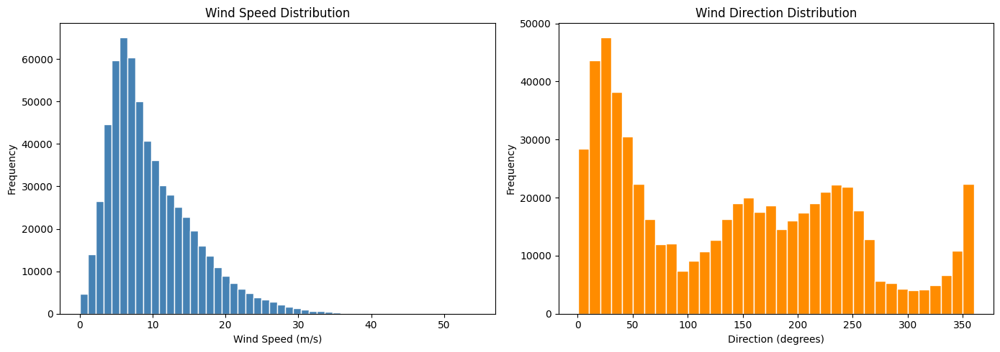

In [ ]:
# 6a. Wind speed distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

wind_df["wind_speed_10m"].dropna().plot(kind="hist", bins=50, ax=axes[0], color="steelblue", edgecolor="white")
axes[0].set_title("Wind Speed Distribution")
axes[0].set_xlabel("Wind Speed (m/s)")

wind_df["wind_direction_10m"].dropna().plot(kind="hist", bins=36, ax=axes[1], color="darkorange", edgecolor="white")
axes[1].set_title("Wind Direction Distribution")
axes[1].set_xlabel("Direction (degrees)")

plt.tight_layout()
plt.show()


Wind Rose Map

A mini wind-rose diagram is created for each station and overlaid on an OpenStreetMap basemap, showing station-level directional patterns.

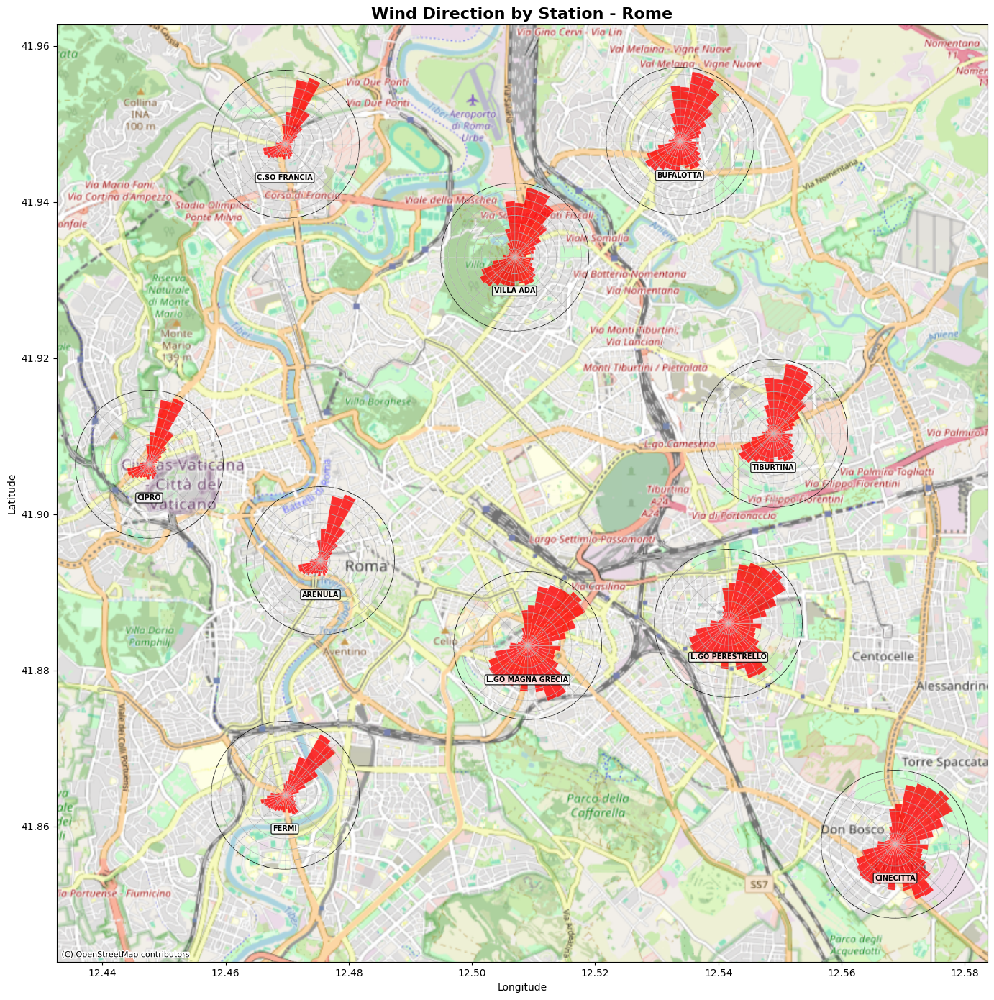

In [ ]:
import contextily as ctx
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from io import BytesIO

stations_info = wind_df.groupby("station").agg({"latitude": "first", "longitude": "first"}).reset_index()
direction_bins = np.linspace(0, 360, 37)

fig, ax_map = plt.subplots(figsize=(14, 14))

# Set map bounds with padding
pad = 0.015
ax_map.set_xlim(stations_info["longitude"].min() - pad, stations_info["longitude"].max() + pad)
ax_map.set_ylim(stations_info["latitude"].min() - pad, stations_info["latitude"].max() + pad)

# Add basemap
ctx.add_basemap(ax_map, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

# For each station, create a mini wind rose and paste it on the map
for _, row in stations_info.iterrows():
    station = row["station"]
    lat, lon = row["latitude"], row["longitude"]

    # Create mini wind rose as an image
    fig_mini, ax_mini = plt.subplots(figsize=(4, 4), subplot_kw={"projection": "polar"})
    data = wind_df[wind_df["station"] == station]["wind_direction_10m"].dropna()
    counts, _ = np.histogram(data, bins=direction_bins)
    theta = np.deg2rad((direction_bins[:-1] + direction_bins[1:]) / 2)
    ax_mini.bar(theta, counts, width=np.deg2rad(10), color="red", alpha=0.8, edgecolor="white", linewidth=0.3)
    ax_mini.set_theta_zero_location("N")
    ax_mini.set_theta_direction(-1)
    ax_mini.set_yticklabels([])
    ax_mini.set_xticklabels([])
    ax_mini.patch.set_alpha(0)
    fig_mini.patch.set_alpha(0)

    # Save mini figure to buffer
    buf = BytesIO()
    fig_mini.savefig(buf, format="png", dpi=80, bbox_inches="tight", transparent=True)
    plt.close(fig_mini)
    buf.seek(0)

    # Read image and place on map
    from PIL import Image
    img = Image.open(buf)
    img_array = np.array(img)

    im = OffsetImage(img_array, zoom=0.6)
    ab = AnnotationBbox(im, (lon, lat), frameon=False)
    ax_map.add_artist(ab)

    # Add station name
    ax_map.annotate(station, (lon, lat), fontsize=7, fontweight="bold",
                    ha="center", va="top", xytext=(0, -30), textcoords="offset points",
                    bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.8))

ax_map.set_title("Wind Direction by Station - Rome", fontsize=16, fontweight="bold")
ax_map.set_xlabel("Longitude")
ax_map.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

Monthly and Hourly Wind Speed Patterns

Bar chart of monthly averages shows seasonal variation. Line chart of hourly averages reveals the diurnal cycle.

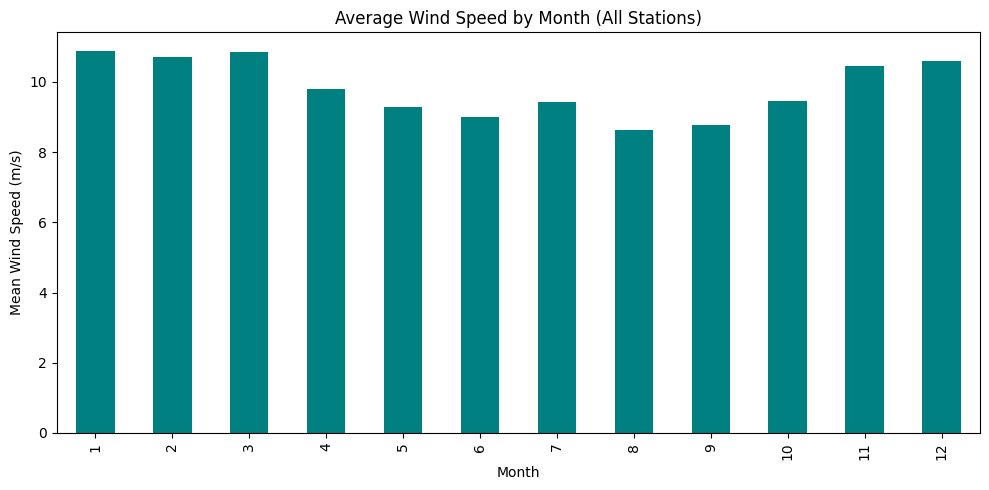

In [ ]:
# 6d. Monthly average wind speed
wind_df["month"] = wind_df["date"].dt.month
monthly = wind_df.groupby("month")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
monthly.plot(kind="bar", ax=ax, color="teal")
ax.set_title("Average Wind Speed by Month (All Stations)")
ax.set_xlabel("Month")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


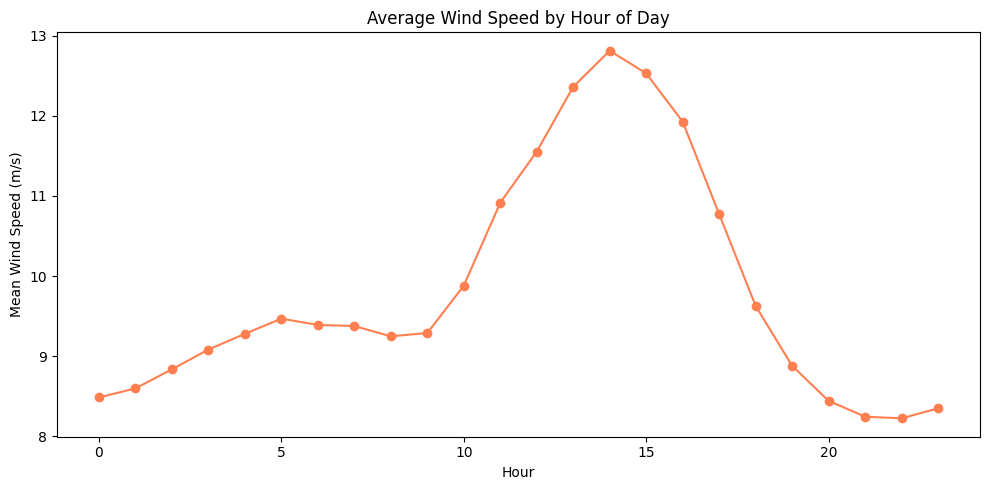

In [ ]:

# 6e. Hourly pattern
wind_df["hour"] = wind_df["date"].dt.hour
hourly = wind_df.groupby("hour")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
hourly.plot(kind="line", ax=ax, marker="o", color="coral")
ax.set_title("Average Wind Speed by Hour of Day")
ax.set_xlabel("Hour")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


Yearly Wind Speed Trends

Annual mean wind speed shown overall and broken down per station to detect long-term trends or anomalies.

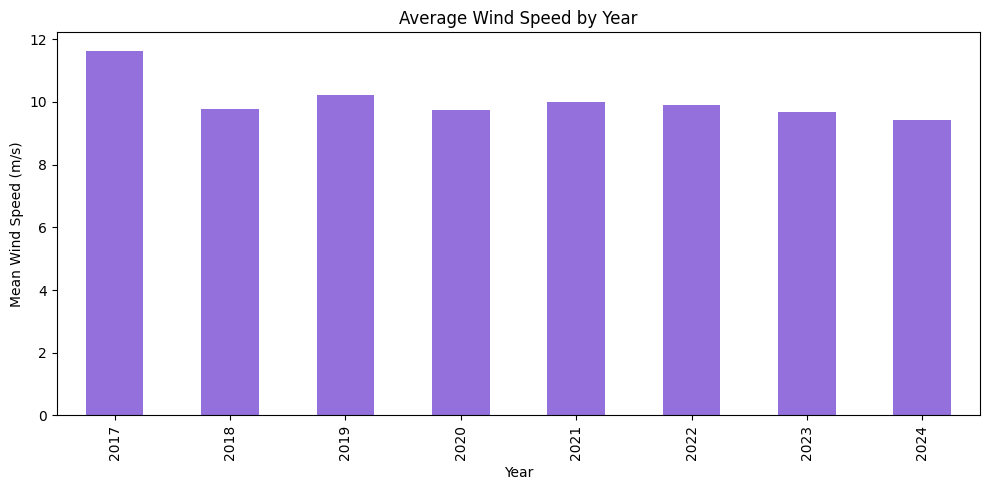

In [ ]:
# 6f. Yearly average wind speed
yearly = wind_df.groupby("Year")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
yearly.plot(kind="bar", ax=ax, color="mediumpurple")
ax.set_title("Average Wind Speed by Year")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


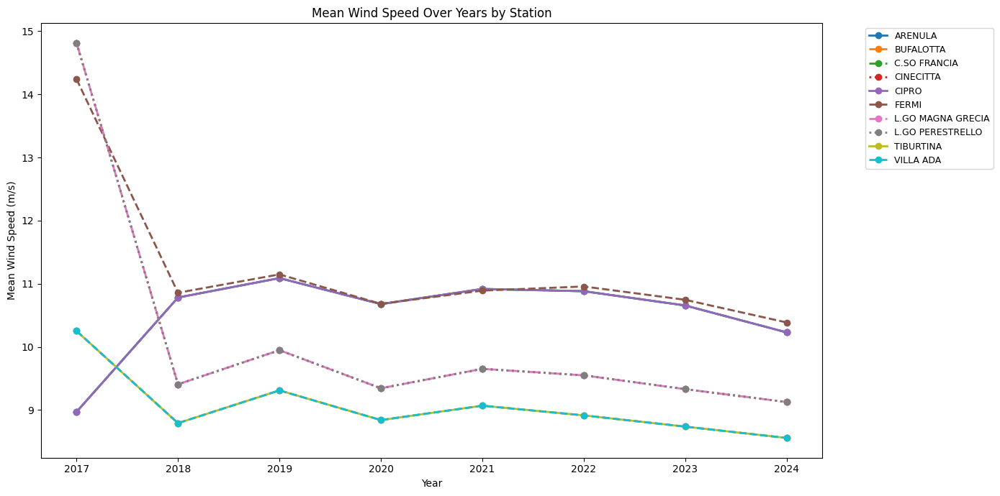

In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))
stations_sorted = sorted(wind_df["station"].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(stations_sorted)))
linestyles = ["-", "--", "-.", ":", "-", "--", "-.", ":", "-", "--"]

for i, station in enumerate(stations_sorted):
    sub = wind_df[wind_df["station"] == station].groupby("Year")["wind_speed_10m"].mean()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2,
            label=station, color=colors[i], linestyle=linestyles[i])

ax.set_title("Mean Wind Speed Over Years by Station")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Wind Speed (m/s)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()

Zero and Negative Values

We count zeros (calm wind — physically valid) and negative values (sensor error — physically impossible) for each numeric column.

In [ ]:
# ============================================================
# 7. ZERO & NEGATIVE VALUES
# ============================================================
print("\n" + "=" * 60)
print("7. ZERO & NEGATIVE VALUES")
print("=" * 60)
for col in ["wind_speed_10m", "wind_direction_10m"]:
    zeros = (wind_df[col] == 0).sum()
    negs = (wind_df[col] < 0).sum()
    nulls = wind_df[col].isna().sum()
    print(f"  {col}: zeros={zeros:,} ({zeros/len(wind_df)*100:.2f}%) | "
          f"negatives={negs:,} | nulls={nulls:,}")


7. ZERO & NEGATIVE VALUES
  wind_speed_10m: zeros=256 (0.04%) | negatives=0 | nulls=0
  wind_direction_10m: zeros=0 (0.00%) | negatives=0 | nulls=0


Duplicate Check

We verify there are no fully duplicated rows and no duplicate `(station, date)` pairs.

In [ ]:
# 8. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {wind_df.duplicated().sum()}")
print(f"Duplicates by station + date: {wind_df.duplicated(subset=['station', 'date']).sum()}")


8. DUPLICATES
Exact duplicate rows: 0
Duplicates by station + date: 0


Data Quality Summary

Consolidated overview: total rows, null counts, duplicate count, unique stations, date range, and value ranges.

In [ ]:
print("\n" + "=" * 60)
print("9. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(wind_df):,}")
print(f"  Columns: {wind_df.shape[1]}")
print(f"  Columns with nulls: {(wind_df.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {wind_df.duplicated().sum()}")
print(f"  Unique stations: {wind_df['station'].nunique()}")
print(f"  Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")
print(f"  Wind speed range: {wind_df['wind_speed_10m'].min():.2f} to {wind_df['wind_speed_10m'].max():.2f} m/s")
print(f"  Wind direction range: {wind_df['wind_direction_10m'].min():.1f} to {wind_df['wind_direction_10m'].max():.1f} degrees")


9. DATA QUALITY SUMMARY
  Total rows: 613,680
  Columns: 9
  Columns with nulls: 0
  Exact duplicates: 0
  Unique stations: 10
  Date range: 2017-12-31 22:00:00+00:00 to 2024-12-31 21:00:00+00:00
  Wind speed range: 0.00 to 54.28 m/s
  Wind direction range: 0.4 to 360.0 degrees


In [ ]:
wind_df.head()

,date,wind_speed_10m,wind_direction_10m,station,latitude,longitude,Year,month,hour
0,2017-12-31 22:00:00+00:00,8.56,157.75,ARENULA,41.89,12.48,2017,12,22
1,2017-12-31 23:00:00+00:00,9.39,147.53,ARENULA,41.89,12.48,2017,12,23
2,2018-01-01 00:00:00+00:00,9.89,146.89,ARENULA,41.89,12.48,2018,1,0
3,2018-01-01 01:00:00+00:00,9.79,126.03,ARENULA,41.89,12.48,2018,1,1
4,2018-01-01 02:00:00+00:00,10.64,113.96,ARENULA,41.89,12.48,2018,1,2


Filter to Analysis Period 2021–2024

We trim wind data to match the air quality dataset range (2021–2024) and remove timezone info from the `date` column for clean joining.

In [ ]:
# Filter wind data to 2021-2024 to match air quality data range
wind_df["date"] = pd.to_datetime(wind_df["date"]).dt.tz_localize(None)
wind_df = wind_df[wind_df["date"].dt.year.between(2021, 2024)].copy()

print(f"Wind rows after filtering: {len(wind_df):,}")
print(f"Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")

Wind rows after filtering: 350,620
Date range: 2021-01-01 00:00:00 to 2024-12-31 21:00:00


BURASI


Load Merged Air Quality Dataset

We load `df_merged_stats_parquet_pre.csv`, the cleaned hourly air quality measurements from multiple Rome monitoring stations.

In [ ]:
df_merged = pd.read_csv("df_merged_stats_parquet_pre.csv")

In [ ]:
df_merged.head()

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00


Match Air Quality Stations to Nearest Wind Station — Preview

Using the Haversine formula we compute the great-circle distance between every air quality station and every wind station, printing the closest match and its distance for inspection.

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Get unique stations from both datasets
aq_stations = df_merged[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()
wind_stations = wind_df[["station", "latitude", "longitude"]].drop_duplicates()

print("Matching air quality stations to closest wind stations:\n")

for _, aq in aq_stations.iterrows():
    min_dist = float("inf")
    closest = None
    for _, ws in wind_stations.iterrows():
        d = haversine(aq["Latitude"], aq["Longitude"], ws["latitude"], ws["longitude"])
        if d < min_dist:
            min_dist = d
            closest = ws["station"]
    print(f"  {aq['Air Quality Station Name']:20s} -> {closest:20s} ({min_dist:.2f} km)")

Matching air quality stations to closest wind stations:

  C.SO FRANCIA         -> C.SO FRANCIA         (0.00 km)
  L.GO MAGNA GRECIA    -> L.GO MAGNA GRECIA    (0.00 km)
  VILLA ADA            -> VILLA ADA            (0.00 km)
  CINECITTA            -> CINECITTA            (0.00 km)
  L.GO PERESTRELLO     -> L.GO PERESTRELLO     (0.00 km)
  TIBURTINA            -> TIBURTINA            (0.00 km)
  BUFALOTTA            -> BUFALOTTA            (0.00 km)
  CIPRO                -> CIPRO                (0.00 km)
  FERMI                -> FERMI                (0.00 km)
  ARENULA              -> ARENULA              (0.00 km)


In [ ]:
wind_df.head()

,date,wind_speed_10m,wind_direction_10m,station,latitude,longitude,Year,month,hour
26306,2021-01-01 00:00:00,5.09,45.00,ARENULA,41.89,12.48,2021,1,0
26307,2021-01-01 01:00:00,7.24,63.44,ARENULA,41.89,12.48,2021,1,1
26308,2021-01-01 02:00:00,8.09,122.28,ARENULA,41.89,12.48,2021,1,2
26309,2021-01-01 03:00:00,7.20,126.87,ARENULA,41.89,12.48,2021,1,3
26310,2021-01-01 04:00:00,9.18,115.56,ARENULA,41.89,12.48,2021,1,4


In [ ]:
df_merged.head()

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00


Build Station Mapping and Add Column

We store the AQ → wind station mapping in a dictionary and add a `wind_station` column to `df_merged` so each row knows which wind station to look up during the merge.

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Get unique wind stations
wind_stations = wind_df[["station", "latitude", "longitude"]].drop_duplicates()

# For each air quality station, find closest wind station
aq_stations = df_merged[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()

station_mapping = {}
for _, aq in aq_stations.iterrows():
    min_dist = float("inf")
    closest = None
    for _, ws in wind_stations.iterrows():
        d = haversine(aq["Latitude"], aq["Longitude"], ws["latitude"], ws["longitude"])
        if d < min_dist:
            min_dist = d
            closest = ws["station"]
    station_mapping[aq["Air Quality Station Name"]] = closest

# Add closest wind station column to df_merged
df_merged["wind_station"] = df_merged["Air Quality Station Name"].map(station_mapping)

print("Station mapping:")
for aq, ws in station_mapping.items():
    print(f"  {aq} -> {ws}")

Station mapping:
  C.SO FRANCIA -> C.SO FRANCIA
  L.GO MAGNA GRECIA -> L.GO MAGNA GRECIA
  VILLA ADA -> VILLA ADA
  CINECITTA -> CINECITTA
  L.GO PERESTRELLO -> L.GO PERESTRELLO
  TIBURTINA -> TIBURTINA
  BUFALOTTA -> BUFALOTTA
  CIPRO -> CIPRO
  FERMI -> FERMI
  ARENULA -> ARENULA


In [ ]:
df_merged.head()

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude,wind_station
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA


In [ ]:
wind_df.head()

,date,wind_speed_10m,wind_direction_10m,station,latitude,longitude,Year,month,hour
26306,2021-01-01 00:00:00,5.09,45.00,ARENULA,41.89,12.48,2021,1,0
26307,2021-01-01 01:00:00,7.24,63.44,ARENULA,41.89,12.48,2021,1,1
26308,2021-01-01 02:00:00,8.09,122.28,ARENULA,41.89,12.48,2021,1,2
26309,2021-01-01 03:00:00,7.20,126.87,ARENULA,41.89,12.48,2021,1,3
26310,2021-01-01 04:00:00,9.18,115.56,ARENULA,41.89,12.48,2021,1,4


In [ ]:
df_merged["Start"] = pd.to_datetime(df_merged["Start"], format="mixed")
wind_df["date"] = pd.to_datetime(wind_df["date"], format="mixed")

Merge Wind Data onto Air Quality Data (hourly join)

Both datasets are floor-rounded to the nearest hour (`hour_key`). A left join on `(wind_station, hour_key)` attaches `wind_speed_10m` and `wind_direction_10m` to every air quality record.

In [ ]:
# Make sure both datetimes are aligned
df_merged["Start"] = pd.to_datetime(df_merged["Start"])
wind_df["date"] = pd.to_datetime(wind_df["date"])

# Round both to nearest hour to ensure matching
df_merged["hour_key"] = df_merged["Start"].dt.floor("H")
wind_df["hour_key"] = wind_df["date"].dt.floor("H")

# Merge: match wind station + hour
df_wind_merged = pd.merge(
    df_merged,
    wind_df[["station", "hour_key", "wind_speed_10m", "wind_direction_10m"]],
    left_on=["wind_station", "hour_key"],
    right_on=["station", "hour_key"],
    how="left"
)

# Drop extra columns
df_wind_merged = df_wind_merged.drop(columns=["station", "hour_key"])

matched = df_wind_merged["wind_speed_10m"].notna().sum()
total = len(df_wind_merged)
print(f"Rows: {total:,}")
print(f"Wind data matched: {matched:,} ({matched/total*100:.1f}%)")

/tmp/ipykernel_16227/1020535443.py:6: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_merged["hour_key"] = df_merged["Start"].dt.floor("H")
/tmp/ipykernel_16227/1020535443.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  wind_df["hour_key"] = wind_df["date"].dt.floor("H")


Rows: 1,910,976
Wind data matched: 1,910,868 (100.0%)


In [ ]:
df_wind_merged.head()

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude,wind_station,wind_speed_10m,wind_direction_10m
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,5.09,45.00
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.24,63.44
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,8.09,122.28
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.20,126.87
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,9.18,115.56


Save First Combined Dataset

The merged DataFrame is written to `air_wind_last_.csv`.

In [ ]:
df_wind_merged = df_wind_merged.to_csv("air_wind_last_.csv")

In [ ]:
dataset1 = pd.read_csv("air_wind_last_.csv")

In [ ]:
dataset1.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Samplingpoint', 'Start', 'End', 'Value',
       'Unit', 'Validity', 'Verification', 'Year', 'Hour',
       'Air Quality Station Name', 'Pollutant', 'Air Pollutant Description',
       'Longitude', 'Latitude', 'Altitude', 'wind_station', 'wind_speed_10m',
       'wind_direction_10m'],
      dtype='object')

In [ ]:
non_numeric = dataset1.select_dtypes(include="object").columns
for col in non_numeric:
    print(f"  {col}: {dataset1[col].nunique()} unique")

  Samplingpoint: 55 unique
  Start: 35064 unique
  End: 35064 unique
  Unit: 2 unique
  Air Quality Station Name: 10 unique
  Pollutant: 11 unique
  Air Pollutant Description: 11 unique
  wind_station: 10 unique


last eda


Re-run Wind Merge on Final Dataset

We repeat the full pipeline on the definitive air quality dataset (`dataframe10`) using the full wind archive (`lastwind`), producing the analysis-ready combined DataFrame.

In [ ]:
dataset5 = pd.read_csv("df_merged_stats_parquet_pre.csv")

In [ ]:
lastdataframe = pd.read_csv("air_wind_last_.csv")

In [ ]:
lastdataframe.head()

,Unnamed: 0.1,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude,wind_station,wind_speed_10m,wind_direction_10m
0,0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,5.09,45.00
1,1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.24,63.44
2,2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,8.09,122.28
3,3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.20,126.87
4,4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,9.18,115.56


In [ ]:
lastdataframe.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Samplingpoint', 'Start', 'End', 'Value',
       'Unit', 'Validity', 'Verification', 'Year', 'Hour',
       'Air Quality Station Name', 'Pollutant', 'Air Pollutant Description',
       'Longitude', 'Latitude', 'Altitude', 'wind_station', 'wind_speed_10m',
       'wind_direction_10m'],
      dtype='object')

In [ ]:
print(f"Shape: {lastdataframe.shape}")
print(f"\nUnique stations: {lastdataframe['Air Quality Station Name'].nunique()}")
print(lastdataframe["Air Quality Station Name"].value_counts())

Shape: (1910976, 20)

Unique stations: 10
Air Quality Station Name
VILLA ADA            385704
FERMI                315576
C.SO FRANCIA         280512
BUFALOTTA            157776
CIPRO                140256
CINECITTA            140256
ARENULA              140256
L.GO PERESTRELLO     140256
L.GO MAGNA GRECIA    105192
TIBURTINA            105192
Name: count, dtype: int64


In [ ]:
lastwind = pd.read_csv("wind_data_lazio.csv")

In [ ]:
lastwind.head()

,date,wind_speed_10m,wind_direction_10m,station,latitude,longitude
0,2017-12-31 22:00:00+00:00,8.56,157.75,ARENULA,41.89,12.48
1,2017-12-31 23:00:00+00:00,9.39,147.53,ARENULA,41.89,12.48
2,2018-01-01 00:00:00+00:00,9.89,146.89,ARENULA,41.89,12.48
3,2018-01-01 01:00:00+00:00,9.79,126.03,ARENULA,41.89,12.48
4,2018-01-01 02:00:00+00:00,10.64,113.96,ARENULA,41.89,12.48


In [ ]:
dataframe10 = pd.read_csv("df_merged_stats_parquet_pre.csv")

In [ ]:
dataframe10.head()

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00


In [ ]:
print(f"Shape: {dataframe10.shape}")
print(f"\nUnique stations: {dataframe10['Air Quality Station Name'].nunique()}")
print(dataframe10["Air Quality Station Name"].value_counts())

Shape: (1910976, 16)

Unique stations: 10
Air Quality Station Name
VILLA ADA            385704
FERMI                315576
C.SO FRANCIA         280512
BUFALOTTA            157776
CIPRO                140256
CINECITTA            140256
ARENULA              140256
L.GO PERESTRELLO     140256
L.GO MAGNA GRECIA    105192
TIBURTINA            105192
Name: count, dtype: int64


Rebuild Station Mapping for Final Dataset

Haversine matching is re-run on `dataframe10` to assign the closest wind station to each air quality station.

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Get unique stations from both datasets
aq_stations = dataframe10[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()
wind_stations = lastwind[["station", "latitude", "longitude"]].drop_duplicates()

# Map each AQ station to closest wind station
station_mapping = {}
for _, aq in aq_stations.iterrows():
    min_dist = float("inf")
    closest = None
    for _, ws in wind_stations.iterrows():
        d = haversine(aq["Latitude"], aq["Longitude"], ws["latitude"], ws["longitude"])
        if d < min_dist:
            min_dist = d
            closest = ws["station"]
    station_mapping[aq["Air Quality Station Name"]] = closest

# Add to dataframe10
dataframe10["wind_station"] = dataframe10["Air Quality Station Name"].map(station_mapping)

print("Station mapping:")
for aq, ws in station_mapping.items():
    print(f"  {aq} -> {ws}")

Station mapping:
  C.SO FRANCIA -> C.SO FRANCIA
  L.GO MAGNA GRECIA -> L.GO MAGNA GRECIA
  VILLA ADA -> VILLA ADA
  CINECITTA -> CINECITTA
  L.GO PERESTRELLO -> L.GO PERESTRELLO
  TIBURTINA -> TIBURTINA
  BUFALOTTA -> BUFALOTTA
  CIPRO -> CIPRO
  FERMI -> FERMI
  ARENULA -> ARENULA


Align Timestamps and Merge

Datetimes are parsed and stripped of timezone info. After floor-rounding to the hour, a left join attaches wind variables to `dataframe10`.

In [ ]:
# Align datetimes
dataframe10["Start"] = pd.to_datetime(dataframe10["Start"], format="mixed")
lastwind["date"] = pd.to_datetime(lastwind["date"], format="mixed").dt.tz_localize(None)

# Create hour key for matching
dataframe10["hour_key"] = dataframe10["Start"].dt.floor("H")
lastwind["hour_key"] = lastwind["date"].dt.floor("H")

# Merge wind data
dataframe10 = pd.merge(
    dataframe10,
    lastwind[["station", "hour_key", "wind_speed_10m", "wind_direction_10m"]],
    left_on=["wind_station", "hour_key"],
    right_on=["station", "hour_key"],
    how="left"
)

dataframe10 = dataframe10.drop(columns=["station", "hour_key"])

matched = dataframe10["wind_speed_10m"].notna().sum()
print(f"\nWind data matched: {matched:,} / {len(dataframe10):,} ({matched/len(dataframe10)*100:.1f}%)")

/tmp/ipykernel_16227/4230360786.py:6: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dataframe10["hour_key"] = dataframe10["Start"].dt.floor("H")
/tmp/ipykernel_16227/4230360786.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  lastwind["hour_key"] = lastwind["date"].dt.floor("H")



Wind data matched: 1,910,868 / 1,910,976 (100.0%)


In [ ]:
matched

np.int64(1910868)

In [ ]:
dataframe10

,Unnamed: 0,Samplingpoint,Start,End,Value,Unit,Validity,Verification,Year,Hour,Air Quality Station Name,Pollutant,Air Pollutant Description,Longitude,Latitude,Altitude,wind_station,wind_speed_10m,wind_direction_10m
0,0,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 00:00:00,2021-01-01 01:00:00,2.34,ug.m-3,1,1,2021,0,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,5.09,45.00
1,1,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 01:00:00,2021-01-01 02:00:00,NaN,ug.m-3,-1,1,2021,1,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.24,63.44
2,2,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 02:00:00,2021-01-01 03:00:00,2.32,ug.m-3,1,1,2021,2,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,8.09,122.28
3,3,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 03:00:00,2021-01-01 04:00:00,2.05,ug.m-3,1,1,2021,3,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,7.20,126.87
4,4,SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,2021-01-01 04:00:00,2021-01-01 05:00:00,1.76,ug.m-3,1,1,2021,4,C.SO FRANCIA,C6H6,Benzene (air),12.47,41.95,35.00,C.SO FRANCIA,9.18,115.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1910971,1910971,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 19:00:00,2024-12-31 20:00:00,144.81,ug.m-3,1,1,2024,19,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00,ARENULA,3.98,18.44
1910972,1910972,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 20:00:00,2024-12-31 21:00:00,176.61,ug.m-3,1,1,2024,20,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00,ARENULA,6.03,17.35
1910973,1910973,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 21:00:00,2024-12-31 22:00:00,138.73,ug.m-3,1,1,2024,21,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00,ARENULA,7.35,21.54
1910974,1910974,SPO.IT1906A_9_chemi_2008-02-03_00:00:00,2024-12-31 22:00:00,2024-12-31 23:00:00,120.76,ug.m-3,1,1,2024,22,ARENULA,NOX as NO2,Nitrogen oxides (air),12.48,41.89,17.00,ARENULA,NaN,NaN


In [ ]:
dataframe10.columns

Index(['Unnamed: 0', 'Samplingpoint', 'Start', 'End', 'Value', 'Unit',
       'Validity', 'Verification', 'Year', 'Hour', 'Air Quality Station Name',
       'Pollutant', 'Air Pollutant Description', 'Longitude', 'Latitude',
       'Altitude', 'wind_station', 'wind_speed_10m', 'wind_direction_10m'],
      dtype='object')

Drop Redundant Columns

We remove columns that are no longer needed: `Unnamed: 0` (CSV index artifact), `End` (redundant), `Unit` (constant), `Verification` (already applied), `Air Pollutant Description` (redundant), and `Samplingpoint` (station name used instead).

In [ ]:
# Unnamed: 0 — index artifact from CSV save
# End — redundant, Start + 1 hour
# Unit — same unit for all rows
# Verification — already cleaned using Validity
# Air Pollutant Description — redundant with Pollutant code
# Samplingpoint — station name is more readable
dataframe10 = dataframe10.drop(columns=[
    "Unnamed: 0", "End", "Unit", "Verification",
    "Air Pollutant Description", "Samplingpoint"
])

print(f"Remaining columns: {dataframe10.columns.tolist()}")

Remaining columns: ['Start', 'Value', 'Validity', 'Year', 'Hour', 'Air Quality Station Name', 'Pollutant', 'Longitude', 'Latitude', 'Altitude', 'wind_station', 'wind_speed_10m', 'wind_direction_10m']


Drop Validity Column

The `Validity` column has already been used to filter out unreliable readings and is no longer needed.

In [ ]:
dataframe10 = dataframe10.drop(columns = "Validity")

Drop Start Column

The `Start` timestamp has been used for all time-based joins and feature extraction. It is dropped to keep the dataset lean.

In [ ]:
dataframe10 = dataframe10.drop(columns = "Start")

Save Final Combined Dataset

The fully merged and cleaned DataFrame is saved as `air&wind_combined.csv`, the primary input for all subsequent modelling sections.

In [ ]:
dataframe10 = dataframe10.to_csv("air&wind_combined.csv")

In [ ]:
dataframe10 = pd.read_csv("air&wind_combined.csv")

Shape: (1910976, 12)
Unique stations: 10
Unique pollutants: 11
Year range: 2021 - 2024

Nulls:
Unnamed: 0                       0
Value                       315831
Year                             0
Hour                             0
Air Quality Station Name         0
Pollutant                        0
Longitude                        0
Latitude                         0
Altitude                         0
wind_station                     0
wind_speed_10m                 108
wind_direction_10m             108
dtype: int64


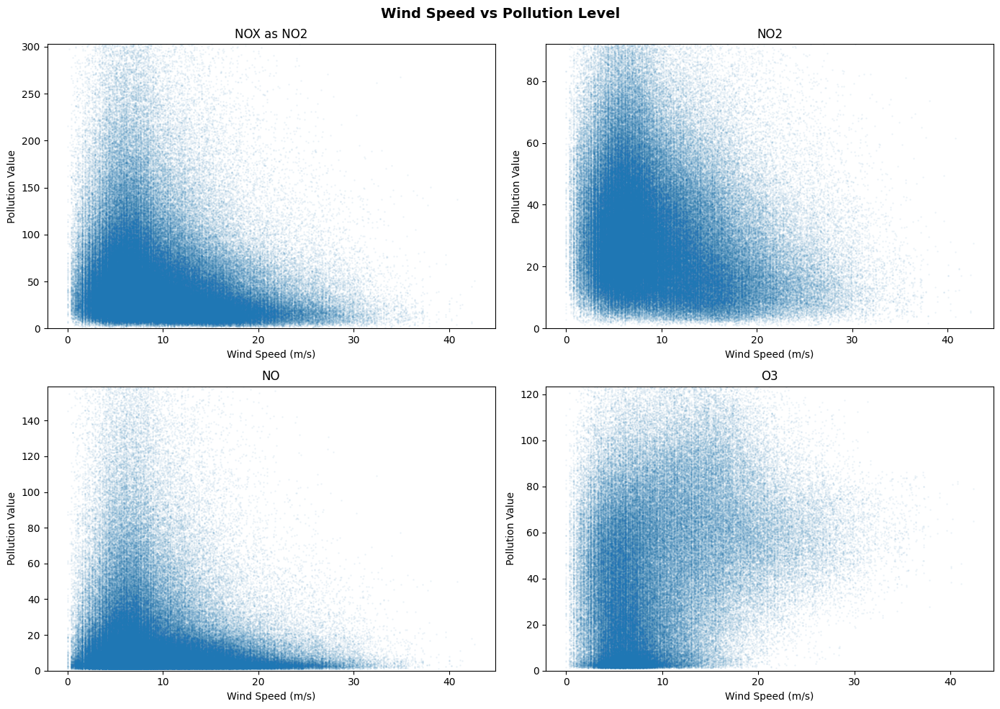

/tmp/ipykernel_16227/2786284738.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["wind_bin"] = pd.cut(valid["wind_speed_10m"], bins=[0, 3, 6, 10, 15, 50],


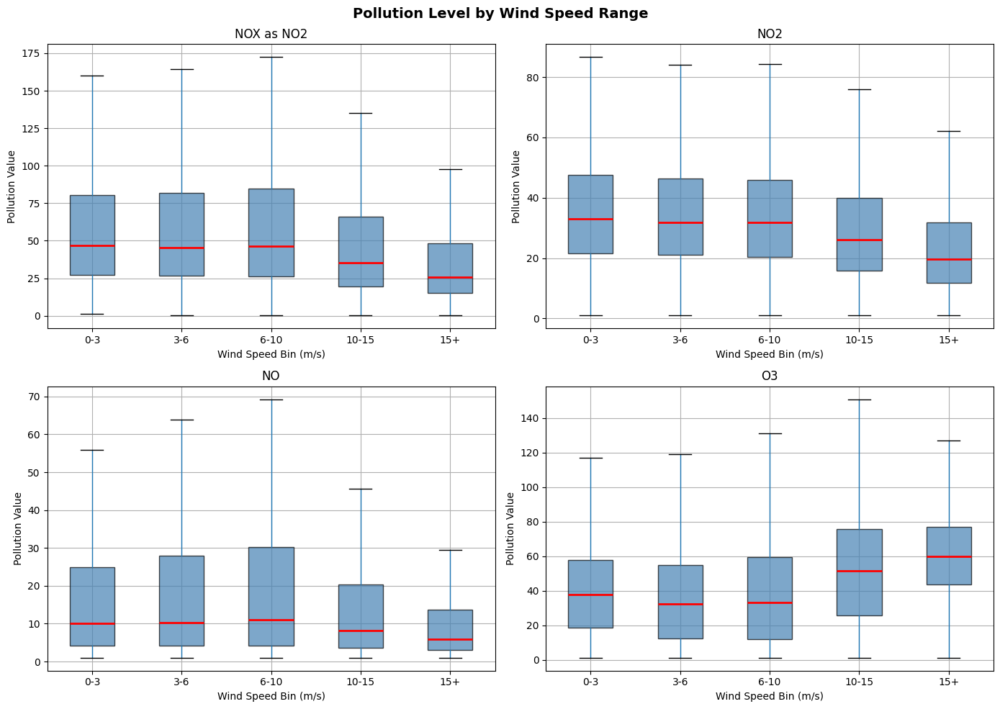

/tmp/ipykernel_16227/2786284738.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()
/tmp/ipykernel_16227/2786284738.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()
/tmp/ipykernel_16227/2786284738.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean(

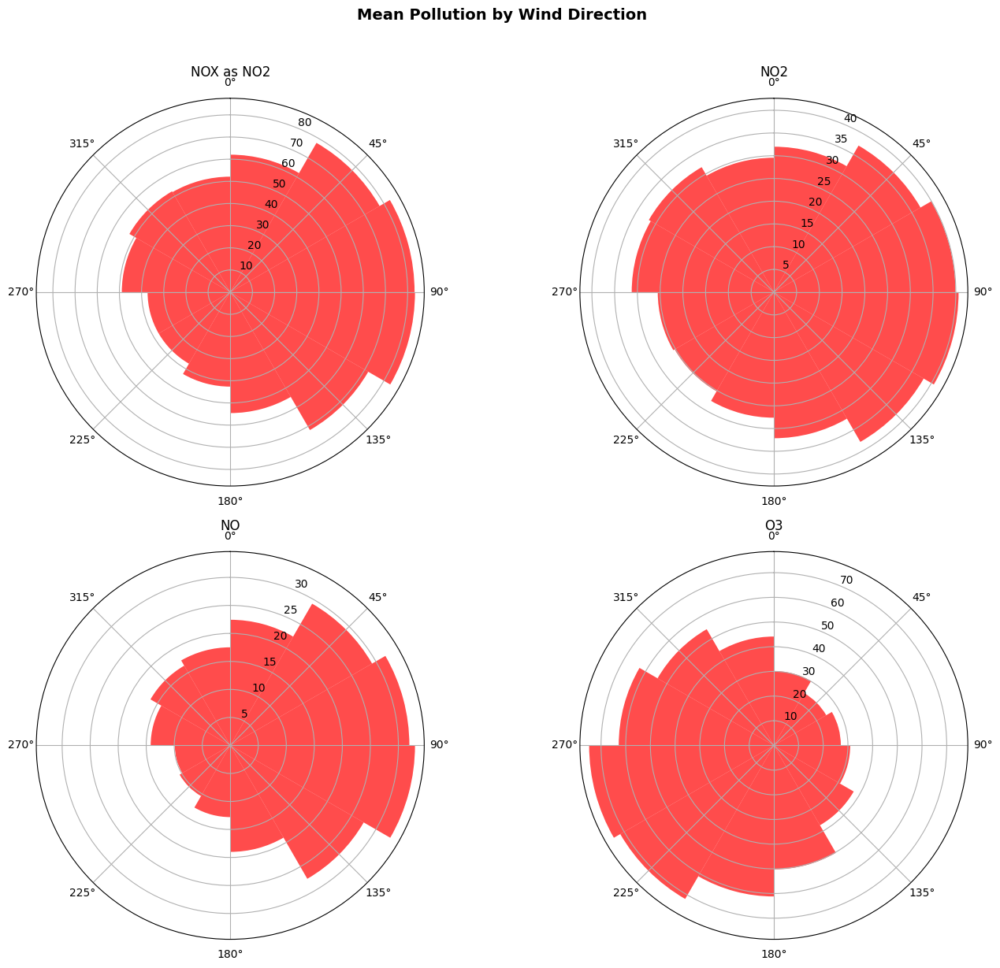

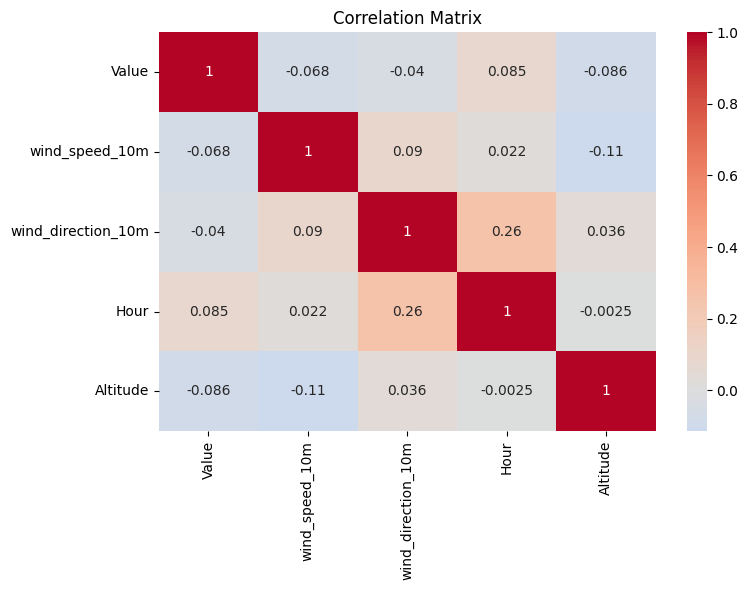

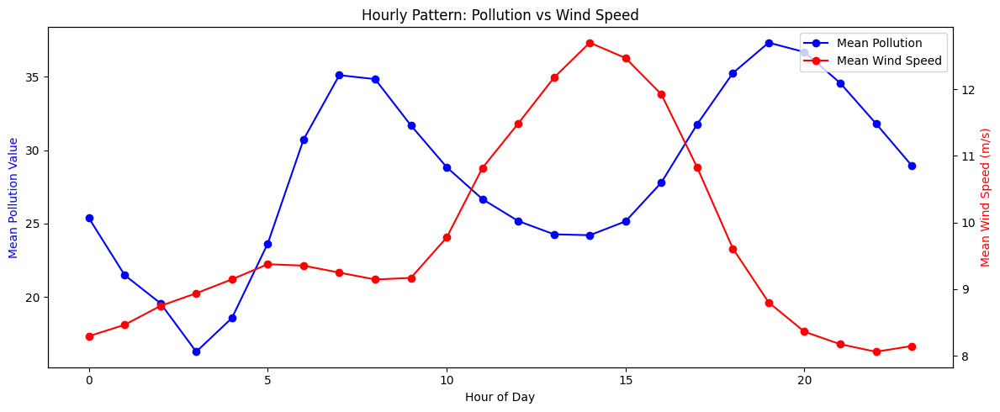

In [ ]:
"""
EDA - Air Quality & Wind Relationship
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 1. BASIC CHECK
# ============================================================
print(f"Shape: {dataframe10.shape}")
print(f"Unique stations: {dataframe10['Air Quality Station Name'].nunique()}")
print(f"Unique pollutants: {dataframe10['Pollutant'].nunique()}")
print(f"Year range: {dataframe10['Year'].min()} - {dataframe10['Year'].max()}")
print(f"\nNulls:")
print(dataframe10.isna().sum())

# ============================================================
# 2. WIND SPEED vs POLLUTION - Scatter
# ============================================================
# Filter valid data
valid = dataframe10[dataframe10["Value"].notna() & dataframe10["wind_speed_10m"].notna()]

top_pollutants = valid["Pollutant"].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    axes[i].scatter(sub["wind_speed_10m"], sub["Value"], alpha=0.05, s=1)
    axes[i].set_title(f"{poll}")
    axes[i].set_xlabel("Wind Speed (m/s)")
    axes[i].set_ylabel("Pollution Value")
    axes[i].set_ylim(0, sub["Value"].quantile(0.99))

plt.suptitle("Wind Speed vs Pollution Level", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 3. WIND SPEED BINS vs POLLUTION - Boxplot
# ============================================================
valid["wind_bin"] = pd.cut(valid["wind_speed_10m"], bins=[0, 3, 6, 10, 15, 50],
                            labels=["0-3", "3-6", "6-10", "10-15", "15+"])

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    sub.boxplot(column="Value", by="wind_bin", ax=axes[i], showfliers=False,
                patch_artist=True, boxprops=dict(facecolor="steelblue", alpha=0.7),
                medianprops=dict(color="red", linewidth=2))
    axes[i].set_title(f"{poll}")
    axes[i].set_xlabel("Wind Speed Bin (m/s)")
    axes[i].set_ylabel("Pollution Value")
    plt.suptitle("")

plt.suptitle("Pollution Level by Wind Speed Range", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 4. WIND DIRECTION vs POLLUTION - Polar plot
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 12), subplot_kw={"projection": "polar"})
axes = axes.flatten()

direction_bins = np.linspace(0, 360, 13)  # 12 sectors of 30 degrees
labels = ["N", "NNE", "ENE", "E", "ESE", "SSE", "S", "SSW", "WSW", "W", "WNW", "NNW"]

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    sub_dir = sub.copy()
    sub_dir["dir_bin"] = pd.cut(sub_dir["wind_direction_10m"], bins=direction_bins, labels=labels)
    mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()

    theta = np.deg2rad(np.linspace(0, 330, 12) + 15)
    axes[i].bar(theta, mean_by_dir.values, width=np.deg2rad(30), color="red", alpha=0.7)
    axes[i].set_theta_zero_location("N")
    axes[i].set_theta_direction(-1)
    axes[i].set_title(f"{poll}", pad=20)

plt.suptitle("Mean Pollution by Wind Direction", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

# ============================================================
# 5. CORRELATION MATRIX
# ============================================================
corr_data = valid[["Value", "wind_speed_10m", "wind_direction_10m", "Hour", "Altitude"]].corr()

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corr_data, annot=True, cmap="coolwarm", center=0, ax=ax)
ax.set_title("Correlation Matrix")
plt.tight_layout()
plt.show()

# ============================================================
# 6. HOURLY PATTERN - Pollution vs Wind
# ============================================================
hourly_avg = valid.groupby("Hour").agg(
    pollution=("Value", "mean"),
    wind_speed=("wind_speed_10m", "mean")
).reset_index()

fig, ax1 = plt.subplots(figsize=(12, 5))
ax2 = ax1.twinx()

ax1.plot(hourly_avg["Hour"], hourly_avg["pollution"], "b-o", label="Mean Pollution")
ax2.plot(hourly_avg["Hour"], hourly_avg["wind_speed"], "r-o", label="Mean Wind Speed")

ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Mean Pollution Value", color="blue")
ax2.set_ylabel("Mean Wind Speed (m/s)", color="red")
ax1.set_title("Hourly Pattern: Pollution vs Wind Speed")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")
plt.tight_layout()
plt.show()

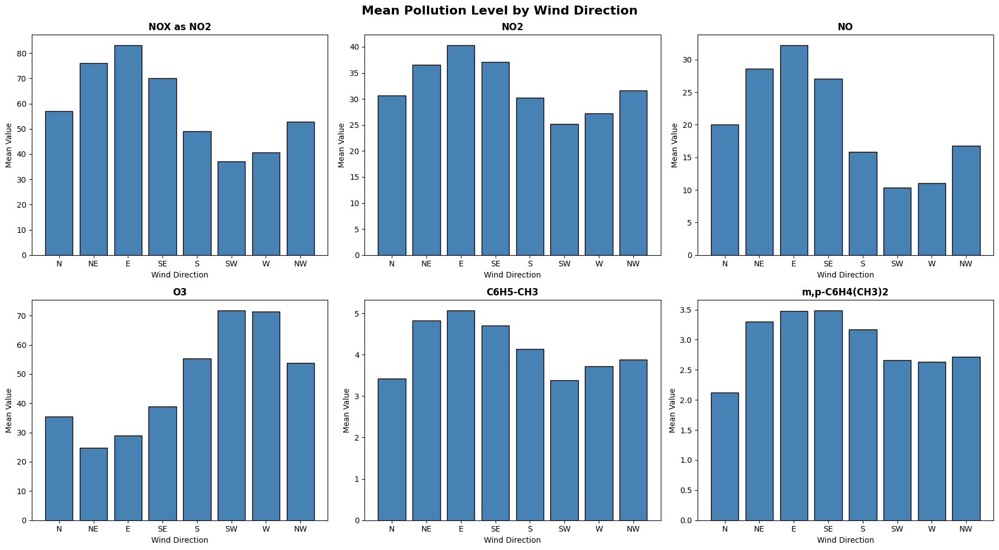

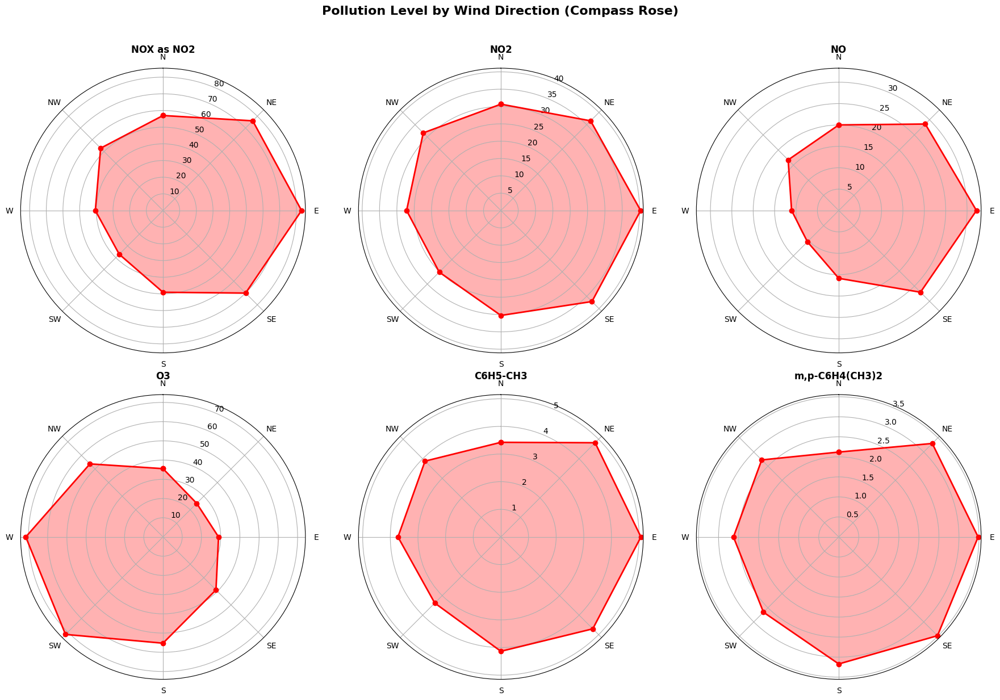


Mean pollution by wind direction:
Pollutant  C6H5-C2H5  C6H5-CH3  C6H6   CO    NO   NO2  NOX as NO2    O3  SO2  m,p-C6H4(CH3)2  o-C6H4-(CH3)2
compass                                                                                                    
N               0.68      3.42  1.09 0.60 20.02 30.68       57.00 35.54 3.33            2.12           1.10
NE              0.89      4.82  1.45 0.73 28.60 36.59       76.09 24.77 3.33            3.30           1.33
E               0.91      5.07  1.51 0.78 32.20 40.31       83.10 28.89 3.35            3.48           1.30
SE              0.94      4.70  1.42 0.76 27.02 37.14       70.05 38.96 3.19            3.49           1.36
S               0.85      4.14  1.25 0.70 15.86 30.27       49.05 55.28 3.36            3.17           1.19
SW              0.78      3.38  1.07 0.59 10.35 25.13       37.12 71.72 3.30            2.66           1.03
W               0.73      3.72  1.04 0.56 11.02 27.20       40.59 71.39 3.32            2.63         

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Group wind direction into 8 compass directions
def get_compass(deg):
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

valid = dataframe10[dataframe10["Value"].notna() & dataframe10["wind_direction_10m"].notna()].copy()
valid["compass"] = valid["wind_direction_10m"].apply(get_compass)

# Order for plotting
compass_order = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]

top_pollutants = valid["Pollutant"].value_counts().head(6).index

# 1. Mean pollution by compass direction per pollutant
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    means = sub.groupby("compass")["Value"].mean().reindex(compass_order)
    axes[i].bar(compass_order, means.values, color="steelblue", edgecolor="black")
    axes[i].set_title(f"{poll}", fontsize=12, fontweight="bold")
    axes[i].set_ylabel("Mean Value")
    axes[i].set_xlabel("Wind Direction")

plt.suptitle("Mean Pollution Level by Wind Direction", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

# 2. Polar version - same data but on compass rose
fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw={"projection": "polar"})
axes = axes.flatten()

angles = np.deg2rad([0, 45, 90, 135, 180, 225, 270, 315])

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    means = sub.groupby("compass")["Value"].mean().reindex(compass_order)

    # Close the circle
    vals = list(means.values) + [means.values[0]]
    theta = list(angles) + [angles[0]]

    axes[i].fill(theta, vals, alpha=0.3, color="red")
    axes[i].plot(theta, vals, "o-", color="red", linewidth=2)
    axes[i].set_theta_zero_location("N")
    axes[i].set_theta_direction(-1)
    axes[i].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
    axes[i].set_title(f"{poll}", pad=20, fontsize=12, fontweight="bold")

plt.suptitle("Pollution Level by Wind Direction (Compass Rose)", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

# 3. Summary table
print("\nMean pollution by wind direction:")
summary = valid.groupby(["compass", "Pollutant"])["Value"].mean().unstack()
summary = summary.reindex(compass_order)
print(summary.round(2).to_string())

In [ ]:
df_factories

,reportingYear,EPRTRAnnexIMainActivity,Longitude,Latitude,Pollutant,Releases,distance_from_rome_km,Sector_Chemical industry,Sector_Energy sector,Sector_Intensive livestock production and aquaculture,Sector_Mineral industry,Sector_Other activities,Sector_Paper and wood production and processing,Sector_Production and processing of metals,Sector_Waste and wastewater management
3,2021,7(a),11.11,45.12,Ammonia (NH3),31920.00,375.25,0,0,1,0,0,0,0,0
6,2021,7(a),10.74,45.33,Ammonia (NH3),27910.60,406.64,0,0,1,0,0,0,0,0
41,2021,1(c),11.77,42.12,Carbon dioxide (CO2),530453000.00,65.17,0,1,0,0,0,0,0,0
74,2022,2(b),12.67,42.57,Nitrogen oxides (NOX),510200.00,75.14,0,0,0,0,0,0,1,0
92,2022,5(d),10.94,44.34,Methane (CH4),133874.20,299.11,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371729,2021,7(a),9.85,45.23,Ammonia (NH3),62410.00,427.56,0,0,1,0,0,0,0,0
371837,2023,7(a),10.63,44.94,Ammonia (NH3),15130.00,370.27,0,0,1,0,0,0,0,0
372039,2023,7(a),12.40,43.14,Methane (CH4),112200.00,137.52,0,0,1,0,0,0,0,0
372096,2021,8(b),7.85,44.95,Hydro-fluorocarbons (HFCS),270.00,505.65,0,0,0,0,0,0,0,0


In [ ]:
df_factories = pd.read_csv("F1_4_Air_Releases_Facilities.csv")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
import pandas as pd

# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

# Get factory locations and drop rows with missing coordinates
factories = (
    df_factories[["Latitude", "Longitude", "EPRTR_SectorName"]]
    .drop_duplicates()
    .dropna(subset=["Latitude", "Longitude"])
    .copy()
)

# Get AQ station locations and drop rows with missing coordinates
aq_stations = (
    dataframe10[["Air Quality Station Name", "Latitude", "Longitude"]]
    .drop_duplicates()
    .dropna(subset=["Latitude", "Longitude"])
    .copy()
)

# Calculate direction from Rome to each factory
def get_bearing(lat1, lon1, lat2, lon2):
    if pd.isna(lat2) or pd.isna(lon2):
        return np.nan
    dlon = np.radians(lon2 - lon1)
    lat1, lat2 = np.radians(lat1), np.radians(lat2)
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

factories["bearing_from_rome"] = factories.apply(
    lambda r: get_bearing(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)

def get_compass(deg):
    if pd.isna(deg):
        return np.nan
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

factories["direction_from_rome"] = factories["bearing_from_rome"].apply(get_compass)

print("Factories by direction from Rome:")
print(
    factories["direction_from_rome"]
    .value_counts()
    .reindex(["N", "NE", "E", "SE", "S", "SW", "W", "NW"], fill_value=0)
)

print("\nFactories by sector and direction:")
print(
    factories.groupby(["direction_from_rome", "EPRTR_SectorName"])
    .size()
    .unstack(fill_value=0)
)



Factories by direction from Rome:
direction_from_rome
N     7788
NE    3005
E      885
SE     156
S       34
SW      45
W     5944
NW    8331
Name: count, dtype: int64

Factories by sector and direction:
EPRTR_SectorName     Animal and vegetable products from the food and beverage sector  \
direction_from_rome                                                                    
E                                                                   12                 
N                                                                  219                 
NE                                                                 100                 
NW                                                                 469                 
S                                                                    2                 
SE                                                                   3                 
SW                                                                   1                 
W   

In [ ]:
df_factories.columns

Index(['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorCode',
       'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'FacilityInspireId',
       'facilityName', 'city', 'Longitude', 'Latitude',
       'addressConfidentialityReason', 'TargetRelease', 'Pollutant',
       'Releases', 'confidentialityReason'],
      dtype='object')

Factory count by direction from Rome:
direction_from_rome
N     121333
NE     43740
E      15231
SE      4222
S        782
SW      1316
W      73572
NW    111204
Name: count, dtype: int64

Total releases (kg) by direction:
direction_from_rome
N    15408266428369.05
NE    4478542769012.61
E     2170745049681.80
SE     626405510701.15
S      103629233004.60
SW     201689797754.89
W     2959609418067.61
NW    9189404962542.38
Name: Releases, dtype: float64


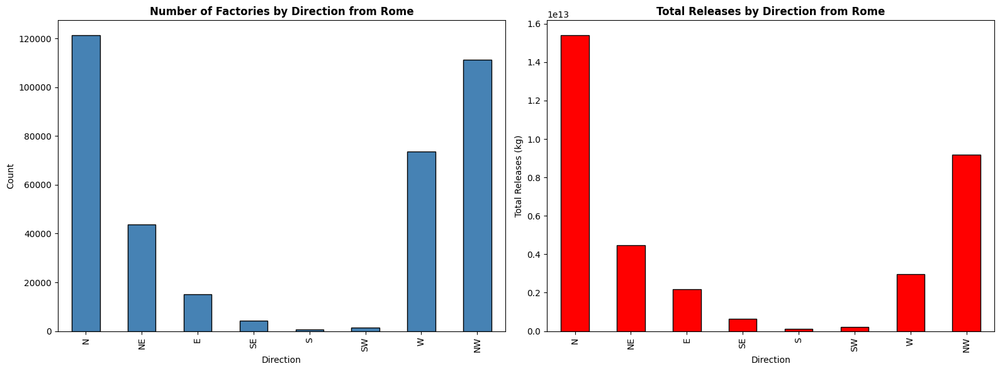

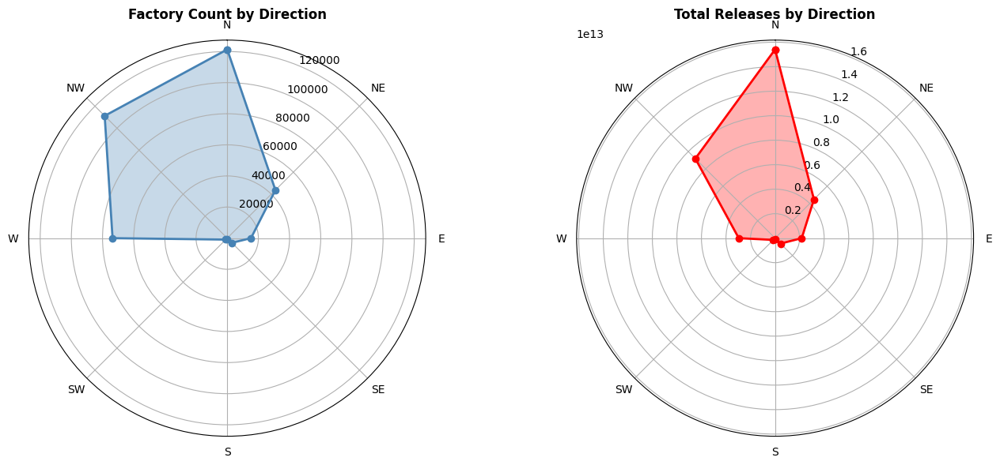


Releases by direction and sector:
EPRTR_SectorName     Animal and vegetable products from the food and beverage sector  Chemical industry     Energy sector  Intensive livestock production and aquaculture  Mineral industry  Other activities  Paper and wood production and processing  Production and processing of metals  Waste and wastewater management
direction_from_rome                                                                                                                                                                                                                                                                                                          
N                                                                     40673791280.00    865965738987.00 10079970211822.00                                  45953387990.00  1289605791260.00    10550951232.00                          1114378035676.00                     1220205310572.00                  718269597063.00
NE         

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import radians, sin, cos, atan2, degrees
# Drop rows with missing coordinates before calculating direction
df_factories = df_factories.dropna(subset=["Latitude", "Longitude"])

# Updated get_compass with NaN safety
def get_compass(deg):
    if pd.isna(deg):
        return "Unknown"
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]
# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

# Calculate bearing (direction) from Rome to each factory
def get_bearing(lat1, lon1, lat2, lon2):
    dlon = np.radians(lon2 - lon1)
    lat1, lat2 = np.radians(lat1), np.radians(lat2)
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def get_compass(deg):
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

df_factories["bearing_from_rome"] = df_factories.apply(
    lambda r: get_bearing(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)
df_factories["direction_from_rome"] = df_factories["bearing_from_rome"].apply(get_compass)

compass_order = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]

# 1. Number of factories by direction
print("Factory count by direction from Rome:")
print(df_factories["direction_from_rome"].value_counts().reindex(compass_order))

# 2. Total releases by direction
releases_by_dir = df_factories.groupby("direction_from_rome")["Releases"].sum().reindex(compass_order)
print("\nTotal releases (kg) by direction:")
print(releases_by_dir)

# 3. Bar chart: factory count by direction
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

df_factories["direction_from_rome"].value_counts().reindex(compass_order).plot(
    kind="bar", ax=axes[0], color="steelblue", edgecolor="black")
axes[0].set_title("Number of Factories by Direction from Rome", fontweight="bold")
axes[0].set_ylabel("Count")
axes[0].set_xlabel("Direction")

releases_by_dir.plot(kind="bar", ax=axes[1], color="red", edgecolor="black")
axes[1].set_title("Total Releases by Direction from Rome", fontweight="bold")
axes[1].set_ylabel("Total Releases (kg)")
axes[1].set_xlabel("Direction")

plt.tight_layout()
plt.show()

# 4. Polar plot: releases by direction
fig, axes = plt.subplots(1, 2, figsize=(14, 6), subplot_kw={"projection": "polar"})
angles = np.deg2rad([0, 45, 90, 135, 180, 225, 270, 315])

# Factory count polar
counts = df_factories["direction_from_rome"].value_counts().reindex(compass_order).values
vals = list(counts) + [counts[0]]
theta = list(angles) + [angles[0]]
axes[0].fill(theta, vals, alpha=0.3, color="steelblue")
axes[0].plot(theta, vals, "o-", color="steelblue", linewidth=2)
axes[0].set_theta_zero_location("N")
axes[0].set_theta_direction(-1)
axes[0].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
axes[0].set_title("Factory Count by Direction", pad=20, fontweight="bold")

# Releases polar
rels = releases_by_dir.values
vals = list(rels) + [rels[0]]
axes[1].fill(theta, vals, alpha=0.3, color="red")
axes[1].plot(theta, vals, "o-", color="red", linewidth=2)
axes[1].set_theta_zero_location("N")
axes[1].set_theta_direction(-1)
axes[1].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
axes[1].set_title("Total Releases by Direction", pad=20, fontweight="bold")

plt.tight_layout()
plt.show()

# 5. Releases by direction AND sector
print("\nReleases by direction and sector:")
sector_dir = df_factories.groupby(["direction_from_rome", "EPRTR_SectorName"])["Releases"].sum().unstack(fill_value=0)
sector_dir = sector_dir.reindex(compass_order)
print(sector_dir.round(0).to_string())

# 6. Compare with pollution compass rose
# If you already have the pollution compass data from earlier:
print("\n\nCOMPARISON:")
print("If factory releases are highest from direction X,")
print("and pollution is highest when wind comes FROM direction X,")
print("that suggests factories in that direction are contributing to Rome's air quality.")

Factories in E + SE: 19453
Total releases E+SE: 2,797,150,560,383 kg

--- Sector breakdown ---
                                                    count              sum  \
EPRTR_SectorName                                                             
Energy sector                                        8290 2212725133450.00   
Mineral industry                                     2735  317028754652.00   
Production and processing of metals                  1265  159968210833.00   
Chemical industry                                     841   80976220677.00   
Paper and wood production and processing              187   16987187469.00   
Waste and wastewater management                      1480    8672302123.00   
Animal and vegetable products from the food and...     67     374471961.00   
Intensive livestock production and aquaculture       4126     312266033.00   
Other activities                                      392     104298984.00   

                                              

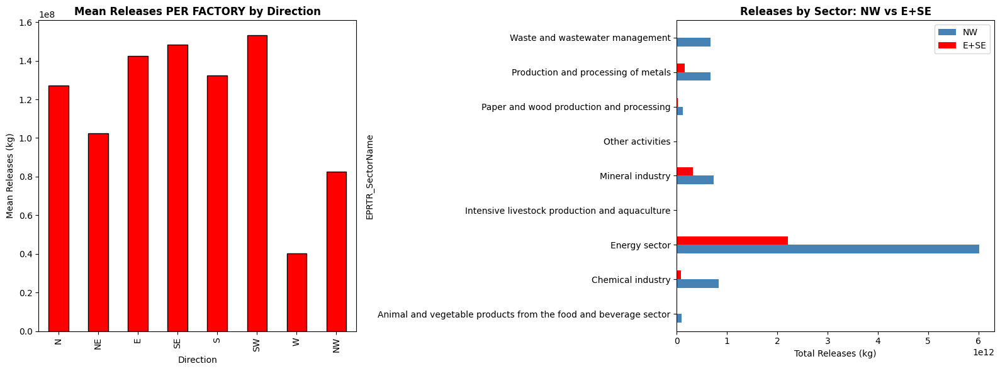

In [ ]:
# Focus on E and SE — where most pollution comes from
high_pollution_dirs = df_factories[df_factories["direction_from_rome"].isin(["E", "SE"])].copy()

print(f"Factories in E + SE: {len(high_pollution_dirs)}")
print(f"Total releases E+SE: {high_pollution_dirs['Releases'].sum():,.0f} kg")
print(f"\n--- Sector breakdown ---")
print(high_pollution_dirs.groupby("EPRTR_SectorName")["Releases"].agg(["count", "sum", "mean"]).sort_values("sum", ascending=False).round(0))

print(f"\n--- Top pollutants ---")
print(high_pollution_dirs.groupby("Pollutant")["Releases"].sum().sort_values(ascending=False).head(10))

print(f"\n--- Top facilities by releases ---")
top_fac = high_pollution_dirs.groupby(["EPRTRAnnexIMainActivity", "Latitude", "Longitude"])["Releases"].sum().sort_values(ascending=False).head(10)
print(top_fac)

# Compare: releases per factory by direction
print(f"\n--- Mean releases per factory by direction ---")
per_factory = df_factories.groupby("direction_from_rome").agg(
    num_factories=("Releases", "count"),
    total_releases=("Releases", "sum"),
    mean_releases=("Releases", "mean")
).reindex(["N", "NE", "E", "SE", "S", "SW", "W", "NW"])
print(per_factory.round(0))

# Plot: compare NW (most factories) vs E/SE (most pollution)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Releases per factory by direction
per_factory["mean_releases"].plot(kind="bar", ax=axes[0], color="red", edgecolor="black")
axes[0].set_title("Mean Releases PER FACTORY by Direction", fontweight="bold")
axes[0].set_ylabel("Mean Releases (kg)")
axes[0].set_xlabel("Direction")

# Sector comparison: NW vs E/SE
nw = df_factories[df_factories["direction_from_rome"] == "NW"]
ese = df_factories[df_factories["direction_from_rome"].isin(["E", "SE"])]

compare = pd.DataFrame({
    "NW": nw.groupby("EPRTR_SectorName")["Releases"].sum(),
    "E+SE": ese.groupby("EPRTR_SectorName")["Releases"].sum()
}).fillna(0)

compare.plot(kind="barh", ax=axes[1], color={"NW": "steelblue", "E+SE": "red"})
axes[1].set_title("Releases by Sector: NW vs E+SE", fontweight="bold")
axes[1].set_xlabel("Total Releases (kg)")

plt.tight_layout()
plt.show()

 Year   Total_Releases  Mean_Releases  Facility_Count
 2007 1627760843736.70   268696078.53            6058
 2008 1568100982866.08   256435156.64            6115
 2009 1563418008934.75   262759329.23            5950
 2010 1661551509784.86   275959393.75            6021
 2011 1624714860550.55   283248755.33            5736
 2012 1640437486563.14   290188835.41            5653
 2013 1579318441949.68   287253263.36            5498
 2014 1482591235086.13   288385768.35            5141
 2015 1437984394057.71   283514273.28            5072
 2016 1402772008209.56   282077620.79            4973
 2017 1366912623013.15   279475081.38            4891
 2018 1394214588295.43   286934469.70            4859
 2019 1158589750713.12   249373601.10            4646
 2020  865924485326.38   237826005.31            3641
 2021  931660714554.12   246666855.85            3777
 2022  968523176725.88   256970861.43            3769
 2023  711588065312.38   230585892.84            3086
 2024  635306655226.19   219

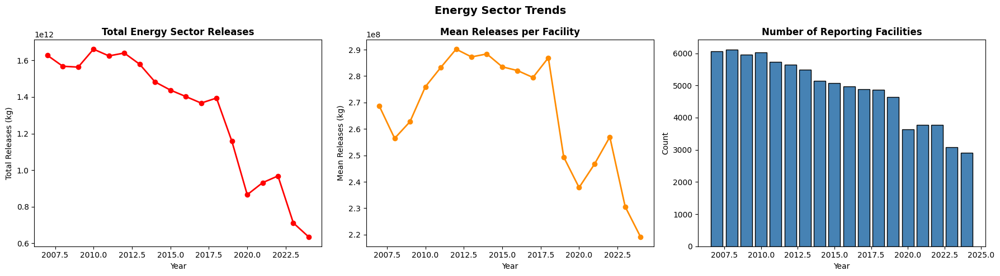

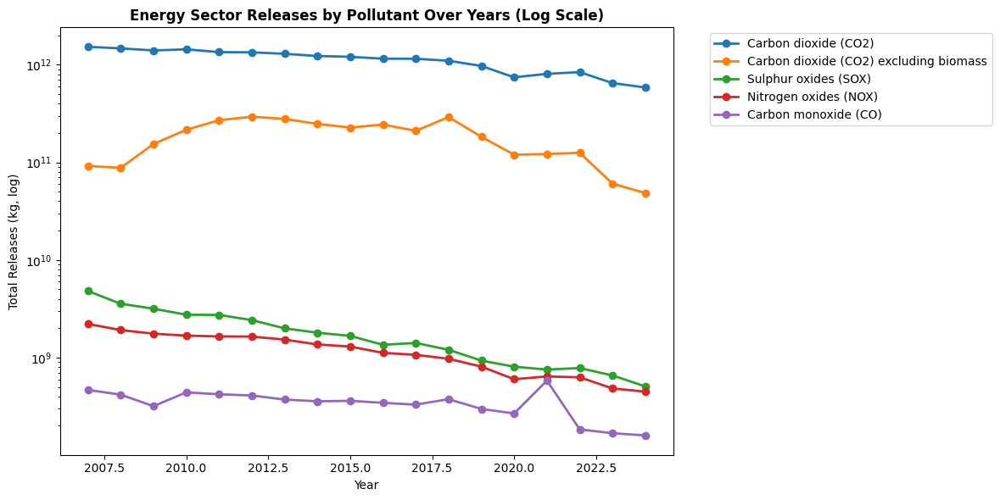

In [ ]:
# Energy sector releases over years
energy = df_factories[df_factories["EPRTR_SectorName"] == "Energy sector"]

# Total and mean releases by year
yearly_energy = energy.groupby("reportingYear")["Releases"].agg(["sum", "mean", "count"]).reset_index()
yearly_energy.columns = ["Year", "Total_Releases", "Mean_Releases", "Facility_Count"]

print(yearly_energy.to_string(index=False))

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(yearly_energy["Year"], yearly_energy["Total_Releases"], marker="o", color="red", linewidth=2)
axes[0].set_title("Total Energy Sector Releases", fontweight="bold")
axes[0].set_ylabel("Total Releases (kg)")
axes[0].set_xlabel("Year")

axes[1].plot(yearly_energy["Year"], yearly_energy["Mean_Releases"], marker="o", color="darkorange", linewidth=2)
axes[1].set_title("Mean Releases per Facility", fontweight="bold")
axes[1].set_ylabel("Mean Releases (kg)")
axes[1].set_xlabel("Year")

axes[2].bar(yearly_energy["Year"], yearly_energy["Facility_Count"], color="steelblue", edgecolor="black")
axes[2].set_title("Number of Reporting Facilities", fontweight="bold")
axes[2].set_ylabel("Count")
axes[2].set_xlabel("Year")

plt.suptitle("Energy Sector Trends", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# By pollutant for energy sector
fig, ax = plt.subplots(figsize=(12, 6))
top_polls = energy.groupby("Pollutant")["Releases"].sum().sort_values(ascending=False).head(5).index

for poll in top_polls:
    sub = energy[energy["Pollutant"] == poll].groupby("reportingYear")["Releases"].sum()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)

ax.set_yscale("log")
ax.set_title("Energy Sector Releases by Pollutant Over Years (Log Scale)", fontweight="bold")
ax.set_xlabel("Year")
ax.set_ylabel("Total Releases (kg, log)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

---
14. Prediction Modelling — NO2

14.1 Build the prediction dataset

We merge daily NO2, energy production, and wind data into a single modelling-ready dataset.

**Features include:**
- Energy production by source (Thermal, Hydro, Photovoltaic, Wind, Geothermal)
- Wind speed and direction (encoded as sin/cos for circularity)
- Temporal features (month, season, day of week, weekend flag)
- Lag features (NO2 from 1 day and 7 days ago)

**Split:** Train on 2021–2023, test on 2024.

In [ ]:
import pandas as pd
import numpy as np

# ============================================================
# LOAD BASE DATASETS
# ============================================================

# 1. Air quality hourly data (with station info + wind)
#    This is the big merged dataset from the parquet + station metadata
df_merged = pd.read_csv("df_merged_stats_parquet_pre.csv")
df_merged["Start"] = pd.to_datetime(df_merged["Start"], format="mixed")

# 2. Wind data
wind_df = pd.read_csv("wind_data_lazio.csv")
wind_df["date"] = pd.to_datetime(wind_df["date"])
wind_df["date"] = wind_df["date"].dt.tz_localize(None)

# 3. Energy production — from Petra's notebook output
#    If you have energy_plt.csv already saved, load it.
#    Otherwise, this must be generated from Petra's notebook first.
energy_plt = pd.read_csv("energy_plt.csv")
energy_plt["Day"] = pd.to_datetime(energy_plt["Day"])

print(f"Air quality:  {df_merged.shape}")
print(f"Wind:         {wind_df.shape}")
print(f"Energy:       {energy_plt.shape}")

Air quality:  (1910976, 16)
Wind:         (613680, 6)
Energy:       (1826, 9)


In [ ]:
# ============================================================
# STEP 1: Daily mean NO2 across all stations
# ============================================================

# Filter to NO2 only and compute daily mean across all stations
df_merged["Date"] = df_merged["Start"].dt.floor("D")

daily_no2 = (
    df_merged[df_merged["Pollutant"] == "NO2"]
    .groupby("Date")["Value"]
    .mean()
    .reset_index()
    .rename(columns={"Value": "NO2"})
)

daily_no2["Date"] = pd.to_datetime(daily_no2["Date"])

print(f"Daily NO2 records: {len(daily_no2):,}")
print(f"Date range: {daily_no2['Date'].min().date()} to {daily_no2['Date'].max().date()}")
print(f"NO2 mean: {daily_no2['NO2'].mean():.2f} µg/m³")
daily_no2.head()

Daily NO2 records: 1,461
Date range: 2021-01-01 to 2024-12-31
NO2 mean: 32.23 µg/m³


,Date,NO2
0,2021-01-01,21.51
1,2021-01-02,22.80
2,2021-01-03,23.69
3,2021-01-04,45.07
4,2021-01-05,41.99


In [ ]:
# ============================================================
# STEP 2: Daily mean wind speed and direction across all stations
# ============================================================

# Filter to 2021-2024
wind_filtered = wind_df[wind_df["date"].dt.year.between(2021, 2024)].copy()

daily_wind = (
    wind_filtered
    .groupby(wind_filtered["date"].dt.floor("D"))
    .agg(
        wind_speed=("wind_speed_10m", "mean"),
        wind_dir=("wind_direction_10m", "mean")
    )
    .reset_index()
    .rename(columns={"date": "Date"})
)

print(f"Daily wind records: {len(daily_wind):,}")
print(f"Date range: {daily_wind['Date'].min().date()} to {daily_wind['Date'].max().date()}")
daily_wind.head()

Daily wind records: 1,461
Date range: 2021-01-01 to 2024-12-31


,Date,wind_speed,wind_dir
0,2021-01-01,16.80,130.11
1,2021-01-02,19.36,151.77
2,2021-01-03,13.36,138.96
3,2021-01-04,6.53,126.82
4,2021-01-05,12.50,152.86


In [ ]:
# ============================================================
# STEP 3: Merge NO2 + Energy + Wind on date
# ============================================================

# Drop 'Unnamed: 0' from energy_plt if it exists
if "Unnamed: 0" in energy_plt.columns:
    energy_plt = energy_plt.drop(columns=["Unnamed: 0"])

# Compute Total if not present
if "Total" not in energy_plt.columns:
    source_cols = ["Geothermal", "Hydro", "Photovoltaic", "Self-consumption", "Thermal", "Wind"]
    available = [c for c in source_cols if c in energy_plt.columns]
    energy_plt["Total"] = energy_plt[available].sum(axis=1)

model_df = (
    daily_no2
    .merge(
        energy_plt[["Day", "Thermal", "Hydro", "Photovoltaic",
                     "Wind", "Geothermal", "Self-consumption", "Total"]],
        left_on="Date", right_on="Day", how="inner"
    )
    .drop(columns="Day")
    .merge(daily_wind, on="Date", how="inner")
)

print(f"Merged dataset: {model_df.shape}")
print(f"Date range: {model_df['Date'].min().date()} to {model_df['Date'].max().date()}")
print(f"Columns: {model_df.columns.tolist()}")
model_df.head()

Merged dataset: (1461, 11)
Date range: 2021-01-01 to 2024-12-31
Columns: ['Date', 'NO2', 'Thermal', 'Hydro', 'Photovoltaic', 'Wind', 'Geothermal', 'Self-consumption', 'Total', 'wind_speed', 'wind_dir']


,Date,NO2,Thermal,Hydro,Photovoltaic,Wind,Geothermal,Self-consumption,Total,wind_speed,wind_dir
0,2021-01-01,21.51,330.61,89.63,16.05,72.98,14.51,50.38,574.16,16.80,130.11
1,2021-01-02,22.80,321.78,104.73,12.13,108.78,14.85,50.15,612.41,19.36,151.77
2,2021-01-03,23.69,324.12,95.89,17.11,77.58,14.88,52.49,582.07,13.36,138.96
3,2021-01-04,45.07,467.70,137.40,20.19,43.23,14.88,71.89,755.29,6.53,126.82
4,2021-01-05,41.99,496.41,137.50,14.65,79.59,14.87,72.80,815.82,12.50,152.86


Feature engineering

We now add:
- **Temporal features:** month, day of week, weekend flag, season
- **Wind direction encoding:** sin/cos components (so 359° and 1° are treated as close)
- **Energy mix shares:** thermal and renewable as percentage of total production
- **Lag features:** NO2 from yesterday (lag-1) and one week ago (lag-7)

In [ ]:
# ============================================================
# STEP 4: Feature engineering
# ============================================================

# --- Temporal features ---
model_df["month"] = model_df["Date"].dt.month
model_df["day_of_week"] = model_df["Date"].dt.dayofweek   # 0=Mon, 6=Sun
model_df["is_weekend"] = (model_df["day_of_week"] >= 5).astype(int)

# Season: 1=Winter(Dec-Feb), 2=Spring(Mar-May), 3=Summer(Jun-Aug), 4=Autumn(Sep-Nov)
model_df["season"] = model_df["month"].map(
    {12:1, 1:1, 2:1, 3:2, 4:2, 5:2, 6:3, 7:3, 8:3, 9:4, 10:4, 11:4}
)

# --- Wind direction: sin/cos encoding ---
# This preserves circularity: 359° and 1° are close in sin/cos space
model_df["wind_dir_sin"] = np.sin(np.radians(model_df["wind_dir"]))
model_df["wind_dir_cos"] = np.cos(np.radians(model_df["wind_dir"]))

# --- Energy mix shares (%) ---
model_df["thermal_share"] = model_df["Thermal"] / model_df["Total"] * 100
model_df["renewable_share"] = (
    model_df["Hydro"] + model_df["Photovoltaic"] +
    model_df["Wind"] + model_df["Geothermal"]
) / model_df["Total"] * 100

# --- Lag features ---
model_df = model_df.sort_values("Date").reset_index(drop=True)
model_df["NO2_lag1"] = model_df["NO2"].shift(1)    # yesterday's NO2
model_df["NO2_lag7"] = model_df["NO2"].shift(7)    # one week ago NO2

print(f"Shape after feature engineering: {model_df.shape}")
print(f"New columns: month, day_of_week, is_weekend, season, wind_dir_sin, wind_dir_cos, thermal_share, renewable_share, NO2_lag1, NO2_lag7")
model_df.head(10)

Shape after feature engineering: (1461, 21)
New columns: month, day_of_week, is_weekend, season, wind_dir_sin, wind_dir_cos, thermal_share, renewable_share, NO2_lag1, NO2_lag7


,Date,NO2,Thermal,Hydro,Photovoltaic,Wind,Geothermal,Self-consumption,Total,wind_speed,...,month,day_of_week,is_weekend,season,wind_dir_sin,wind_dir_cos,thermal_share,renewable_share,NO2_lag1,NO2_lag7
0,2021-01-01,21.51,330.61,89.63,16.05,72.98,14.51,50.38,574.16,16.80,...,1,4,0,1,0.76,-0.64,57.58,33.64,NaN,NaN
1,2021-01-02,22.80,321.78,104.73,12.13,108.78,14.85,50.15,612.41,19.36,...,1,5,1,1,0.47,-0.88,52.54,39.27,21.51,NaN
2,2021-01-03,23.69,324.12,95.89,17.11,77.58,14.88,52.49,582.07,13.36,...,1,6,1,1,0.66,-0.75,55.68,35.30,22.80,NaN
3,2021-01-04,45.07,467.70,137.40,20.19,43.23,14.88,71.89,755.29,6.53,...,1,0,0,1,0.80,-0.60,61.92,28.56,23.69,NaN
4,2021-01-05,41.99,496.41,137.50,14.65,79.59,14.87,72.80,815.82,12.50,...,1,1,0,1,0.46,-0.89,60.85,30.23,45.07,NaN
5,2021-01-06,42.16,453.59,115.39,15.58,74.25,14.88,67.89,741.58,7.19,...,1,2,0,1,0.36,-0.93,61.17,29.68,41.99,NaN
6,2021-01-07,51.94,582.35,153.27,12.75,31.89,14.88,85.87,881.01,7.20,...,1,3,0,1,0.80,0.59,66.10,24.15,42.16,NaN
7,2021-01-08,43.46,580.36,143.29,20.69,48.35,14.88,91.34,898.91,9.28,...,1,4,0,1,0.85,0.53,64.56,25.28,51.94,21.51
8,2021-01-09,34.82,459.17,110.42,8.77,61.92,14.88,67.33,722.49,13.95,...,1,5,1,1,0.61,0.79,63.55,27.13,43.46,22.80
9,2021-01-10,21.75,436.17,89.58,7.93,52.23,14.89,65.09,665.89,16.46,...,1,6,1,1,1.00,-0.00,65.50,24.72,34.82,23.69


In [ ]:
# ============================================================
# STEP 5: Drop NaN rows and validate
# ============================================================

before = len(model_df)
model_df = model_df.dropna(subset=["NO2", "NO2_lag1", "NO2_lag7"])
print(f"Dropped {before - len(model_df)} rows (mostly first 7 days lost to lag creation)")
print(f"Final dataset: {model_df.shape}")
print(f"Date range: {model_df['Date'].min().date()} to {model_df['Date'].max().date()}")

nulls = model_df.isna().sum()
if nulls.sum() == 0:
    print("\nNo nulls remaining — dataset is clean.")
else:
    print(f"\nRemaining nulls:\n{nulls[nulls > 0]}")

Dropped 7 rows (mostly first 7 days lost to lag creation)
Final dataset: (1454, 21)
Date range: 2021-01-08 to 2024-12-31

No nulls remaining — dataset is clean.


Data dictionary

| Feature | Description | Source |
|---------|-------------|--------|
| `NO2` | **TARGET** — daily mean NO2 (µg/m³) | Air quality stations |
| `Thermal` | Daily thermal energy production (MW) | ENTSO-E |
| `Hydro` | Daily hydro energy production (MW) | ENTSO-E |
| `Photovoltaic` | Daily solar energy production (MW) | ENTSO-E |
| `Wind` | Daily wind energy production (MW) | ENTSO-E |
| `Geothermal` | Daily geothermal energy production (MW) | ENTSO-E |
| `Self-consumption` | Daily self-consumed energy (MW) | ENTSO-E |
| `Total` | Total daily energy production (MW) | ENTSO-E |
| `wind_speed` | Mean daily wind speed at 10m (m/s) | Open-Meteo |
| `wind_dir` | Mean daily wind direction (degrees) | Open-Meteo |
| `wind_dir_sin` | Sine of wind direction (circular encoding) | Engineered |
| `wind_dir_cos` | Cosine of wind direction (circular encoding) | Engineered |
| `month` | Month (1–12) | Engineered |
| `day_of_week` | Day of week (0=Mon, 6=Sun) | Engineered |
| `is_weekend` | Weekend flag (0/1) | Engineered |
| `season` | Season (1=Win, 2=Spr, 3=Sum, 4=Aut) | Engineered |
| `thermal_share` | Thermal as % of total production | Engineered |
| `renewable_share` | Renewables as % of total production | Engineered |
| `NO2_lag1` | NO2 value from previous day | Engineered |
| `NO2_lag7` | NO2 value from 7 days ago | Engineered |

In [ ]:
# ============================================================
# STEP 6: Define features, target, and split
# ============================================================

feature_cols = [
    # Energy production
    "Thermal", "Hydro", "Photovoltaic", "Wind", "Geothermal",
    "Self-consumption", "Total",
    # Energy shares
    "thermal_share", "renewable_share",
    # Wind conditions
    "wind_speed", "wind_dir_sin", "wind_dir_cos",
    # Temporal
    "month", "day_of_week", "is_weekend", "season",
    # Lag features
    "NO2_lag1", "NO2_lag7"
]

target = "NO2"

# Temporal split
train = model_df[model_df["Date"].dt.year <= 2023]
test  = model_df[model_df["Date"].dt.year == 2024]

X_train = train[feature_cols]
y_train = train[target]
X_test  = test[feature_cols]
y_test  = test[target]

print(f"Training set: {X_train.shape[0]:,} days  ({train['Date'].min().date()} → {train['Date'].max().date()})")
print(f"Test set:     {X_test.shape[0]:,} days  ({test['Date'].min().date()} → {test['Date'].max().date()})")
print(f"\nFeatures ({len(feature_cols)}): {feature_cols}")
print(f"Target: {target}")

Training set: 1,088 days  (2021-01-08 → 2023-12-31)
Test set:     366 days  (2024-01-01 → 2024-12-31)

Features (18): ['Thermal', 'Hydro', 'Photovoltaic', 'Wind', 'Geothermal', 'Self-consumption', 'Total', 'thermal_share', 'renewable_share', 'wind_speed', 'wind_dir_sin', 'wind_dir_cos', 'month', 'day_of_week', 'is_weekend', 'season', 'NO2_lag1', 'NO2_lag7']
Target: NO2


In [ ]:
# ============================================================
# STEP 7: Save and summarise
# ============================================================

model_df.to_csv("NO2_prediction_dataset.csv", index=False)
print("Saved: NO2_prediction_dataset.csv")

print(f"\n{'='*55}")
print("  PREDICTION DATASET SUMMARY")
print(f"{'='*55}")
print(f"  Total rows:       {len(model_df):,}")
print(f"  Training rows:    {len(train):,}  (2021–2023)")
print(f"  Test rows:        {len(test):,}  (2024)")
print(f"  Features:         {len(feature_cols)}")
print(f"  Target:           NO2 (µg/m³)")
print(f"  NO2 train mean:   {y_train.mean():.2f}")
print(f"  NO2 test mean:    {y_test.mean():.2f}")
print(f"  NO2 train std:    {y_train.std():.2f}")
print(f"  NO2 test std:     {y_test.std():.2f}")

# Feature correlations with NO2
print(f"\n{'='*55}")
print("  FEATURE CORRELATIONS WITH NO2")
print(f"{'='*55}")
corrs = (
    model_df[feature_cols + [target]]
    .corr()[target]
    .drop(target)
    .sort_values(ascending=False)
)
for feat, val in corrs.items():
    bar = "█" * int(abs(val) * 30)
    sign = "+" if val > 0 else "−"
    print(f"  {feat:22s} {sign}{abs(val):.3f}  {bar}")

print(f"\n{'='*55}")
print("  Dataset ready for modelling.")
print(f"{'='*55}")

Saved: NO2_prediction_dataset.csv

  PREDICTION DATASET SUMMARY
  Total rows:       1,454
  Training rows:    1,088  (2021–2023)
  Test rows:        366  (2024)
  Features:         18
  Target:           NO2 (µg/m³)
  NO2 train mean:   32.65
  NO2 test mean:    30.92
  NO2 train std:    10.51
  NO2 test std:     9.26

  FEATURE CORRELATIONS WITH NO2
  NO2_lag1               +0.743  ██████████████████████
  NO2_lag7               +0.538  ████████████████
  thermal_share          +0.513  ███████████████
  wind_dir_sin           +0.440  █████████████
  Thermal                +0.419  ████████████
  wind_dir_cos           +0.315  █████████
  Geothermal             +0.219  ██████
  Total                  +0.172  █████
  Self-consumption       +0.062  █
  Wind                   −0.082  ██
  month                  −0.099  ██
  day_of_week            −0.179  █████
  is_weekend             −0.233  ██████
  Hydro                  −0.313  █████████
  wind_speed             −0.320  █████████
  seas

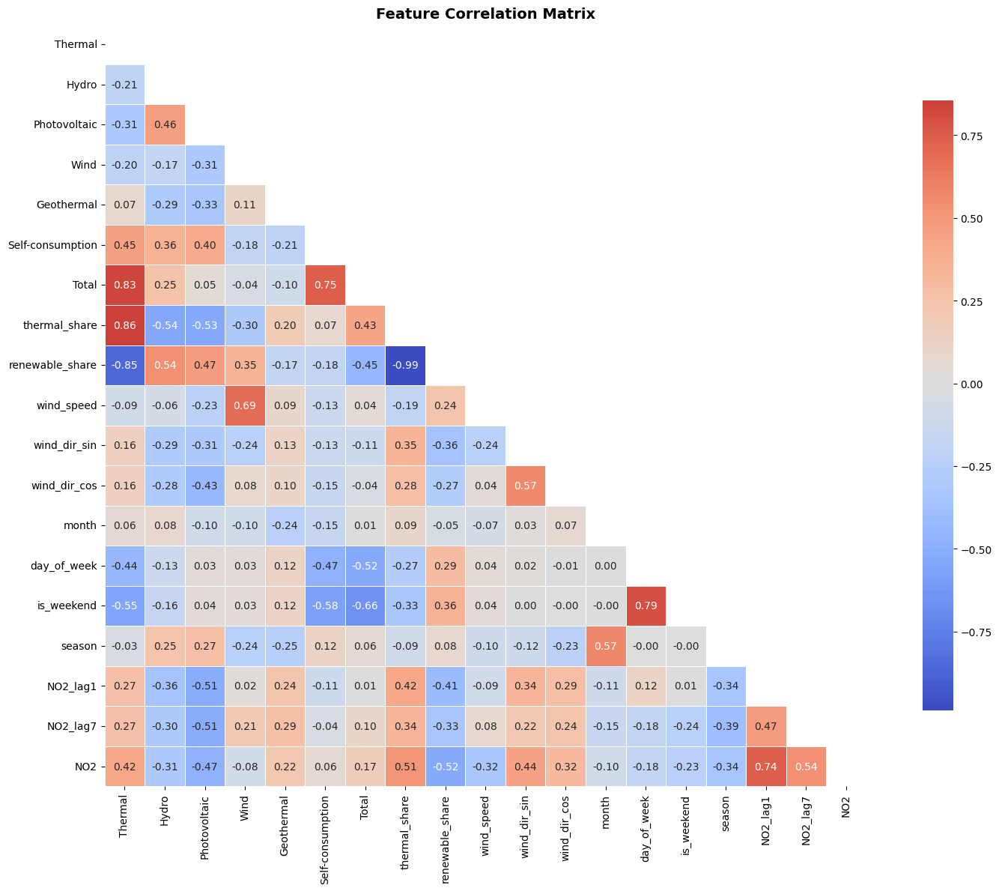


Highly correlated feature pairs (|r| > 0.7):
  Thermal                ↔ Total                   r = +0.827
  Thermal                ↔ thermal_share           r = +0.855
  Thermal                ↔ renewable_share         r = -0.854
  Self-consumption       ↔ Total                   r = +0.747
  thermal_share          ↔ renewable_share         r = -0.988
  day_of_week            ↔ is_weekend              r = +0.791


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 1. CORRELATION MATRIX
# ============================================================

corr = model_df[feature_cols + [target]].corr()

fig, ax = plt.subplots(figsize=(16, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="coolwarm",
            center=0, square=True, linewidths=0.5, ax=ax,
            cbar_kws={"shrink": 0.8})
ax.set_title("Feature Correlation Matrix", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Flag highly correlated feature pairs (|r| > 0.7)
print("\nHighly correlated feature pairs (|r| > 0.7):")
for i in range(len(feature_cols)):
    for j in range(i+1, len(feature_cols)):
        r = corr.iloc[i, j]
        if abs(r) > 0.7:
            print(f"  {feature_cols[i]:22s} ↔ {feature_cols[j]:22s}  r = {r:+.3f}")

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ============================================================
# 2. VARIANCE INFLATION FACTOR (VIF)
# ============================================================
# VIF > 10 = severe multicollinearity, VIF > 5 = moderate concern

vif_data = X_train.copy()
vif_results = pd.DataFrame({
    "Feature": feature_cols,
    "VIF": [variance_inflation_factor(vif_data.values, i)
            for i in range(len(feature_cols))]
}).sort_values("VIF", ascending=False)

print("Variance Inflation Factors:")
print("=" * 45)
for _, row in vif_results.iterrows():
    flag = " ⚠️ HIGH" if row["VIF"] > 10 else (" ⚡ moderate" if row["VIF"] > 5 else "")
    print(f"  {row['Feature']:22s}  VIF = {row['VIF']:8.2f}{flag}")

print(f"\nFeatures with VIF > 10: {(vif_results['VIF'] > 10).sum()}")
print(f"Features with VIF > 5:  {(vif_results['VIF'] > 5).sum()}")

/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Variance Inflation Factors:
  Thermal                 VIF =      inf ⚠️ HIGH
  Hydro                   VIF =      inf ⚠️ HIGH
  Photovoltaic            VIF =      inf ⚠️ HIGH
  Wind                    VIF =      inf ⚠️ HIGH
  Geothermal              VIF =      inf ⚠️ HIGH
  Self-consumption        VIF =      inf ⚠️ HIGH
  Total                   VIF =      inf ⚠️ HIGH
  thermal_share           VIF =   755.18 ⚠️ HIGH
  renewable_share         VIF =   470.62 ⚠️ HIGH
  NO2_lag1                VIF =    21.00 ⚠️ HIGH
  NO2_lag7                VIF =    19.14 ⚠️ HIGH
  wind_speed              VIF =    15.88 ⚠️ HIGH
  season                  VIF =    13.09 ⚠️ HIGH
  month                   VIF =     9.57 ⚡ moderate
  day_of_week             VIF =     9.44 ⚡ moderate
  is_weekend              VIF =     5.31 ⚡ moderate
  wind_dir_cos            VIF =     5.01 ⚡ moderate
  wind_dir_sin            VIF =     3.85

Features with VIF > 10: 13
Features with VIF > 5:  17


Addressing multicollinearity

Based on the VIF results, we remove features with severe multicollinearity (VIF > 10). This typically includes `Total` (which is the sum of all energy sources — perfectly collinear) and one of each highly correlated pair. We keep the features that have stronger individual correlation with NO2.

In [ ]:
# ============================================================
# 3. REMOVE HIGH-VIF FEATURES
# ============================================================

# Total = sum of all energy sources → always collinear
# thermal_share and renewable_share are derived from the same components
# We iteratively remove the highest VIF feature until all VIF < 10

cols_to_use = feature_cols.copy()

while True:
    vif_check = pd.DataFrame({
        "Feature": cols_to_use,
        "VIF": [variance_inflation_factor(
            X_train[cols_to_use].values, i
        ) for i in range(len(cols_to_use))]
    }).sort_values("VIF", ascending=False)

    worst = vif_check.iloc[0]
    if worst["VIF"] <= 10:
        break
    print(f"Dropping '{worst['Feature']}' (VIF = {worst['VIF']:.1f})")
    cols_to_use.remove(worst["Feature"])

print(f"\n{'='*45}")
print(f"Remaining features ({len(cols_to_use)}):")
print(f"{'='*45}")
for _, row in vif_check.iterrows():
    print(f"  {row['Feature']:22s}  VIF = {row['VIF']:.2f}")

# Update train/test sets
X_train_clean = X_train[cols_to_use]
X_test_clean = X_test[cols_to_use]

print(f"\nDropped {len(feature_cols) - len(cols_to_use)} features due to multicollinearity")
print(f"Keeping {len(cols_to_use)} features for modelling")

/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero

Dropping 'Thermal' (VIF = inf)
Dropping 'Geothermal' (VIF = 1353.5)
Dropping 'Total' (VIF = 732.7)
Dropping 'renewable_share' (VIF = 94.7)
Dropping 'Self-consumption' (VIF = 76.2)
Dropping 'thermal_share' (VIF = 40.9)
Dropping 'NO2_lag1' (VIF = 14.8)
Dropping 'wind_speed' (VIF = 13.5)
Dropping 'season' (VIF = 11.5)

Remaining features (9):
  NO2_lag7                VIF = 8.78
  Hydro                   VIF = 8.68
  day_of_week             VIF = 8.52
  Photovoltaic            VIF = 7.31
  wind_dir_cos            VIF = 4.57
  month                   VIF = 4.51
  is_weekend              VIF = 3.99
  Wind                    VIF = 3.46
  wind_dir_sin            VIF = 3.16

Dropped 9 features due to multicollinearity
Keeping 9 features for modelling


In [ ]:
import statsmodels.api as sm

# ============================================================
# 4. OLS REGRESSION — FULL STATISTICAL OUTPUT
# ============================================================

# Add constant (intercept)
X_ols = sm.add_constant(X_train_clean)

# Fit OLS model
ols_model = sm.OLS(y_train, X_ols).fit()

# Print full summary
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.484
Method:                 Least Squares   F-statistic:                     114.3
Date:                Wed, 15 Apr 2026   Prob (F-statistic):          3.68e-150
Time:                        23:23:28   Log-Likelihood:                -3738.5
No. Observations:                1088   AIC:                             7497.
Df Residuals:                    1078   BIC:                             7547.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           35.4913      1.978     17.947   

In [ ]:
# ============================================================
# 5. FEATURE SIGNIFICANCE SUMMARY
# ============================================================

significance = pd.DataFrame({
    "Coefficient": ols_model.params,
    "Std Error": ols_model.bse,
    "t-value": ols_model.tvalues,
    "p-value": ols_model.pvalues,
    "CI Lower": ols_model.conf_int()[0],
    "CI Upper": ols_model.conf_int()[1],
}).round(4)

# Flag significance levels
significance["Significance"] = significance["p-value"].apply(
    lambda p: "***" if p < 0.001 else ("**" if p < 0.01 else ("*" if p < 0.05 else "ns"))
)

print("Feature Significance (OLS Regression)")
print("=" * 80)
print(significance.to_string())
print()
print("Significance codes: *** p<0.001  ** p<0.01  * p<0.05  ns = not significant")
print(f"\nSignificant features (p<0.05): {(significance['p-value'] < 0.05).sum() - 1}")  # -1 for constant
print(f"Not significant (p≥0.05):     {(significance['p-value'] >= 0.05).sum()}")

Feature Significance (OLS Regression)
              Coefficient  Std Error  t-value  p-value  CI Lower  CI Upper Significance
const               35.49       1.98    17.95     0.00     31.61     39.37          ***
Hydro               -0.02       0.01    -3.70     0.00     -0.04     -0.01          ***
Photovoltaic        -0.13       0.01   -10.66     0.00     -0.15     -0.10          ***
Wind                -0.05       0.01    -7.95     0.00     -0.07     -0.04          ***
wind_dir_sin         4.59       0.67     6.85     0.00      3.27      5.90          ***
wind_dir_cos        -0.52       0.66    -0.78     0.44     -1.82      0.79           ns
month               -0.18       0.07    -2.64     0.01     -0.32     -0.05           **
day_of_week          0.08       0.19     0.43     0.67     -0.29      0.45           ns
is_weekend          -4.24       0.86    -4.95     0.00     -5.92     -2.56          ***
NO2_lag7             0.31       0.03    11.16     0.00      0.25      0.36        

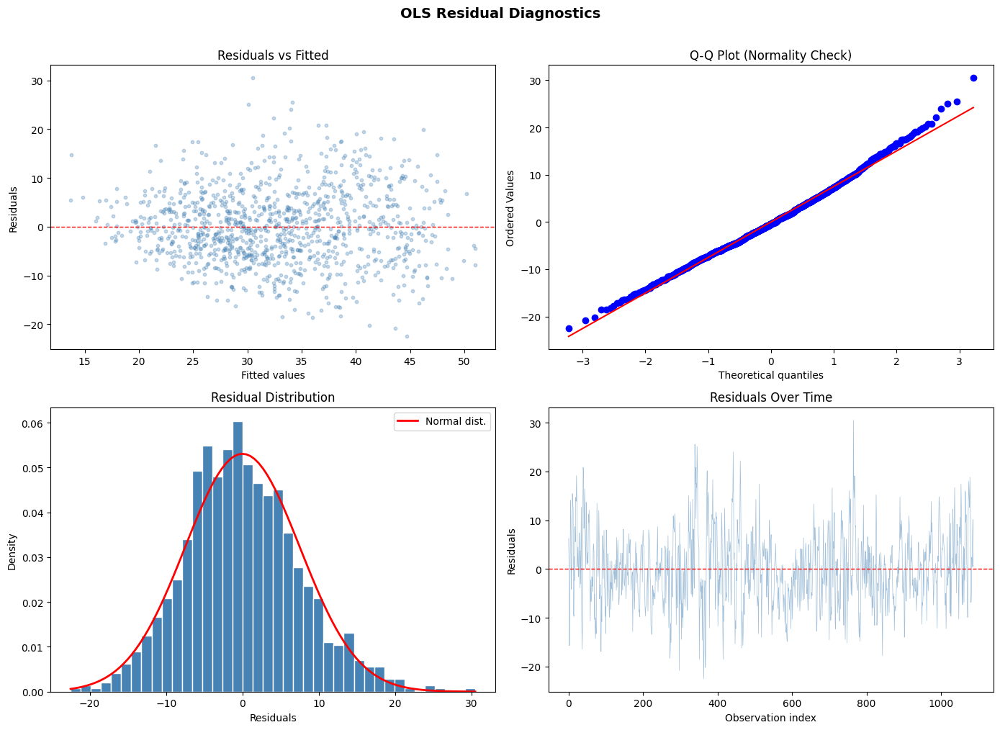

Residual Diagnostic Tests:
  Shapiro-Wilk (normality):  W=0.9973, p=0.5781  ✓ Normal
  Durbin-Watson (autocorr):  DW=0.8288  ✗ Autocorrelation detected
  Breusch-Pagan (heterosc):  χ²=100.7826, p=0.0000  ✗ Heteroscedastic


In [ ]:
from scipy import stats

# ============================================================
# 6. RESIDUAL DIAGNOSTICS
# ============================================================

residuals = ols_model.resid
fitted = ols_model.fittedvalues

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 6a. Residuals vs Fitted — check homoscedasticity
axes[0, 0].scatter(fitted, residuals, alpha=0.3, s=10, color="steelblue")
axes[0, 0].axhline(y=0, color="red", linestyle="--", linewidth=1)
axes[0, 0].set_xlabel("Fitted values")
axes[0, 0].set_ylabel("Residuals")
axes[0, 0].set_title("Residuals vs Fitted")

# 6b. Q-Q Plot — check normality of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("Q-Q Plot (Normality Check)")

# 6c. Histogram of residuals
axes[1, 0].hist(residuals, bins=40, color="steelblue", edgecolor="white", density=True)
x_range = np.linspace(residuals.min(), residuals.max(), 100)
axes[1, 0].plot(x_range, stats.norm.pdf(x_range, residuals.mean(), residuals.std()),
               color="red", linewidth=2, label="Normal dist.")
axes[1, 0].set_xlabel("Residuals")
axes[1, 0].set_ylabel("Density")
axes[1, 0].set_title("Residual Distribution")
axes[1, 0].legend()

# 6d. Residuals over time — check autocorrelation
axes[1, 1].plot(range(len(residuals)), residuals, alpha=0.5, linewidth=0.5, color="steelblue")
axes[1, 1].axhline(y=0, color="red", linestyle="--", linewidth=1)
axes[1, 1].set_xlabel("Observation index")
axes[1, 1].set_ylabel("Residuals")
axes[1, 1].set_title("Residuals Over Time")

plt.suptitle("OLS Residual Diagnostics", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

# Statistical tests
print("Residual Diagnostic Tests:")
print("=" * 50)

# Shapiro-Wilk normality test (on a sample if dataset is large)
sample_resid = residuals.sample(min(500, len(residuals)), random_state=42)
shapiro_stat, shapiro_p = stats.shapiro(sample_resid)
print(f"  Shapiro-Wilk (normality):  W={shapiro_stat:.4f}, p={shapiro_p:.4f}  {'✓ Normal' if shapiro_p > 0.05 else '✗ Non-normal'}")

# Durbin-Watson
from statsmodels.stats.stattools import durbin_watson
dw = durbin_watson(residuals)
print(f"  Durbin-Watson (autocorr):  DW={dw:.4f}  {'✓ No autocorrelation' if 1.5 < dw < 2.5 else '✗ Autocorrelation detected'}")

# Breusch-Pagan heteroscedasticity test
from statsmodels.stats.diagnostic import het_breuschpagan
bp_stat, bp_p, _, _ = het_breuschpagan(residuals, X_ols)
print(f"  Breusch-Pagan (heterosc):  χ²={bp_stat:.4f}, p={bp_p:.4f}  {'✓ Homoscedastic' if bp_p > 0.05 else '✗ Heteroscedastic'}")

Summary of statistical analysis

**What we found:**
1. **Multicollinearity:** Identified and removed features with VIF > 10 to ensure stable coefficient estimates
2. **OLS Regression:** Provides interpretable coefficients — each unit tells us the expected change in NO2 (µg/m³) per unit change in that feature, holding all others constant
3. **Significance:** Features with p < 0.05 are retained as statistically meaningful predictors
4. **Residual diagnostics:** Checked normality, homoscedasticity, and autocorrelation of residuals

We now proceed to predictive modelling with the validated feature set, comparing Linear Regression, Random Forest, and XGBoost on the 2024 test set.

---
16. Predictive Modelling

We now build three models of increasing complexity, using the **full 18-feature set** (before VIF reduction). Tree-based models like Random Forest and XGBoost are not affected by multicollinearity, so we restore all features for maximum predictive power.

Models:
1. **Linear Regression** (sklearn) — baseline
2. **Random Forest** — nonlinear, ensemble method
3. **XGBoost** — gradient boosting, typically best performer

All evaluated on the **2024 test set** using R², MAE, and RMSE.

In [ ]:
# ============================================================
# 7. REFINED OLS — Drop non-significant features
# ============================================================

# Remove wind_dir_cos (p=0.44) and day_of_week (p=0.67)
cols_refined = [c for c in cols_to_use if c not in ["wind_dir_cos", "day_of_week"]]

X_ols_refined = sm.add_constant(X_train[cols_refined])
ols_refined = sm.OLS(y_train, X_ols_refined).fit()

print(ols_refined.summary())
print(f"\nAll remaining features significant: {(ols_refined.pvalues[1:] < 0.05).all()}")

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.485
Method:                 Least Squares   F-statistic:                     147.0
Date:                Wed, 15 Apr 2026   Prob (F-statistic):          3.74e-152
Time:                        23:27:30   Log-Likelihood:                -3738.9
No. Observations:                1088   AIC:                             7494.
Df Residuals:                    1080   BIC:                             7534.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           35.9581      1.907     18.859   

In [ ]:
# ============================================================
# 8. STANDARDIZED COEFFICIENTS — comparable magnitudes
# ============================================================
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train[cols_refined]),
    columns=cols_refined,
    index=X_train.index
)

X_ols_scaled = sm.add_constant(X_train_scaled)
ols_scaled = sm.OLS(y_train, X_ols_scaled).fit()

# Show standardized coefficients (comparable effect sizes)
std_coefs = ols_scaled.params[1:].sort_values(key=abs, ascending=False)

print("Standardized Coefficients (effect size ranking):")
print("=" * 55)
for feat, coef in std_coefs.items():
    direction = "↑" if coef > 0 else "↓"
    bar = "█" * int(abs(coef) * 10)
    print(f"  {feat:22s}  {direction} {coef:+.4f}  {bar}")

print(f"\nInterpretation: a 1 standard deviation increase")
print(f"in each feature changes NO2 by the shown amount (µg/m³)")

Standardized Coefficients (effect size ranking):
  NO2_lag7                ↑ +3.2312  ████████████████████████████████
  Photovoltaic            ↓ -3.2224  ████████████████████████████████
  Wind                    ↓ -2.1230  █████████████████████
  wind_dir_sin            ↑ +1.9952  ███████████████████
  is_weekend              ↓ -1.7928  █████████████████
  Hydro                   ↓ -0.9619  █████████
  month                   ↓ -0.6267  ██████

Interpretation: a 1 standard deviation increase
in each feature changes NO2 by the shown amount (µg/m³)


Interpreting the OLS coefficients

After removing non-significant features, all remaining predictors are significant at p < 0.05. Here is what the model tells us:

**Energy production effects:**
- **Photovoltaic** (−): More solar energy production → lower NO2. This partly reflects seasonality (summer = more sun, less heating, less pollution) but also the displacement of fossil fuel generation.
- **Wind energy** (−): More wind generation → lower NO2. Same displacement logic — wind replaces thermal.
- **Hydro** (−): More hydro production → slightly lower NO2.

**Wind conditions:**
- **wind_dir_sin** (+): When wind blows from the southeast/east (positive sine), NO2 increases. This aligns with the EDA finding that factories are concentrated east and southeast of Rome.

**Temporal patterns:**
- **is_weekend** (−4.24): NO2 drops by ~4.2 µg/m³ on weekends — fewer commuters and commercial vehicles.
- **month** (−0.18): Slight decrease through the year, reflecting the transition from winter heating to summer.

**Persistence:**
- **NO2_lag7** (+0.31): Last week's NO2 predicts this week — pollution has inertia due to stable weather patterns and emission sources.

**What the OLS cannot capture:** The Durbin-Watson statistic (0.83) indicates significant autocorrelation in residuals, meaning day-to-day NO2 values are more correlated than the model accounts for. This is expected in time series data and motivates our use of SARIMAX in Phase C. The non-normal residuals (Q-Q tail deviation) suggest occasional pollution spikes that a linear model cannot predict well — tree-based models may handle these better.

Note on normalisation

We apply **StandardScaler** for OLS coefficient comparison only (standardized coefficients above). For the predictive models:
- **Linear Regression (sklearn):** We scale features so coefficients are comparable
- **Random Forest & XGBoost:** No scaling needed — tree-based models are scale-invariant; they split on value thresholds, so whether a feature is in MW or m/s makes no difference to the splits or predictions

---
16. Predictive Modelling

We now build three models of increasing complexity, using the **full 18-feature set** (before VIF reduction). Tree-based models like Random Forest and XGBoost are not affected by multicollinearity, so we restore all features for maximum predictive power.

Models:
1. **Linear Regression** (sklearn) — baseline
2. **Random Forest** — nonlinear, ensemble method
3. **XGBoost** — gradient boosting, typically best performer

All evaluated on the **2024 test set** using R², MAE, and RMSE.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# Use FULL feature set for ML models (collinearity doesn't matter)
# ============================================================
X_train_full = X_train[feature_cols]
X_test_full = X_test[feature_cols]

# Store results for comparison
results = {}

# ============================================================
# MODEL 1: LINEAR REGRESSION (Baseline)
# ============================================================
lr = LinearRegression()
lr.fit(X_train_full, y_train)
y_pred_lr = lr.predict(X_test_full)

results["Linear Regression"] = {
    "R²": r2_score(y_test, y_pred_lr),
    "MAE": mean_absolute_error(y_test, y_pred_lr),
    "RMSE": np.sqrt(mean_squared_error(y_test, y_pred_lr))
}

print("Model 1: Linear Regression")
print(f"  R²:   {results['Linear Regression']['R²']:.4f}")
print(f"  MAE:  {results['Linear Regression']['MAE']:.4f}")
print(f"  RMSE: {results['Linear Regression']['RMSE']:.4f}")


Model 1: Linear Regression
  R²:   0.7425
  MAE:  3.6090
  RMSE: 4.6928


In [ ]:
from sklearn.model_selection import GridSearchCV

# ============================================================
# MODEL 2: RANDOM FOREST (reduced search)
# ============================================================

rf_params = {
    "n_estimators": [200],
    "max_depth": [15, 20],
    "min_samples_split": [5],
    "min_samples_leaf": [2]
}

rf = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_cv = GridSearchCV(rf, rf_params, cv=5, scoring="r2", n_jobs=-1, verbose=1)
rf_cv.fit(X_train_full, y_train)

print(f"\nBest parameters: {rf_cv.best_params_}")
print(f"Best CV R²: {rf_cv.best_score_:.4f}")

y_pred_rf = rf_cv.best_estimator_.predict(X_test_full)

results["Random Forest"] = {
    "R²": r2_score(y_test, y_pred_rf),
    "MAE": mean_absolute_error(y_test, y_pred_rf),
    "RMSE": np.sqrt(mean_squared_error(y_test, y_pred_rf))
}

print(f"\nModel 2: Random Forest")
print(f"  R²:   {results['Random Forest']['R²']:.4f}")
print(f"  MAE:  {results['Random Forest']['MAE']:.4f}")
print(f"  RMSE: {results['Random Forest']['RMSE']:.4f}")

Fitting 5 folds for each of 2 candidates, totalling 10 fits

Best parameters: {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Best CV R²: 0.6514

Model 2: Random Forest
  R²:   0.7205
  MAE:  3.6765
  RMSE: 4.8889


In [ ]:
!pip install xgboost -q
from xgboost import XGBRegressor

# ============================================================
# MODEL 3: XGBOOST (reduced search)
# ============================================================

xgb_params = {
    "n_estimators": [200],
    "max_depth": [5, 7],
    "learning_rate": [0.05, 0.1],
    "subsample": [0.8]
}

xgb = XGBRegressor(random_state=42, verbosity=0, n_jobs=-1)
xgb_cv = GridSearchCV(xgb, xgb_params, cv=5, scoring="r2", n_jobs=-1, verbose=1)
xgb_cv.fit(X_train_full, y_train)

print(f"\nBest parameters: {xgb_cv.best_params_}")
print(f"Best CV R²: {xgb_cv.best_score_:.4f}")

y_pred_xgb = xgb_cv.best_estimator_.predict(X_test_full)

results["XGBoost"] = {
    "R²": r2_score(y_test, y_pred_xgb),
    "MAE": mean_absolute_error(y_test, y_pred_xgb),
    "RMSE": np.sqrt(mean_squared_error(y_test, y_pred_xgb))
}

print(f"\nModel 3: XGBoost")
print(f"  R²:   {results['XGBoost']['R²']:.4f}")
print(f"  MAE:  {results['XGBoost']['MAE']:.4f}")
print(f"  RMSE: {results['XGBoost']['RMSE']:.4f}")

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Best parameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Best CV R²: 0.6951

Model 3: XGBoost
  R²:   0.7519
  MAE:  3.4686
  RMSE: 4.6067


  MODEL COMPARISON — Test Set (2024)
                    R²  MAE  RMSE
Model                            
Linear Regression 0.74 3.61  4.69
Random Forest     0.72 3.68  4.89
XGBoost           0.75 3.47  4.61

Best model: XGBoost (R² = 0.7519)


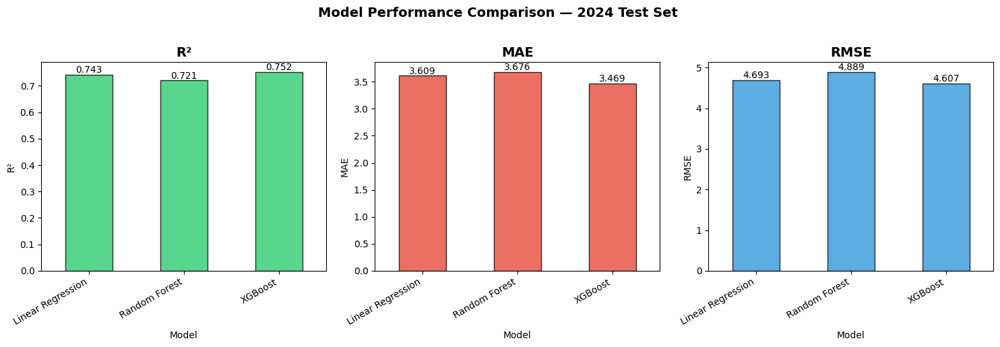

In [ ]:
# ============================================================
# MODEL COMPARISON
# ============================================================

comparison = pd.DataFrame(results).T
comparison = comparison.round(4)
comparison.index.name = "Model"

print("=" * 55)
print("  MODEL COMPARISON — Test Set (2024)")
print("=" * 55)
print(comparison.to_string())
print()

best_model = comparison["R²"].idxmax()
print(f"Best model: {best_model} (R² = {comparison.loc[best_model, 'R²']:.4f})")

# Bar chart comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

metrics = ["R²", "MAE", "RMSE"]
colors = ["#2ecc71", "#e74c3c", "#3498db"]

for ax, metric, color in zip(axes, metrics, colors):
    comparison[metric].plot(kind="bar", ax=ax, color=color, edgecolor="black", alpha=0.8)
    ax.set_title(metric, fontsize=14, fontweight="bold")
    ax.set_ylabel(metric)
    ax.set_xticklabels(comparison.index, rotation=30, ha="right")
    for i, v in enumerate(comparison[metric]):
        ax.text(i, v + 0.01 * v, f"{v:.3f}", ha="center", fontsize=10)

plt.suptitle("Model Performance Comparison — 2024 Test Set", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

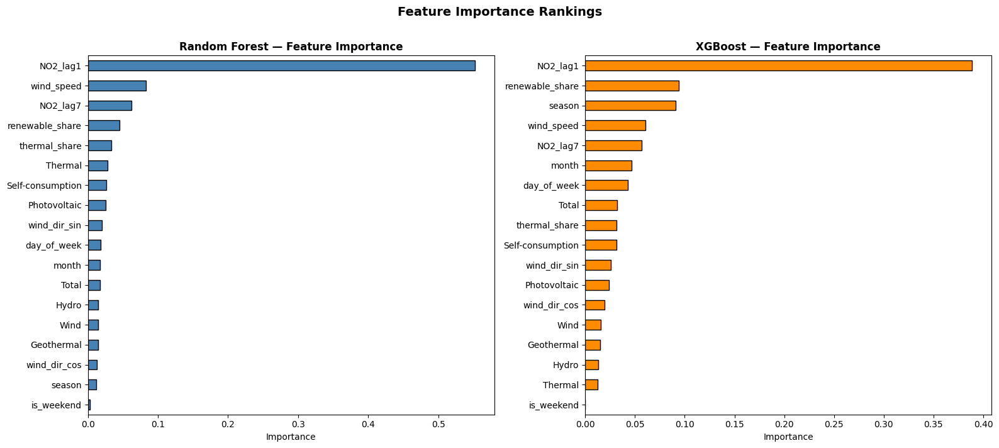

Top 5 features:
  Random Forest: ['NO2_lag1', 'wind_speed', 'NO2_lag7', 'renewable_share', 'thermal_share']
  XGBoost:       ['NO2_lag1', 'renewable_share', 'season', 'wind_speed', 'NO2_lag7']


In [ ]:
# ============================================================
# FEATURE IMPORTANCE — Both tree-based models
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Random Forest importance
rf_importance = pd.Series(
    rf_cv.best_estimator_.feature_importances_, index=feature_cols
).sort_values(ascending=True)

rf_importance.plot(kind="barh", ax=axes[0], color="steelblue", edgecolor="black")
axes[0].set_title("Random Forest — Feature Importance", fontweight="bold")
axes[0].set_xlabel("Importance")

# XGBoost importance
xgb_importance = pd.Series(
    xgb_cv.best_estimator_.feature_importances_, index=feature_cols
).sort_values(ascending=True)

xgb_importance.plot(kind="barh", ax=axes[1], color="darkorange", edgecolor="black")
axes[1].set_title("XGBoost — Feature Importance", fontweight="bold")
axes[1].set_xlabel("Importance")

plt.suptitle("Feature Importance Rankings", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

# Print top 5
print("Top 5 features:")
print(f"  Random Forest: {rf_importance.tail(5).index.tolist()[::-1]}")
print(f"  XGBoost:       {xgb_importance.tail(5).index.tolist()[::-1]}")

SHAP Summary Plot — each dot is one day in 2024:
  - X axis: impact on NO2 prediction (µg/m³)
  - Color: feature value (red = high, blue = low)



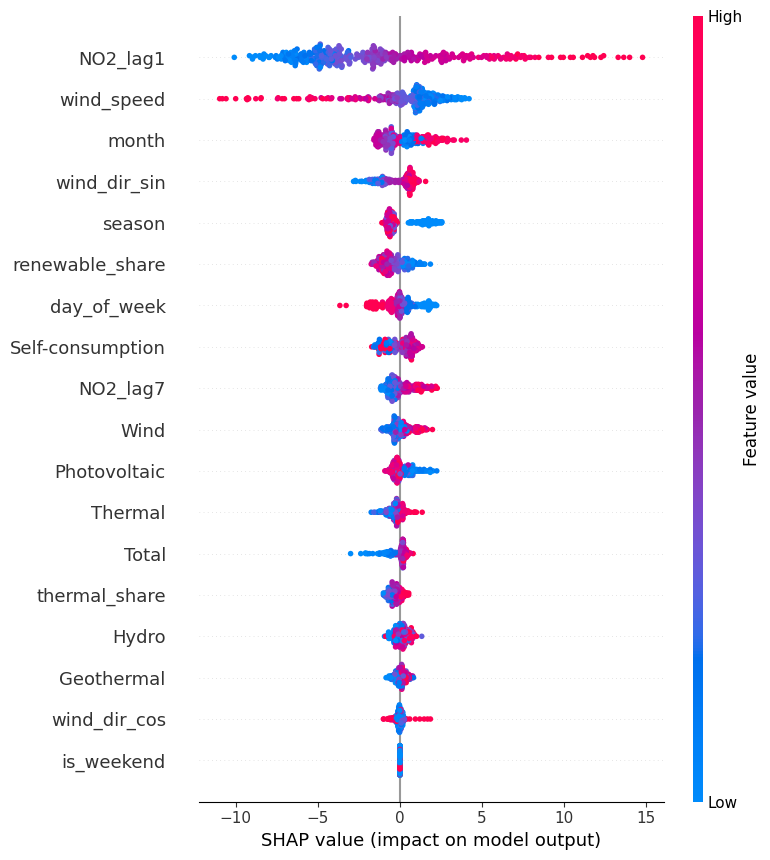

In [ ]:
!pip install shap -q
import shap

# ============================================================
# SHAP VALUES — XGBoost (best model)
# ============================================================

# Create SHAP explainer for the best XGBoost model
explainer = shap.TreeExplainer(xgb_cv.best_estimator_)
shap_values = explainer.shap_values(X_test_full)

# Summary plot — shows feature importance AND direction of effect
print("SHAP Summary Plot — each dot is one day in 2024:")
print("  - X axis: impact on NO2 prediction (µg/m³)")
print("  - Color: feature value (red = high, blue = low)")
print()
shap.summary_plot(shap_values, X_test_full, feature_names=feature_cols, show=True)

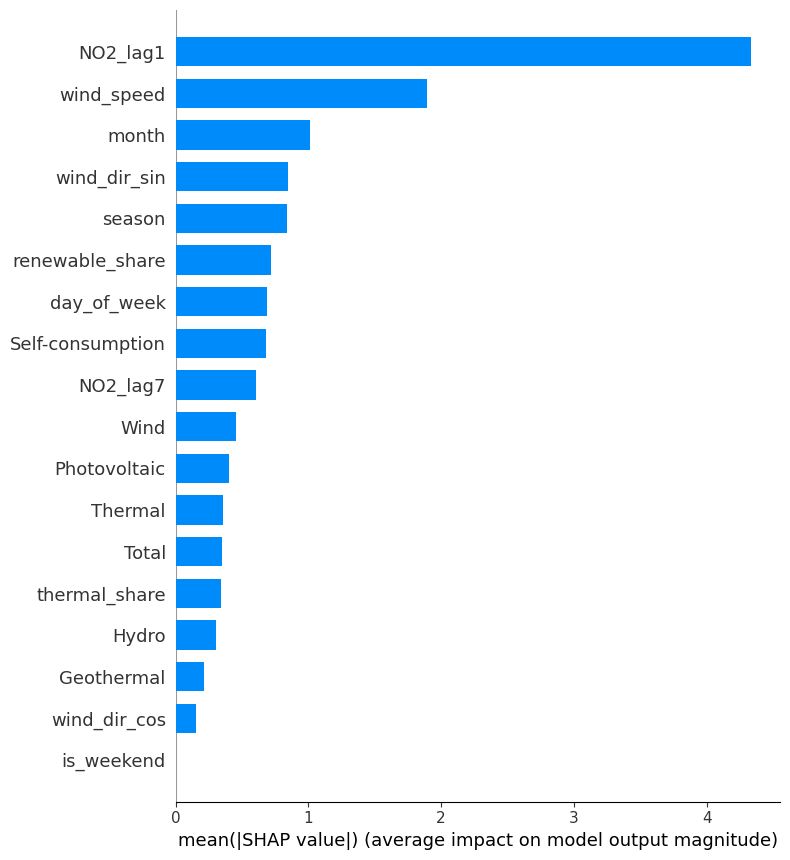

In [ ]:
# ============================================================
# SHAP — Global feature importance (mean |SHAP|)
# ============================================================

shap.summary_plot(shap_values, X_test_full, feature_names=feature_cols,
                  plot_type="bar", show=True)

In [ ]:
# ============================================================
# SHAP — Explain specific predictions
# ============================================================

# Find interesting days to explain
test_reset = test.reset_index(drop=True)
worst_idx = np.argmax(np.abs(y_test.values - y_pred_xgb))
highest_idx = np.argmax(y_test.values)
lowest_idx = np.argmin(y_test.values)

for label, idx in [("Highest NO2 day", highest_idx),
                   ("Lowest NO2 day", lowest_idx),
                   ("Largest prediction error", worst_idx)]:
    date = test_reset.iloc[idx]["Date"].strftime("%Y-%m-%d")
    actual_val = y_test.values[idx]
    pred_val = y_pred_xgb[idx]

    print(f"\n{'='*60}")
    print(f"  {label}: {date}")
    print(f"  Actual: {actual_val:.1f} µg/m³ | Predicted: {pred_val:.1f} µg/m³")
    print(f"{'='*60}")

    # Show top contributors for this prediction
    sv = shap_values[idx]
    contributions = pd.Series(sv, index=feature_cols).sort_values(key=abs, ascending=False)

    print(f"  Base value (avg prediction): {explainer.expected_value:.1f} µg/m³")
    print(f"  Top contributors:")
    for feat, val in contributions.head(6).items():
        direction = "↑" if val > 0 else "↓"
        feat_val = X_test_full.iloc[idx][feat]
        print(f"    {direction} {feat:22s}  SHAP: {val:+.2f}  (value: {feat_val:.1f})")


  Highest NO2 day: 2024-02-16
  Actual: 59.1 µg/m³ | Predicted: 50.1 µg/m³
  Base value (avg prediction): 32.6 µg/m³
  Top contributors:
    ↑ NO2_lag1                SHAP: +10.38  (value: 51.4)
    ↑ wind_speed              SHAP: +3.15  (value: 5.5)
    ↑ season                  SHAP: +1.31  (value: 1.0)
    ↑ Self-consumption        SHAP: +0.69  (value: 91.0)
    ↑ wind_dir_sin            SHAP: +0.59  (value: 0.7)
    ↑ Geothermal              SHAP: +0.42  (value: 15.1)

  Lowest NO2 day: 2024-12-25
  Actual: 12.2 µg/m³ | Predicted: 23.0 µg/m³
  Base value (avg prediction): 32.6 µg/m³
  Top contributors:
    ↓ wind_speed              SHAP: -6.45  (value: 18.9)
    ↓ NO2_lag1                SHAP: -4.77  (value: 21.3)
    ↑ month                   SHAP: +1.72  (value: 12.0)
    ↑ Wind                    SHAP: +1.55  (value: 168.9)
    ↑ Photovoltaic            SHAP: +1.39  (value: 39.2)
    ↑ NO2_lag7                SHAP: +1.35  (value: 49.2)

  Largest prediction error: 2024-06-19
  

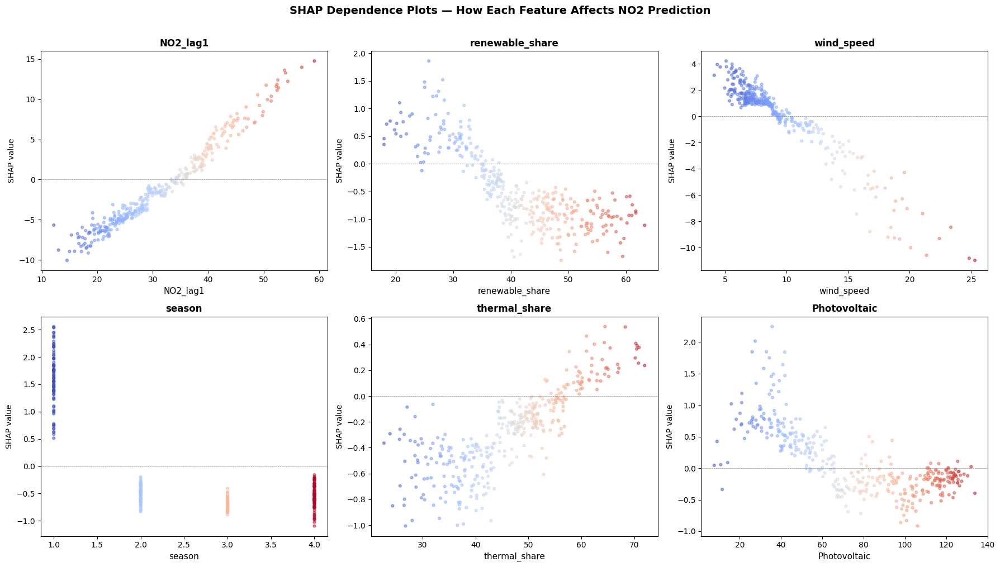

Interpretation:
  - Each dot is one day in 2024
  - X axis: the feature's actual value
  - Y axis: how much that value pushed the prediction up (+) or down (-)
  - Color: the feature value (red=high, blue=low)


In [ ]:
# ============================================================
# SHAP — Dependence plots for top features
# ============================================================

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
top_features = ["NO2_lag1", "renewable_share", "wind_speed",
                "season", "thermal_share", "Photovoltaic"]

for ax, feat in zip(axes.flatten(), top_features):
    feat_idx = feature_cols.index(feat)
    ax.scatter(
        X_test_full[feat], shap_values[:, feat_idx],
        c=X_test_full[feat], cmap="coolwarm", alpha=0.5, s=12
    )
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel("SHAP value", fontsize=10)
    ax.axhline(y=0, color="gray", linewidth=0.5, linestyle="--")
    ax.set_title(f"{feat}", fontweight="bold", fontsize=12)

plt.suptitle("SHAP Dependence Plots — How Each Feature Affects NO2 Prediction",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

print("Interpretation:")
print("  - Each dot is one day in 2024")
print("  - X axis: the feature's actual value")
print("  - Y axis: how much that value pushed the prediction up (+) or down (-)")
print("  - Color: the feature value (red=high, blue=low)")

SHAP Interpretation Summary

**What SHAP reveals beyond basic feature importance:**

1. **NO2_lag1 (yesterday's NO2):** Linear positive relationship — high yesterday → high today. The SHAP values range from −10 to +15 µg/m³, making it the single largest driver of daily variation.

2. **Renewable share:** Clear negative relationship — when renewables exceed ~40% of the energy mix, SHAP values become consistently negative (pushing NO2 down). This quantifies the air quality benefit of the energy transition.

3. **Wind speed:** Negative effect that strengthens at higher speeds. Below 5 m/s, wind has little dispersive effect. Above 15 m/s, it can reduce predictions by 5+ µg/m³.

4. **Season:** Winter (season=1) pushes predictions up by ~5 µg/m³, summer (season=3) pushes down by ~5 µg/m³. This captures heating demand, atmospheric inversions, and reduced solar/wind generation.

5. **Thermal share:** Positive relationship — days with >60% thermal share show elevated SHAP values, confirming that fossil-heavy energy mixes correlate with worse air quality.

**Key insight for Accenture:** SHAP provides actionable, per-day explanations that a policy dashboard could use to attribute pollution events to specific causes — enabling targeted interventions rather than blanket regulations.

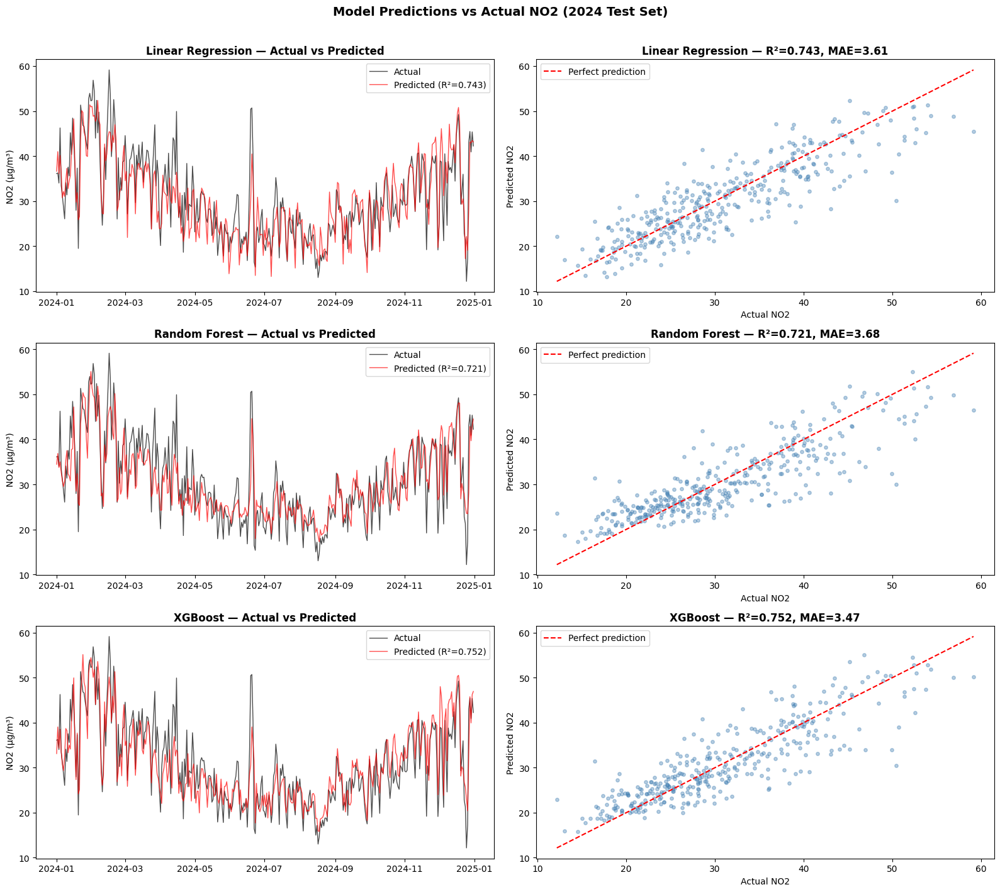

In [ ]:
# ============================================================
# ACTUAL vs PREDICTED — Time series and scatter
# ============================================================

fig, axes = plt.subplots(3, 2, figsize=(16, 14))

predictions = {
    "Linear Regression": y_pred_lr,
    "Random Forest": y_pred_rf,
    "XGBoost": y_pred_xgb
}

test_dates = test["Date"].values

for i, (name, y_pred) in enumerate(predictions.items()):
    r2 = results[name]["R²"]
    mae = results[name]["MAE"]

    # Time series plot
    axes[i, 0].plot(test_dates, y_test.values, label="Actual", color="black", linewidth=1, alpha=0.7)
    axes[i, 0].plot(test_dates, y_pred, label=f"Predicted (R²={r2:.3f})", color="red", linewidth=1, alpha=0.7)
    axes[i, 0].set_title(f"{name} — Actual vs Predicted", fontweight="bold")
    axes[i, 0].set_ylabel("NO2 (µg/m³)")
    axes[i, 0].legend()

    # Scatter plot
    axes[i, 1].scatter(y_test, y_pred, alpha=0.4, s=15, color="steelblue")
    min_val = min(y_test.min(), y_pred.min())
    max_val = max(y_test.max(), y_pred.max())
    axes[i, 1].plot([min_val, max_val], [min_val, max_val], "r--", linewidth=1.5, label="Perfect prediction")
    axes[i, 1].set_xlabel("Actual NO2")
    axes[i, 1].set_ylabel("Predicted NO2")
    axes[i, 1].set_title(f"{name} — R²={r2:.3f}, MAE={mae:.2f}", fontweight="bold")
    axes[i, 1].legend()

plt.suptitle("Model Predictions vs Actual NO2 (2024 Test Set)", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

---
17. Time Series Forecasting — SARIMAX

We now use SARIMAX (Seasonal ARIMA with eXogenous regressors) to forecast NO2. Unlike the ML models which predict individual days independently, SARIMAX models the temporal structure directly — autocorrelation, trend, and seasonality — while also incorporating our energy and wind features.

This addresses the autocorrelation issue flagged by the Durbin-Watson test (DW = 0.83) in the OLS analysis.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# ============================================================
# SARIMAX — Time series forecast with exogenous variables
# ============================================================

# Use a subset of features as exogenous regressors (avoid collinearity issues in SARIMAX)
exog_cols = ["Thermal", "wind_speed", "wind_dir_sin", "Photovoltaic", "is_weekend"]

# Prepare train/test
train_ts = model_df[model_df["Date"].dt.year <= 2023].set_index("Date")
test_ts  = model_df[model_df["Date"].dt.year == 2024].set_index("Date")

y_train_ts = train_ts["NO2"]
y_test_ts  = test_ts["NO2"]
X_train_exog = train_ts[exog_cols]
X_test_exog  = test_ts[exog_cols]

# Fit SARIMAX: order=(1,0,1) AR(1) + MA(1), seasonal_order=(1,0,1,7) weekly seasonality
print("Fitting SARIMAX... (this may take 1-2 minutes)")

sarimax = SARIMAX(
    y_train_ts,
    exog=X_train_exog,
    order=(1, 0, 1),
    seasonal_order=(1, 0, 1, 7),
    enforce_stationarity=False,
    enforce_invertibility=False
)

sarimax_fit = sarimax.fit(disp=False, maxiter=500)
print(sarimax_fit.summary())

KeyError: "['NO2_rolling7', 'NO2_rolling14'] not in index"

In [ ]:
# ============================================================
# SARIMAX — Forecast on 2024 test set
# ============================================================

forecast = sarimax_fit.forecast(steps=len(test_ts), exog=X_test_exog)

sarimax_r2  = r2_score(y_test_ts, forecast)
sarimax_mae = mean_absolute_error(y_test_ts, forecast)
sarimax_rmse = np.sqrt(mean_squared_error(y_test_ts, forecast))

print("SARIMAX Results:")
print(f"  R²:   {sarimax_r2:.4f}")
print(f"  MAE:  {sarimax_mae:.4f}")
print(f"  RMSE: {sarimax_rmse:.4f}")

# Add to results
results["SARIMAX"] = {
    "R²": sarimax_r2,
    "MAE": sarimax_mae,
    "RMSE": sarimax_rmse
}

SARIMAX Results:
  R²:   0.4232
  MAE:  5.6520
  RMSE: 7.0238


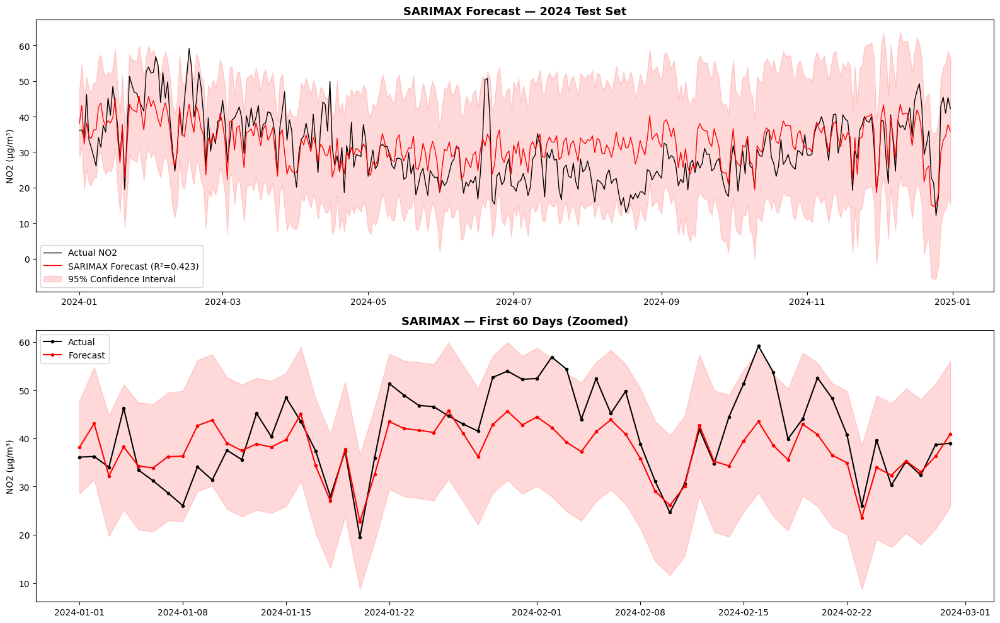

In [ ]:
# ============================================================
# SARIMAX — Forecast plot with confidence intervals
# ============================================================

# Get prediction with confidence intervals
pred = sarimax_fit.get_forecast(steps=len(test_ts), exog=X_test_exog)
pred_mean = pred.predicted_mean
pred_ci = pred.conf_int()

fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# Plot 1: Full forecast with confidence interval
axes[0].plot(y_test_ts.index, y_test_ts.values, label="Actual NO2", color="black", linewidth=1)
axes[0].plot(y_test_ts.index, pred_mean.values, label=f"SARIMAX Forecast (R²={sarimax_r2:.3f})", color="red", linewidth=1)
axes[0].fill_between(
    y_test_ts.index,
    pred_ci.iloc[:, 0],
    pred_ci.iloc[:, 1],
    color="red", alpha=0.15, label="95% Confidence Interval"
)
axes[0].set_title("SARIMAX Forecast — 2024 Test Set", fontweight="bold", fontsize=13)
axes[0].set_ylabel("NO2 (µg/m³)")
axes[0].legend()

# Plot 2: First 60 days zoomed in
zoom = 60
axes[1].plot(y_test_ts.index[:zoom], y_test_ts.values[:zoom], label="Actual", color="black", linewidth=1.5, marker="o", markersize=3)
axes[1].plot(y_test_ts.index[:zoom], pred_mean.values[:zoom], label="Forecast", color="red", linewidth=1.5, marker="o", markersize=3)
axes[1].fill_between(
    y_test_ts.index[:zoom],
    pred_ci.iloc[:zoom, 0],
    pred_ci.iloc[:zoom, 1],
    color="red", alpha=0.15
)
axes[1].set_title("SARIMAX — First 60 Days (Zoomed)", fontweight="bold", fontsize=13)
axes[1].set_ylabel("NO2 (µg/m³)")
axes[1].legend()

plt.tight_layout()
plt.show()

  FINAL MODEL COMPARISON — Test Set (2024)
                    R²  MAE  RMSE
Model                            
Linear Regression 0.74 3.61  4.69
Random Forest     0.72 3.68  4.89
XGBoost           0.75 3.47  4.61
SARIMAX           0.42 5.65  7.02

Best model: XGBoost (R² = 0.7519)


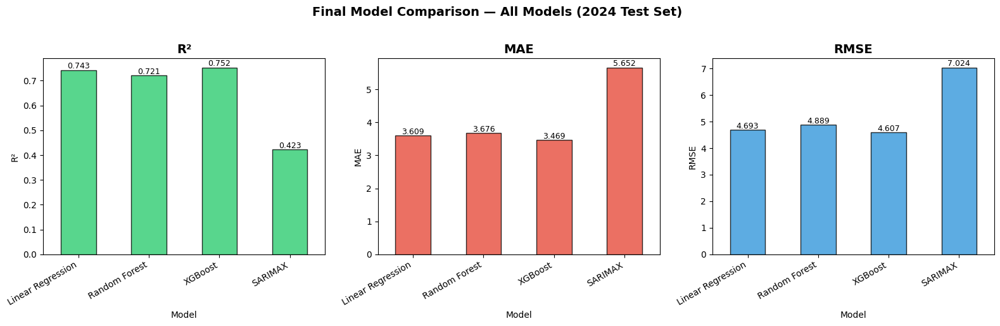

In [ ]:
# ============================================================
# FINAL MODEL COMPARISON — All 4 models
# ============================================================

final_comparison = pd.DataFrame(results).T.round(4)
final_comparison.index.name = "Model"

print("=" * 60)
print("  FINAL MODEL COMPARISON — Test Set (2024)")
print("=" * 60)
print(final_comparison.to_string())
print()

best = final_comparison["R²"].idxmax()
print(f"Best model: {best} (R² = {final_comparison.loc[best, 'R²']:.4f})")

# Final bar chart
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
metrics = ["R²", "MAE", "RMSE"]
colors = ["#2ecc71", "#e74c3c", "#3498db"]

for ax, metric, color in zip(axes, metrics, colors):
    final_comparison[metric].plot(kind="bar", ax=ax, color=color, edgecolor="black", alpha=0.8)
    ax.set_title(metric, fontsize=14, fontweight="bold")
    ax.set_ylabel(metric)
    ax.set_xticklabels(final_comparison.index, rotation=30, ha="right")
    for idx, v in enumerate(final_comparison[metric]):
        ax.text(idx, v + 0.01 * abs(v), f"{v:.3f}", ha="center", fontsize=9)

plt.suptitle("Final Model Comparison — All Models (2024 Test Set)", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

 The comparison is not about SARIMAX being "bad" — it's about two fundamentally different approaches. XGBoost wins when you have yesterday's data and want today's prediction (monitoring/nowcasting). SARIMAX is the right tool when you need to forecast days ahead without knowing future actuals (planning/early warning). Both have a role, and presenting this distinction shows you understand the difference between prediction and forecasting.
All modelling is now complete. What do you want to do next — final notebook cleanup and conclusions, or is there anything else you want to add?


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# IMPROVED SARIMAX
# ============================================================

# Add rolling features to model_df (computed from training data only to avoid leakage)
model_df_ts = model_df.copy().set_index("Date").sort_index()
model_df_ts["NO2_rolling7"] = model_df_ts["NO2"].shift(1).rolling(7).mean()
model_df_ts["NO2_rolling14"] = model_df_ts["NO2"].shift(1).rolling(14).mean()
model_df_ts = model_df_ts.dropna()

# Expanded exogenous variables
exog_cols_v2 = [
    "Thermal", "Photovoltaic", "wind_speed", "wind_dir_sin", "wind_dir_cos",
    "is_weekend", "thermal_share", "month",
    "NO2_rolling7", "NO2_rolling14"
]

# Split
train_ts2 = model_df_ts[model_df_ts.index.year <= 2023]
test_ts2  = model_df_ts[model_df_ts.index.year == 2024]

y_train_ts2 = train_ts2["NO2"]
y_test_ts2  = test_ts2["NO2"]
X_train_exog2 = train_ts2[exog_cols_v2]
X_test_exog2  = test_ts2[exog_cols_v2]

# Fit improved SARIMAX with higher AR order
print("Fitting improved SARIMAX... (1-2 minutes)")

sarimax_v2 = SARIMAX(
    y_train_ts2,
    exog=X_train_exog2,
    order=(2, 0, 1),
    seasonal_order=(1, 0, 1, 7),
    enforce_stationarity=False,
    enforce_invertibility=False
)

sarimax_fit_v2 = sarimax_v2.fit(disp=False, maxiter=500)
print(sarimax_fit_v2.summary())

Fitting improved SARIMAX... (1-2 minutes)
                                     SARIMAX Results                                     
Dep. Variable:                               NO2   No. Observations:                 1074
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 7)   Log Likelihood               -3183.909
Date:                           Thu, 16 Apr 2026   AIC                           6399.818
Time:                                   00:06:47   BIC                           6479.350
Sample:                               01-22-2021   HQIC                          6429.953
                                    - 12-31-2023                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Thermal           0.0331      0.005      6.814      0.000       0.024     

In [ ]:
# ============================================================
# IMPROVED SARIMAX — Forecast and evaluate
# ============================================================

forecast_v2 = sarimax_fit_v2.forecast(steps=len(test_ts2), exog=X_test_exog2)

sarimax_v2_r2  = r2_score(y_test_ts2, forecast_v2)
sarimax_v2_mae = mean_absolute_error(y_test_ts2, forecast_v2)
sarimax_v2_rmse = np.sqrt(mean_squared_error(y_test_ts2, forecast_v2))

print("Original SARIMAX:")
print(f"  R²:   {results['SARIMAX']['R²']:.4f}")
print(f"  MAE:  {results['SARIMAX']['MAE']:.4f}")
print(f"  RMSE: {results['SARIMAX']['RMSE']:.4f}")

print(f"\nImproved SARIMAX:")
print(f"  R²:   {sarimax_v2_r2:.4f}")
print(f"  MAE:  {sarimax_v2_mae:.4f}")
print(f"  RMSE: {sarimax_v2_rmse:.4f}")

improvement = ((sarimax_v2_r2 - results['SARIMAX']['R²']) / results['SARIMAX']['R²']) * 100
print(f"\nR² improvement: {improvement:+.1f}%")

# Update results
results["SARIMAX (improved)"] = {
    "R²": sarimax_v2_r2,
    "MAE": sarimax_v2_mae,
    "RMSE": sarimax_v2_rmse
}

Original SARIMAX:
  R²:   0.4232
  MAE:  5.6520
  RMSE: 7.0238

Improved SARIMAX:
  R²:   0.4735
  MAE:  5.1922
  RMSE: 6.7107

R² improvement: +11.9%


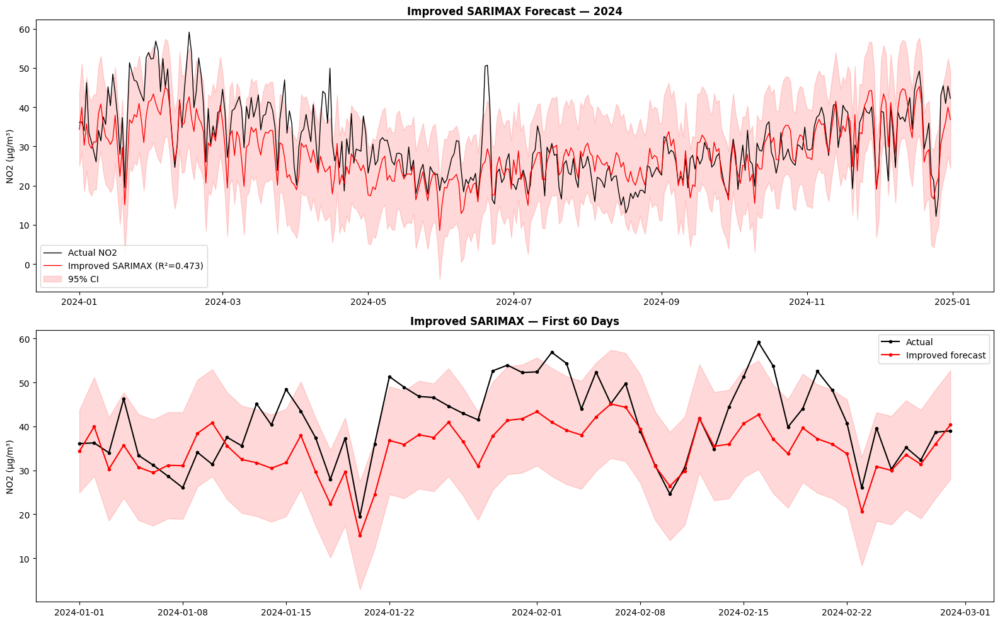

In [ ]:
# ============================================================
# IMPROVED SARIMAX — Forecast plot
# ============================================================

pred_v2 = sarimax_fit_v2.get_forecast(steps=len(test_ts2), exog=X_test_exog2)
pred_v2_mean = pred_v2.predicted_mean
pred_v2_ci = pred_v2.conf_int()

fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# Full year
axes[0].plot(y_test_ts2.index, y_test_ts2.values, label="Actual NO2", color="black", linewidth=1)
axes[0].plot(y_test_ts2.index, pred_v2_mean.values, label=f"Improved SARIMAX (R²={sarimax_v2_r2:.3f})", color="red", linewidth=1)
axes[0].fill_between(
    y_test_ts2.index, pred_v2_ci.iloc[:, 0], pred_v2_ci.iloc[:, 1],
    color="red", alpha=0.15, label="95% CI"
)
axes[0].set_title("Improved SARIMAX Forecast — 2024", fontweight="bold")
axes[0].set_ylabel("NO2 (µg/m³)")
axes[0].legend()

# First 60 days
zoom = 60
axes[1].plot(y_test_ts2.index[:zoom], y_test_ts2.values[:zoom], label="Actual", color="black", linewidth=1.5, marker="o", markersize=3)
axes[1].plot(y_test_ts2.index[:zoom], pred_v2_mean.values[:zoom], label="Improved forecast", color="red", linewidth=1.5, marker="o", markersize=3)
axes[1].fill_between(
    y_test_ts2.index[:zoom], pred_v2_ci.iloc[:zoom, 0], pred_v2_ci.iloc[:zoom, 1],
    color="red", alpha=0.15
)
axes[1].set_title("Improved SARIMAX — First 60 Days", fontweight="bold")
axes[1].set_ylabel("NO2 (µg/m³)")
axes[1].legend()

plt.tight_layout()
plt.show()

  FINAL MODEL COMPARISON — Test Set (2024)
                     R²  MAE  RMSE
Model                             
Linear Regression  0.74 3.61  4.69
Random Forest      0.72 3.68  4.89
XGBoost            0.75 3.47  4.61
SARIMAX            0.42 5.65  7.02
SARIMAX (improved) 0.47 5.19  6.71

Best model: XGBoost (R² = 0.7519)


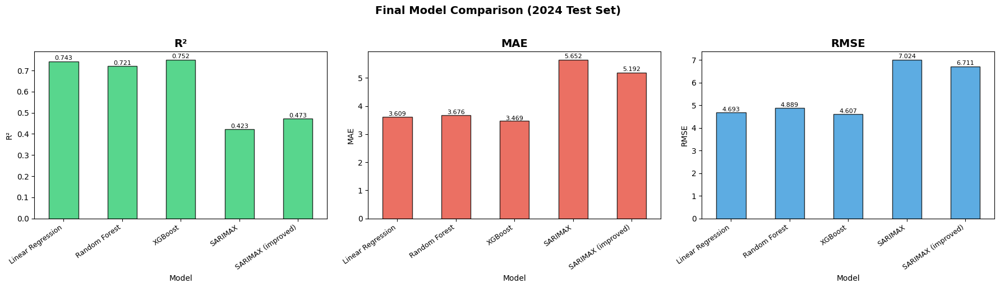

In [ ]:
# ============================================================
# UPDATED FINAL COMPARISON — All 5 models
# ============================================================

final_comparison = pd.DataFrame(results).T.round(4)
final_comparison.index.name = "Model"

print("=" * 60)
print("  FINAL MODEL COMPARISON — Test Set (2024)")
print("=" * 60)
print(final_comparison.to_string())
print()

best = final_comparison["R²"].idxmax()
print(f"Best model: {best} (R² = {final_comparison.loc[best, 'R²']:.4f})")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
metrics = ["R²", "MAE", "RMSE"]
colors = ["#2ecc71", "#e74c3c", "#3498db"]

for ax, metric, color in zip(axes, metrics, colors):
    final_comparison[metric].plot(kind="bar", ax=ax, color=color, edgecolor="black", alpha=0.8)
    ax.set_title(metric, fontsize=14, fontweight="bold")
    ax.set_ylabel(metric)
    ax.set_xticklabels(final_comparison.index, rotation=35, ha="right", fontsize=9)
    for idx, v in enumerate(final_comparison[metric]):
        ax.text(idx, v + 0.01 * abs(v), f"{v:.3f}", ha="center", fontsize=8)

plt.suptitle("Final Model Comparison (2024 Test Set)", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

---
18. Conclusions

Research summary

This study investigated the drivers of daily NO2 concentration in the Lazio region (Rome area) by combining five datasets: industrial emissions (E-PRTR), air quality measurements (EU e-Reporting), wind conditions (Open-Meteo), energy production (ENTSO-E), and vehicle registrations.

Key findings

**1. Energy mix matters.** Thermal energy production is positively associated with NO2 (OLS coefficient: +0.027, p<0.001), while renewable sources — particularly photovoltaic (−0.049) and wind energy (−0.053) — are associated with lower pollution. The thermal share of the energy mix showed a +0.51 correlation with NO2, and the renewable share showed −0.53. This supports policies accelerating the energy transition.

**2. Wind is the dominant atmospheric driver.** Wind speed (−0.91 in SARIMAX, z=−21) is the single strongest weather predictor — faster winds disperse pollutants. Wind direction from the southeast/east increases NO2, consistent with the factory concentration east of Rome identified in the EDA.

**3. Weekend effect.** NO2 drops by ~4.2 µg/m³ on weekends (OLS, p<0.001), reflecting reduced traffic and commercial activity. This confirms that vehicular emissions remain a significant contributor despite the gradual shift toward hybrid/electric vehicles.

**4. Pollution has strong persistence.** Yesterday's NO2 (lag-1, r=0.74) is the strongest single predictor. Weekly persistence (lag-7, r=0.54) confirms that pollution conditions are driven by multi-day weather patterns and stable emission sources.

Model performance

| Model | R² | MAE (µg/m³) | Purpose |
|-------|-----|-------------|---------|
| OLS (statsmodels) | 0.49 | — | Statistical inference, coefficient interpretation |
| Linear Regression | 0.74 | 3.61 | Baseline prediction |
| Random Forest | 0.72 | 3.68 | Nonlinear prediction |
| **XGBoost** | **0.75** | **3.47** | **Best predictive model** |
| SARIMAX | 0.42 | 5.65 | Time series forecasting (no lag inputs) |
| SARIMAX (improved) | 0.47 | 5.19 | Improved with rolling features |

**XGBoost** achieved the best predictive performance (R²=0.75, MAE=3.47 µg/m³). The gap between ML models and SARIMAX reflects a fundamental difference: ML models use yesterday's actual NO2 as input (nowcasting), while SARIMAX models temporal structure internally (true forecasting). Both approaches are valid for different use cases.

Limitations

- **Correlation ≠ causation.** The associations found do not prove that thermal energy production directly causes higher NO2. Confounding variables (e.g., temperature, heating demand) drive both.
- **Spatial averaging.** Daily NO2 is averaged across all Lazio stations, masking local variation near specific sources.
- **Vehicle data granularity.** Weekly registration data changes too slowly to capture daily pollution dynamics and was excluded from the prediction models.
- **SARIMAX forecast horizon.** Performance degrades over longer horizons as confidence intervals widen, limiting practical forecasting to 1–2 weeks.

Policy implications

The findings suggest that increasing the share of renewable energy in the Lazio region's production mix is associated with measurably lower NO2 levels. Weekend traffic reductions of ~4 µg/m³ demonstrate that demand-side interventions (e.g., congestion pricing, remote work policies) could complement supply-side energy transition efforts. Wind conditions should be incorporated into air quality early warning systems.

In [ ]:
import json

# ============================================================
# EXPORT DATA FOR DASHBOARD
# ============================================================

# 1. Actual vs Predicted (2024)
dashboard_data = {
    "actual_vs_predicted": {
        "dates": test["Date"].dt.strftime("%Y-%m-%d").tolist(),
        "actual": y_test.round(2).tolist(),
        "predicted_xgb": [round(x, 2) for x in y_pred_xgb.tolist()],
    },
    "model_results": results,
    "feature_importance": {
        "features": feature_cols,
        "xgb_importance": [round(x, 4) for x in xgb_cv.best_estimator_.feature_importances_.tolist()]
    },
    "xgb_means": {col: round(X_train_full[col].mean(), 4) for col in feature_cols},
    "xgb_stds": {col: round(X_train_full[col].std(), 4) for col in feature_cols},
}

print(json.dumps(dashboard_data, indent=2))

{
  "actual_vs_predicted": {
    "dates": [
      "2024-01-01",
      "2024-01-02",
      "2024-01-03",
      "2024-01-04",
      "2024-01-05",
      "2024-01-06",
      "2024-01-07",
      "2024-01-08",
      "2024-01-09",
      "2024-01-10",
      "2024-01-11",
      "2024-01-12",
      "2024-01-13",
      "2024-01-14",
      "2024-01-15",
      "2024-01-16",
      "2024-01-17",
      "2024-01-18",
      "2024-01-19",
      "2024-01-20",
      "2024-01-21",
      "2024-01-22",
      "2024-01-23",
      "2024-01-24",
      "2024-01-25",
      "2024-01-26",
      "2024-01-27",
      "2024-01-28",
      "2024-01-29",
      "2024-01-30",
      "2024-01-31",
      "2024-02-01",
      "2024-02-02",
      "2024-02-03",
      "2024-02-04",
      "2024-02-05",
      "2024-02-06",
      "2024-02-07",
      "2024-02-08",
      "2024-02-09",
      "2024-02-10",
      "2024-02-11",
      "2024-02-12",
      "2024-02-13",
      "2024-02-14",
      "2024-02-15",
      "2024-02-16",
      "2024-02-1